# Прогнозирование продаж в магазинах офлаин-ритейлера в США <a class="tocSkip">

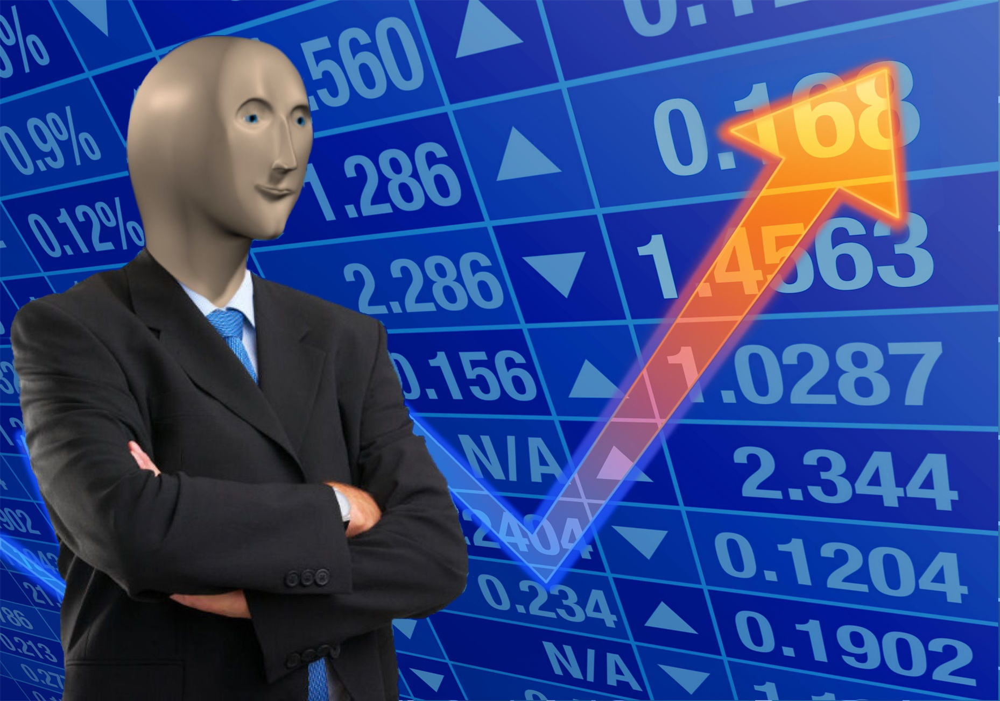

В качестве экзаменационного задания вам предстоит построить модель прогнозирования спроса(продаж) на товары в магазинах офлаин-ритейлера в США . Всего в датасете 3 магазина, в каждом магазине по 15 артикулов (товаров). Вам нужно выбрать 1 магазин (любой из 3).

Прогнозировать продажи нужно на неделю, на месяц и на квартал.

В качестве дополнительной информации вам переданы данные о цене товара (меняются раз в неделю, а также о праздниках в США).

Задание 1. Реализовать класс, который умеет: 

1) предобрабатывать исходные данные в удобный формат; 

2) обучаться для задачи прогнозирования; 

3) оценивать качество своих прогнозов;

4) сохранять модели и подгружать их; 

5) Прогнозировать продажи на неделю, на месяц и на квартал.

Должна быть рабочая программа, которая делает инференс (прогнозирование на произвольном тестовом датасете (аналогично тому, который есть у вас)).


Задача 2. Подготовить отчёт о решении данной задачи в виде jupyter ноутбука. В отчёте, в частности, вы должны ответить на следующие вопросы:

1) Какие методы предобработки данных вы использовали?

2) Какие модели пробовали? Почему пробовали именно их?

3) Как вы проверяете качество модели? На каких данных? Какие метрики используюте? Чем обусловлен выбор именно этих метрик?

4) Какое итоговое качество модели на тестовом датасете?

In [709]:
import matplotlib.pyplot as plt
import seaborn as sns
import scipy.stats as stats

import numpy as np
import pandas as pd
import math

from ts_forecasting_toolkit import TimeSeriesForecastingToolkit
from statsmodels.graphics.tsaplots import plot_acf

%config Application.log_level = 'ERROR'
import warnings
warnings.filterwarnings("ignore")

In [359]:
import logging

logging.getLogger("cmdstanpy").setLevel(logging.WARNING)

### Используем магазин 2

In [360]:
STORE = "STORE_2"
FIGSIZE = (10,8)
MAIN_RESULTS = {}

In [361]:
sales = pd.read_csv('../data/shop_sales.csv')
sales = sales[sales['store_id'] == STORE]
sales.drop(['store_id'], axis=1, inplace=True)
sales.head()

,item_id,date_id,cnt
0,STORE_2_085,1,3
1,STORE_2_085,2,8
2,STORE_2_085,3,0
3,STORE_2_085,4,3
4,STORE_2_085,5,0


In [362]:
calendar = pd.read_csv('../data/shop_sales_dates.csv')
calendar.drop(['weekday', 'CASHBACK_STORE_1', 'CASHBACK_STORE_3'], axis=1, inplace=True)
calendar.head()


,date,wm_yr_wk,wday,month,year,event_name_1,event_type_1,event_name_2,event_type_2,date_id,CASHBACK_STORE_2
0,2011-01-29,11101,1,1,2011,NaN,NaN,NaN,NaN,1,0
1,2011-01-30,11101,2,1,2011,NaN,NaN,NaN,NaN,2,0
2,2011-01-31,11101,3,1,2011,NaN,NaN,NaN,NaN,3,0
3,2011-02-01,11101,4,2,2011,NaN,NaN,NaN,NaN,4,1
4,2011-02-02,11101,5,2,2011,NaN,NaN,NaN,NaN,5,1


In [363]:
prices = pd.read_csv('../data/shop_sales_prices.csv')
prices = prices[prices['store_id'] == STORE]
prices.drop(['store_id'], axis=1, inplace=True)
prices.head()

,item_id,wm_yr_wk,sell_price
0,STORE_2_085,11101,1.00
1,STORE_2_043,11101,2.88
2,STORE_2_054,11101,2.28
3,STORE_2_090,11101,1.25
4,STORE_2_252,11101,1.48


In [364]:
print(len(sales))
print(len(calendar))
print(len(prices))

27285
1819
3697


In [365]:
sales_merged = sales.merge(calendar, how='left', on='date_id')
sales_merged = sales_merged.merge(prices, how='left', on=['wm_yr_wk', 'item_id'])
sales_merged["has_event"] = sales_merged[['event_name_1', 'event_name_2']].notnull().any(axis=1) 
sales_merged.head()

,item_id,date_id,cnt,date,wm_yr_wk,wday,month,year,event_name_1,event_type_1,event_name_2,event_type_2,CASHBACK_STORE_2,sell_price,has_event
0,STORE_2_085,1,3,2011-01-29,11101,1,1,2011,NaN,NaN,NaN,NaN,0,1.0,False
1,STORE_2_085,2,8,2011-01-30,11101,2,1,2011,NaN,NaN,NaN,NaN,0,1.0,False
2,STORE_2_085,3,0,2011-01-31,11101,3,1,2011,NaN,NaN,NaN,NaN,0,1.0,False
3,STORE_2_085,4,3,2011-02-01,11101,4,2,2011,NaN,NaN,NaN,NaN,1,1.0,False
4,STORE_2_085,5,0,2011-02-02,11101,5,2,2011,NaN,NaN,NaN,NaN,1,1.0,False


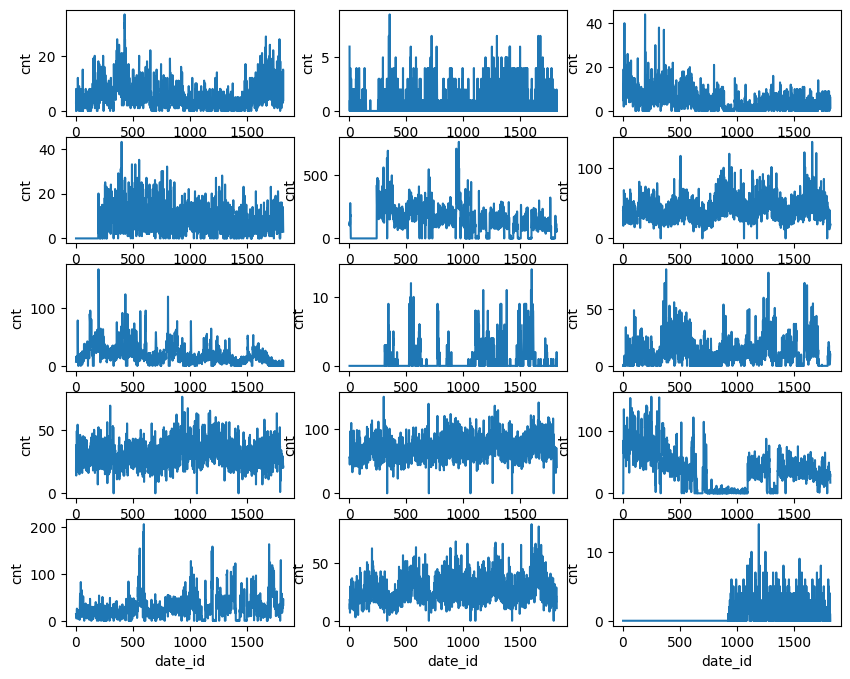

In [366]:
fig,ax = plt.subplots(5,3,figsize=FIGSIZE)

for i, art in enumerate(sales_merged.item_id.unique()):
    sns.lineplot(data = sales[(sales.item_id==art)],
                 x='date_id',y='cnt',ax = ax[i//3][i%3])

In [367]:
sales_merged['date'] = pd.to_datetime(sales_merged['date'])

sales_merged['lag_1'] = sales_merged['cnt'].shift(1)
sales_merged['lag_7'] = sales_merged['cnt'].shift(7)
sales_merged['lag_30'] = sales_merged['cnt'].shift(30)
sales_merged['lag_90'] = sales_merged['cnt'].shift(90)

sales_merged['is_christmas'] = (
    (sales_merged['date'].dt.month == 12) & 
    (sales_merged['date'].dt.day == 25)
).astype(int)


last_date = sales_merged['date'].max()
quarter_start = last_date - pd.DateOffset(months=3) 

train = sales_merged[sales_merged['date'] < quarter_start].copy()
test = sales_merged[sales_merged['date'] >= quarter_start].copy()

print(f"Train shape: {train.shape}")
print(f"Test shape: {test.shape}")
print(f"Train ends: {train['date'].max().date()}, Test starts: {test['date'].min().date()}")

Train shape: (25890, 20)
Test shape: (1395, 20)
Train ends: 2015-10-20, Test starts: 2015-10-21


In [368]:
event_1 = sales_merged[['date', 'event_name_1']].dropna().rename(columns={'event_name_1': 'holiday'})
event_2 = sales_merged[['date', 'event_name_2']].dropna().rename(columns={'event_name_2': 'holiday'})

holidays_df = pd.concat([event_1, event_2])
holidays_df = holidays_df.drop_duplicates().reset_index(drop=True)
holidays_df = holidays_df.rename(columns={'date': 'ds'})
holidays_df['ds'] = pd.to_datetime(holidays_df['ds'])

print("Праздников: ", len(set(list(holidays_df['holiday']))))
print(list(set(list(holidays_df['holiday']))))


Праздников:  30
['VeteransDay', 'IndependenceDay', 'ColumbusDay', 'Thanksgiving', 'MartinLutherKingDay', 'OrthodoxChristmas', 'NBAFinalsStart', 'LentWeek2', "Father's day", 'Chanukah End', 'SuperBowl', 'LaborDay', 'LentStart', 'Pesach End', 'OrthodoxEaster', 'MemorialDay', "Mother's day", 'Ramadan starts', 'EidAlAdha', 'StPatricksDay', 'Purim End', 'ValentinesDay', 'NBAFinalsEnd', 'Christmas', 'Halloween', 'Eid al-Fitr', 'NewYear', 'Cinco De Mayo', 'Easter', 'PresidentsDay']


In [369]:
holiday_windows = {
    'Purim End': (0, 0),
    'LentWeek2': (0, 6),
    'Cinco De Mayo': (0, 0),
    'Thanksgiving': (-1, 2),
    'ColumbusDay': (0, 0),
    'Halloween': (-10, 2),
    'Pesach End': (0, 1),
    'ValentinesDay': (-5, 1),
    "Mother's day": (-3, 0),
    "Father's day": (-3, 0),
    'LentStart': (0, 0),
    'OrthodoxEaster': (0, 0),
    'NewYear': (-5, 3),
    'StPatricksDay': (0, 0),
    'Ramadan starts': (-1, 29),
    'Easter': (0, 1),
    'Eid al-Fitr': (0, 2),
    'OrthodoxChristmas': (0, 0),
    'Chanukah End': (-7, 0),
    'VeteransDay': (0,0),
    'MartinLutherKingDay': (0, 0),
    'NBAFinalsStart': (0, 10),
    'IndependenceDay': (-3, 1),
    'Christmas': (-10, 5),
    'MemorialDay': (0, 0),
    'SuperBowl': (-1, 1),
    'EidAlAdha': (0, 3),
    'PresidentsDay': (-2, 2),
    'LaborDay': (0, 0),
    'NBAFinalsEnd': (-10, 0)
}

for holiday, (lower, upper) in holiday_windows.items():
    mask = holidays_df['holiday'] == holiday
    holidays_df.loc[mask, 'lower_window'] = lower
    holidays_df.loc[mask, 'upper_window'] = upper


significant_holidays = [
    'Christmas',
    'NewYear',
    'Thanksgiving',
    'ValentinesDay',
    "Mother's day",
    "Father's day",
    'Halloween',
    'IndependenceDay'
]

significant_holidays_df = holidays_df[
    holidays_df['holiday'].isin(significant_holidays)
]


holidays_df.head()

,ds,holiday,lower_window,upper_window
0,2011-02-06,SuperBowl,-1.0,1.0
1,2011-02-14,ValentinesDay,-5.0,1.0
2,2011-02-21,PresidentsDay,-2.0,2.0
3,2011-03-09,LentStart,0.0,0.0
4,2011-03-16,LentWeek2,0.0,6.0


In [370]:
significant_holidays_df.head(8)

,ds,holiday,lower_window,upper_window
1,2011-02-14,ValentinesDay,-5.0,1.0
10,2011-05-08,Mother's day,-3.0,0.0
14,2011-06-19,Father's day,-3.0,0.0
15,2011-07-04,IndependenceDay,-3.0,1.0
20,2011-10-31,Halloween,-10.0,2.0
23,2011-11-24,Thanksgiving,-1.0,2.0
24,2011-12-25,Christmas,-10.0,5.0
26,2012-01-01,NewYear,-5.0,3.0


In [371]:
print(sales_merged.item_id.unique())

['STORE_2_085' 'STORE_2_043' 'STORE_2_054' 'STORE_2_325' 'STORE_2_090'
 'STORE_2_252' 'STORE_2_376' 'STORE_2_391' 'STORE_2_524' 'STORE_2_555'
 'STORE_2_586' 'STORE_2_587' 'STORE_2_681' 'STORE_2_714' 'STORE_2_716']


## STORE_2_586

In [372]:
STORE = 'STORE_2_586'
MAIN_RESULTS[STORE] = {}
MAIN_RESULTS[STORE]['ets'] = {}
MAIN_RESULTS[STORE]['ets']['model_path'] = f'models/ets/model_{STORE}.pkl'
MAIN_RESULTS[STORE]['sarima'] = {}
MAIN_RESULTS[STORE]['sarima']['model_path'] = f'models/sarima/model_{STORE}.pkl'
MAIN_RESULTS[STORE]['prophet'] = {}
MAIN_RESULTS[STORE]['prophet']['model_path'] = f'models/prophet/model_{STORE}.pkl'
MAIN_RESULTS[STORE]['boosting'] = {}
MAIN_RESULTS[STORE]['boosting']['model_path'] = f'models/boosting/model_{STORE}.pkl'

In [373]:
df_train = train[train['item_id']==STORE]
df_train = df_train.sort_values('date_id')

In [374]:
df_test = test[test['item_id']==STORE]
df_test = df_test.sort_values('date_id')

In [375]:
ts_toolkit = TimeSeriesForecastingToolkit(df_train, period= 30, year=2012, date_col='date', event_cols=['event_name_1', 'event_name_2'])
ts_toolkit.yeojohnson_transform('cnt')

### EDA

Use self-module df


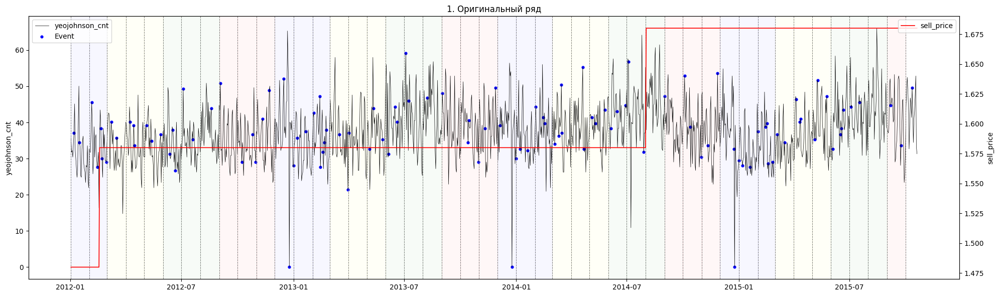

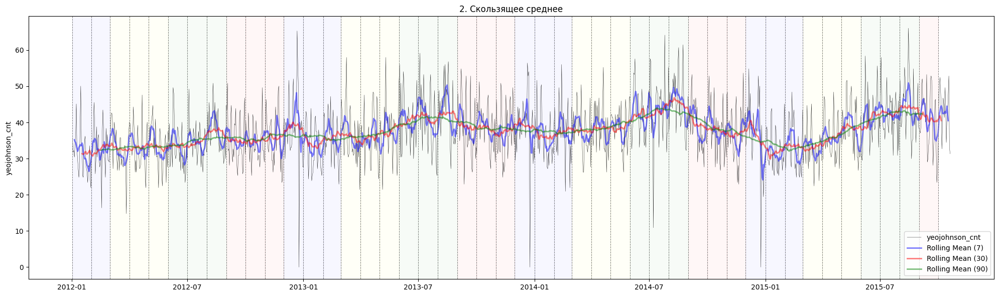

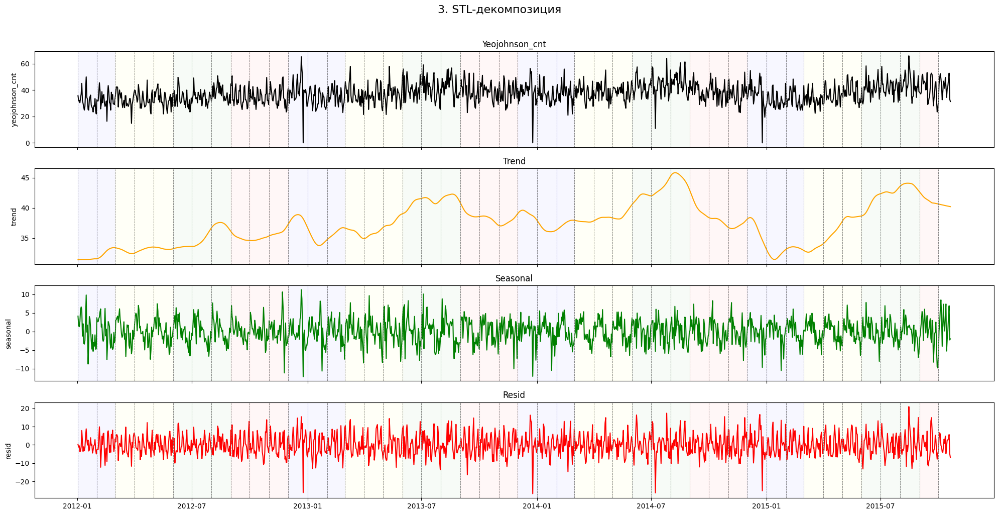

In [376]:
ts_toolkit.analyze(col='yeojohnson_cnt')

=== Стационарность: d=0, D=0 ===

=== KPSS Test ===
Statistic: 2.2498805453780424, p-value: 0.01
❌ Нестационарен

=== ADF Test ===
Statistic: -3.9748948171804512, p-value: 0.001547827480648112
✅ Стационарен


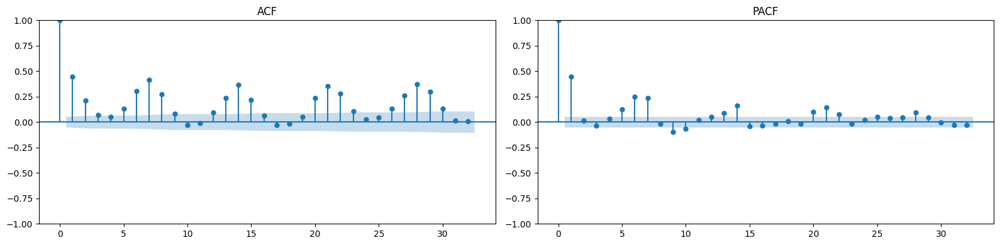

In [377]:
ts_toolkit.stationarity_tests(d=0, col='yeojohnson_cnt', plot=True)

=== Стационарность: d=1, D=0 ===

=== KPSS Test ===
Statistic: 0.03466139969821081, p-value: 0.1
✅ Стационарен

=== ADF Test ===
Statistic: -13.17137232507631, p-value: 1.2484370251871328e-24
✅ Стационарен


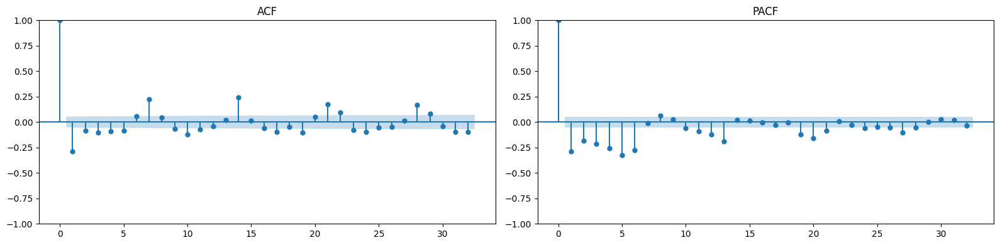

In [378]:
ts_toolkit.stationarity_tests(d=1, col='yeojohnson_cnt', plot=True)

=== Стационарность: d=1, D=1, period=7 ===

=== KPSS Test ===
Statistic: 0.04193112068574328, p-value: 0.1
✅ Стационарен

=== ADF Test ===
Statistic: -15.678850699102139, p-value: 1.4812682318080995e-28
✅ Стационарен


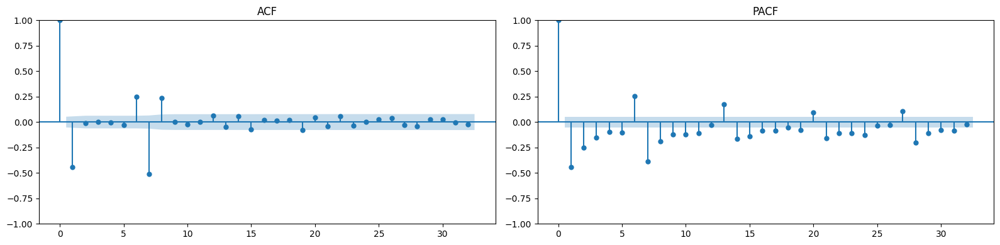

In [379]:
ts_toolkit.stationarity_tests(d=1, D=1, col='yeojohnson_cnt', plot=True, period=7)

### ETS MODEL

In [380]:
# ts_toolkit.fit('yeojohnson_cnt', model_type='ets', auto_fit_mode=True, verbose=False)
# ts_toolkit.save_model(path=MAIN_RESULTS[STORE]['ets']['model_path'])

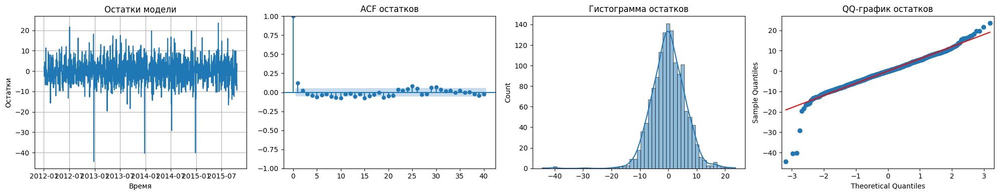

t-тест Стьюдента на равенство 0: t-статистика = 0.133, p-значение = 0.8944
✅ Среднее значение остатков не отличается от 0
Критерий Вилкоксона: статистика = 477740.000, p-значение = 0.7763
✅ Медиана остатков не отличается от 0
Тест Жарка-Бера: статистика = 1724.19, p-значение = 0.0000
❌ Остатки не распределены нормально
Тест Льюнга-Бокса (lags=40): статистика = 123.98, p-значение = 0.0000
❌ Остатки автокоррелированы
Тест Бройша-Пагана: статистика = 1.03, p-значение = 0.3107
✅ Гомоскедастичность (гетероскедастичность не обнаружена)


In [381]:
restored_model = ts_toolkit.load_model(MAIN_RESULTS[STORE]['ets']['model_path'], model_type='ets')
MAIN_RESULTS[STORE]['ets'][f'resids'], MAIN_RESULTS[STORE]['ets'][f'pvals'] = ts_toolkit.check_residuals(plot=True)

📊 Оценка прогноза:
MAE  = 8.71
RMSE = 10.88


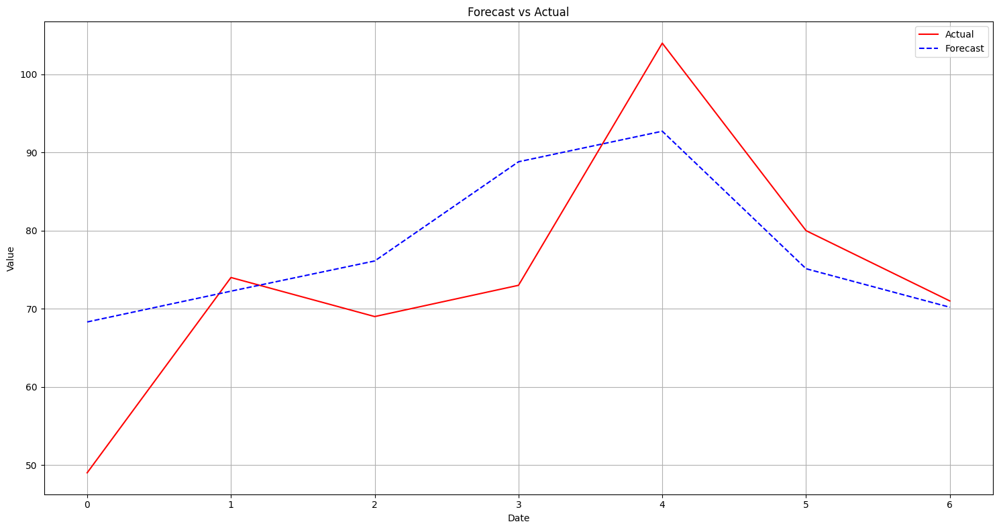

📊 Оценка прогноза:
MAE  = 10.25
RMSE = 12.56


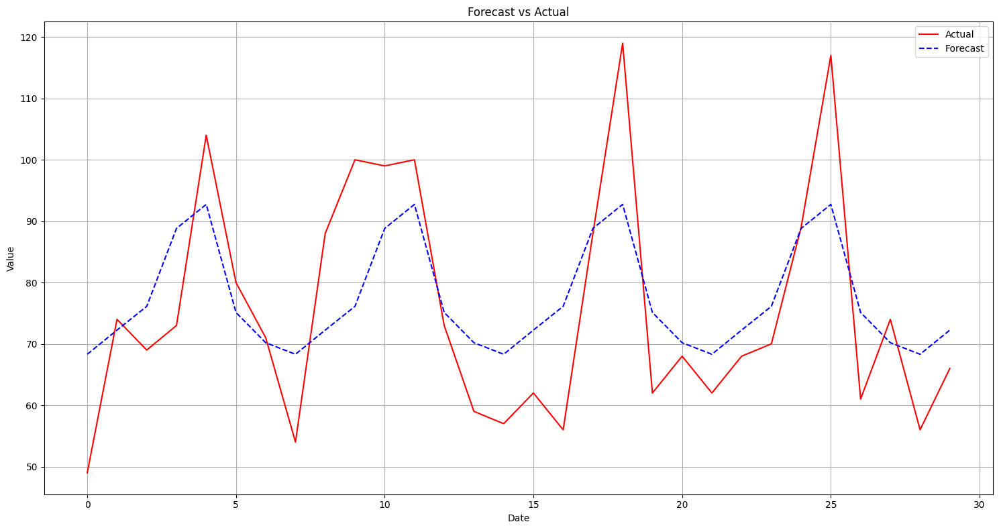

📊 Оценка прогноза:
MAE  = 14.54
RMSE = 18.32


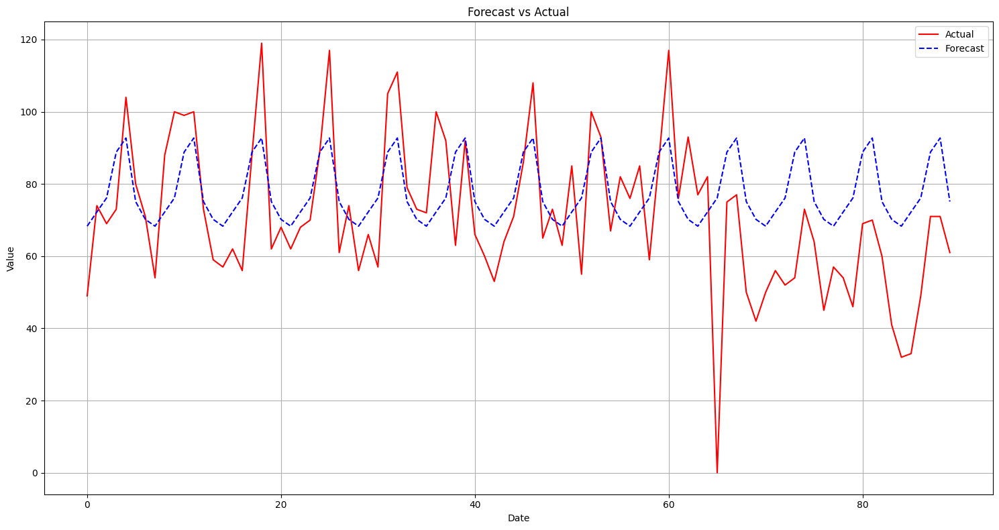

In [382]:
for period in [7,30,90]:
    pred = ts_toolkit.predict(steps=period)
    restored_pred = ts_toolkit.inverse_yeojohnson(pred)
    test_30 = df_test[['cnt']].iloc[:period]['cnt']
    MAIN_RESULTS[STORE]['ets'][f'res_{period}'] = ts_toolkit.evaluate_forecast(list(test_30), list(restored_pred), plot = True)
    MAIN_RESULTS[STORE]['ets'][f'pred_{period}'] = restored_pred

### SARIMA MODEL

In [383]:
exog_vars = ['wday', 'month','is_christmas']
exog = ts_toolkit.df[exog_vars]
exog = exog.astype(float)

In [384]:
# ts_toolkit.fit('yeojohnson_cnt', model_type='sarimax', exog = exog, order=(2,1,1), seasonal_order=(2,0,1,7))
# ts_toolkit.save_model(path=MAIN_RESULTS[STORE]['sarima']['model_path'])

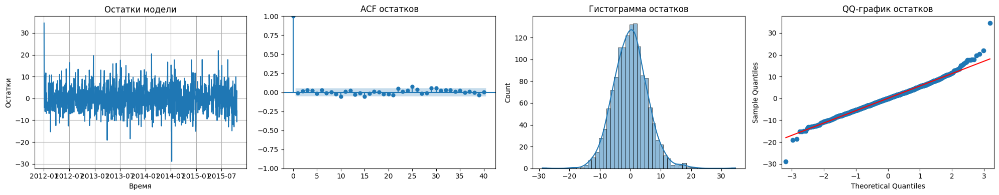

t-тест Стьюдента на равенство 0: t-статистика = 0.328, p-значение = 0.7428
✅ Среднее значение остатков не отличается от 0
Критерий Вилкоксона: статистика = 479978.000, p-значение = 0.8932
✅ Медиана остатков не отличается от 0
Тест Жарка-Бера: статистика = 180.46, p-значение = 0.0000
❌ Остатки не распределены нормально
Тест Льюнга-Бокса (lags=40): статистика = 49.39, p-значение = 0.1467
✅ Остатки не автокоррелированы
Тест Бройша-Пагана: статистика = 0.42, p-значение = 0.5188
✅ Гомоскедастичность (гетероскедастичность не обнаружена)


In [385]:
restored_model = ts_toolkit.load_model(MAIN_RESULTS[STORE]['sarima']['model_path'], model_type='sarimax')
MAIN_RESULTS[STORE]['sarima'][f'resids'],MAIN_RESULTS[STORE]['sarima'][f'pvals'] = ts_toolkit.check_residuals(plot=True)

In [386]:
for period in [7,30,90]:
    exog_forecast = df_test[exog_vars].iloc[:period]
    exog_forecast = exog_forecast.astype(float)
    pred = ts_toolkit.predict(steps=period, exog=exog_forecast)
    restored_pred = ts_toolkit.inverse_yeojohnson(pred)
    test_30 = df_test[['cnt']].iloc[:period]['cnt']
    MAIN_RESULTS[STORE]['sarima'][f'res_{period}'] = ts_toolkit.evaluate_forecast(list(test_30), list(restored_pred))
    MAIN_RESULTS[STORE]['sarima'][f'pred_{period}'] = restored_pred


📊 Оценка прогноза:
MAE  = 7.79
RMSE = 10.11
📊 Оценка прогноза:
MAE  = 11.58
RMSE = 13.44
📊 Оценка прогноза:
MAE  = 13.60
RMSE = 15.97


### PROPHET MODEL

In [387]:
ts_toolkit = TimeSeriesForecastingToolkit(df_train, period= 30, date_col='date', year = 2013, event_cols=['event_name_1', 'event_name_2'])
ts_toolkit.yeojohnson_transform('cnt')

In [388]:
# custom_seasons = [
#     {'name': 'half_year', 'period': 182, 'fourier_order': 10},
# ]

# ts_toolkit.fit(
#     'yeojohnson_cnt', 
#     model_type='prophet', 
#     seasonality_mode='multiplicative',
#     weekly_seasonality=True,
#     changepoint_prior_scale = 0.1,
#     holidays_prior_scale=20,
#     holidays = significant_holidays_df,
#     custom_seasonalities=custom_seasons
# )

# ts_toolkit.save_model(path=MAIN_RESULTS[STORE]['prophet']['model_path'])

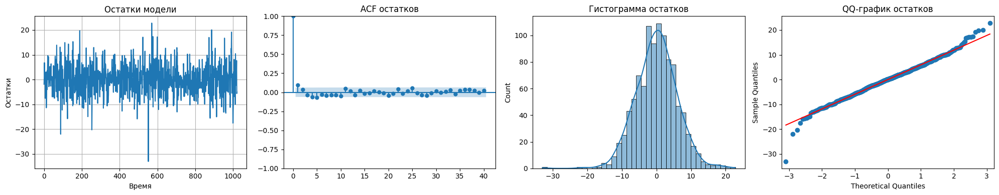

t-тест Стьюдента на равенство 0: t-статистика = 0.016, p-значение = 0.9871
✅ Среднее значение остатков не отличается от 0
Критерий Вилкоксона: статистика = 260703.000, p-значение = 0.9431
✅ Медиана остатков не отличается от 0
Тест Жарка-Бера: статистика = 72.15, p-значение = 0.0000
❌ Остатки не распределены нормально
Тест Льюнга-Бокса (lags=40): статистика = 51.43, p-значение = 0.1063
✅ Остатки не автокоррелированы
Тест Бройша-Пагана: статистика = 0.11, p-значение = 0.7358
✅ Гомоскедастичность (гетероскедастичность не обнаружена)


In [389]:
restored_model = ts_toolkit.load_model(MAIN_RESULTS[STORE]['prophet']['model_path'], model_type='prophet')
MAIN_RESULTS[STORE]['prophet'][f'resids'], MAIN_RESULTS[STORE]['prophet'][f'pvals'] = ts_toolkit.check_residuals(plot=True)

In [390]:
for period in [7,30,90]:
    exog_forecast = df_test[exog_vars].iloc[:period]

    pred = ts_toolkit.predict(steps=period, exog = exog_forecast)
    restored_pred = ts_toolkit.inverse_yeojohnson(pred)

    test_values = df_test['cnt'].iloc[:period]
    MAIN_RESULTS[STORE]['prophet'][f'res_{period}'] = ts_toolkit.evaluate_forecast(list(test_values), list(restored_pred))
    MAIN_RESULTS[STORE]['prophet'][f'pred_{period}'] = restored_pred

📊 Оценка прогноза:
MAE  = 7.56
RMSE = 9.28
📊 Оценка прогноза:
MAE  = 10.51
RMSE = 12.43
📊 Оценка прогноза:
MAE  = 12.21
RMSE = 14.99


### BOOSTING_MODEL


In [391]:
ts_toolkit = TimeSeriesForecastingToolkit(df_train, period= 30, year=2013, date_col='date', event_cols=['event_name_1', 'event_name_2'])
ts_toolkit.yeojohnson_transform('cnt')

exog_vars = [ 'lag_1', 'lag_7', 'lag_30', 'lag_90', 'is_christmas', 'wday', 'month']

In [392]:
# exog = ts_toolkit.df[exog_vars]
# exog = exog.astype(float)

# ts_toolkit.fit(
#     'yeojohnson_cnt', 
#     model_type='boosting', 
#     exog=exog
# )
# ts_toolkit.save_model(path=MAIN_RESULTS[STORE]['boosting']['model_path'])

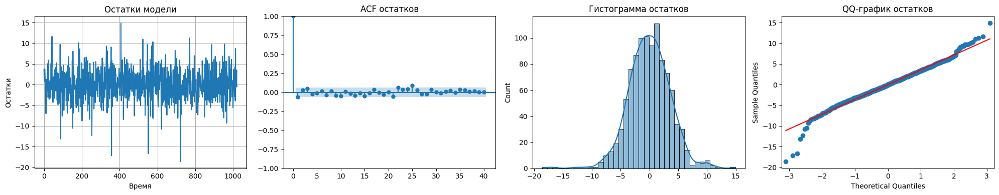

t-тест Стьюдента на равенство 0: t-статистика = 0.000, p-значение = 1.0000
✅ Среднее значение остатков не отличается от 0
Критерий Вилкоксона: статистика = 260941.000, p-значение = 0.9632
✅ Медиана остатков не отличается от 0
Тест Жарка-Бера: статистика = 166.47, p-значение = 0.0000
❌ Остатки не распределены нормально
Тест Льюнга-Бокса (lags=40): статистика = 45.70, p-значение = 0.2472
✅ Остатки не автокоррелированы
Тест Бройша-Пагана: статистика = 0.00, p-значение = 0.9933
✅ Гомоскедастичность (гетероскедастичность не обнаружена)


In [393]:
restored_model = ts_toolkit.load_model(MAIN_RESULTS[STORE]['boosting']['model_path'], model_type='boosting')
MAIN_RESULTS[STORE]['boosting'][f'resids'], MAIN_RESULTS[STORE]['boosting']['pvals'] = ts_toolkit.check_residuals(plot=True)

In [394]:
for period in [7,30,90]:
    
    exog_forecast = df_test[exog_vars].iloc[:period]

    pred = ts_toolkit.predict(steps=period, exog = exog_forecast)
    restored_pred = ts_toolkit.inverse_yeojohnson(pred)

    test_values = df_test['cnt'].iloc[:period]
    MAIN_RESULTS[STORE]['boosting'][f'res_{period}'] = ts_toolkit.evaluate_forecast(list(test_values), list(restored_pred))
    MAIN_RESULTS[STORE]['boosting'][f'pred_{period}'] = restored_pred

📊 Оценка прогноза:
MAE  = 11.14
RMSE = 12.99
📊 Оценка прогноза:
MAE  = 11.81
RMSE = 13.59
📊 Оценка прогноза:
MAE  = 11.75
RMSE = 15.26


## STORE_2_085

In [395]:
STORE = 'STORE_2_085'
MAIN_RESULTS[STORE] = {}
MAIN_RESULTS[STORE]['ets'] = {}
MAIN_RESULTS[STORE]['ets']['model_path'] = f'models/ets/model_{STORE}.pkl'
MAIN_RESULTS[STORE]['sarima'] = {}
MAIN_RESULTS[STORE]['sarima']['model_path'] = f'models/sarima/model_{STORE}.pkl'
MAIN_RESULTS[STORE]['prophet'] = {}
MAIN_RESULTS[STORE]['prophet']['model_path'] = f'models/prophet/model_{STORE}.pkl'
MAIN_RESULTS[STORE]['boosting'] = {}
MAIN_RESULTS[STORE]['boosting']['model_path'] = f'models/boosting/model_{STORE}.pkl'

In [396]:
df_train = train[train['item_id']==STORE]
df_train = df_train.sort_values('date_id')

In [397]:
df_test = test[test['item_id']==STORE]
df_test = df_test.sort_values('date_id')

In [398]:
ts_toolkit = TimeSeriesForecastingToolkit(df_train, date_col='date', event_cols=['event_name_1', 'event_name_2'])
ts_toolkit.yeojohnson_transform('cnt')

### EDA

Use self-module df


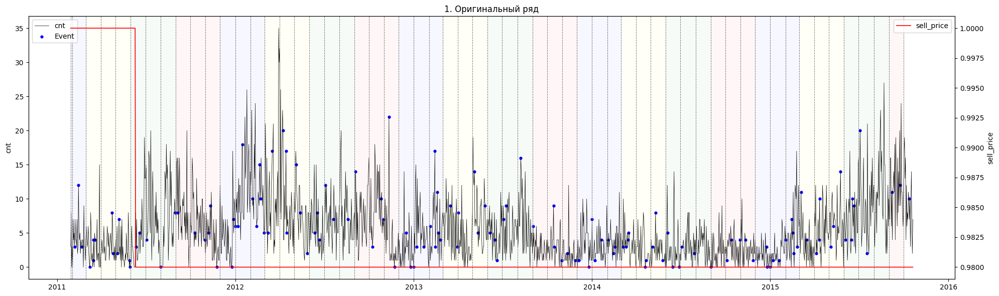

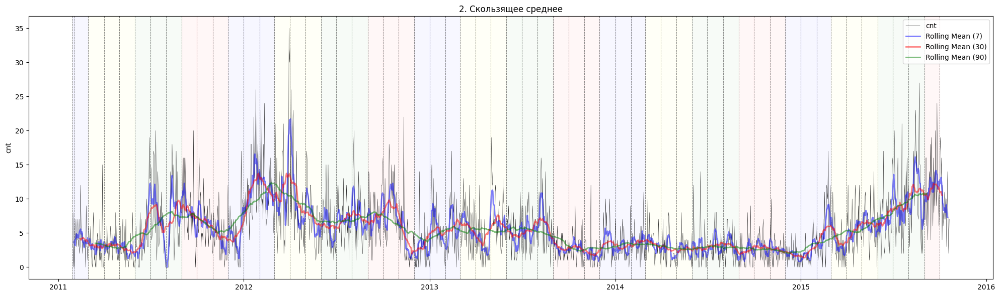

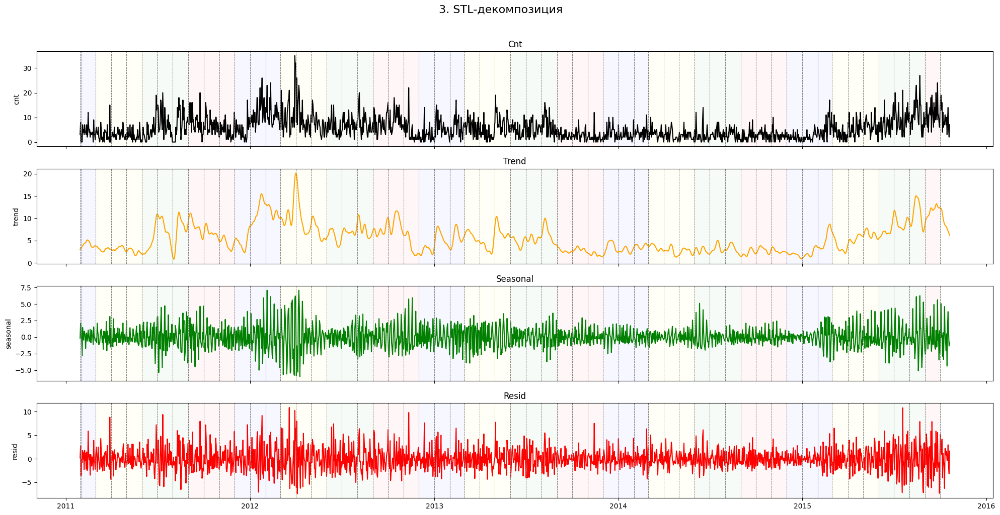

In [399]:
ts_toolkit.analyze(col='cnt',period=7)

In [400]:
ts_toolkit.stationarity_tests(d=0, D=0, col='yeojohnson_cnt')
ts_toolkit.stationarity_tests(d=0, D=1, col='yeojohnson_cnt', period=7)

=== Стационарность: d=0, D=0 ===

=== KPSS Test ===
Statistic: 0.7992257763779934, p-value: 0.01
❌ Нестационарен

=== ADF Test ===
Statistic: -4.758763516581522, p-value: 6.517491537848452e-05
✅ Стационарен
=== Стационарность: d=0, D=1, period=7 ===

=== KPSS Test ===
Statistic: 0.01322292439534961, p-value: 0.1
✅ Стационарен

=== ADF Test ===
Statistic: -10.268449978285823, p-value: 4.0606024026874254e-18
✅ Стационарен


### ETS MODEL

In [401]:
# ts_toolkit.fit('yeojohnson_cnt', model_type='ets', auto_fit_mode=True, verbose=False)
# ts_toolkit.save_model(path=MAIN_RESULTS[STORE]['ets']['model_path'])

In [402]:
restored_model = ts_toolkit.load_model(MAIN_RESULTS[STORE]['ets']['model_path'], model_type='ets')
MAIN_RESULTS[STORE]['ets'][f'resids'], MAIN_RESULTS[STORE]['ets'][f'pvals'] = ts_toolkit.check_residuals()

t-тест Стьюдента на равенство 0: t-статистика = 0.162, p-значение = 0.8711
✅ Среднее значение остатков не отличается от 0
Критерий Вилкоксона: статистика = 734588.000, p-значение = 0.6083
✅ Медиана остатков не отличается от 0
Тест Жарка-Бера: статистика = 1.76, p-значение = 0.4138
✅ Остатки распределены нормально
Тест Льюнга-Бокса (lags=40): статистика = 46.51, p-значение = 0.2220
✅ Остатки не автокоррелированы
Тест Бройша-Пагана: статистика = 1.77, p-значение = 0.1834
✅ Гомоскедастичность (гетероскедастичность не обнаружена)


📊 Оценка прогноза:
MAE  = 5.65
RMSE = 7.23


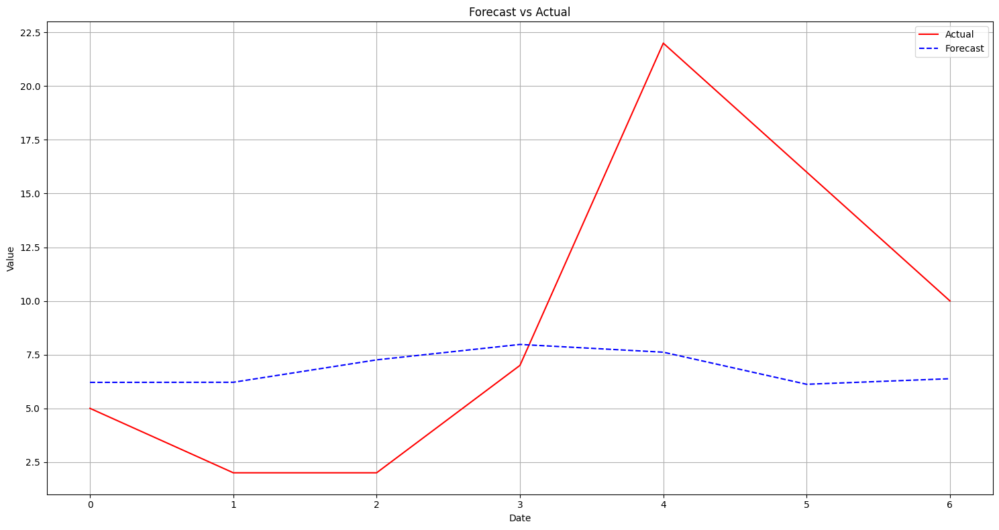

📊 Оценка прогноза:
MAE  = 3.26
RMSE = 4.44


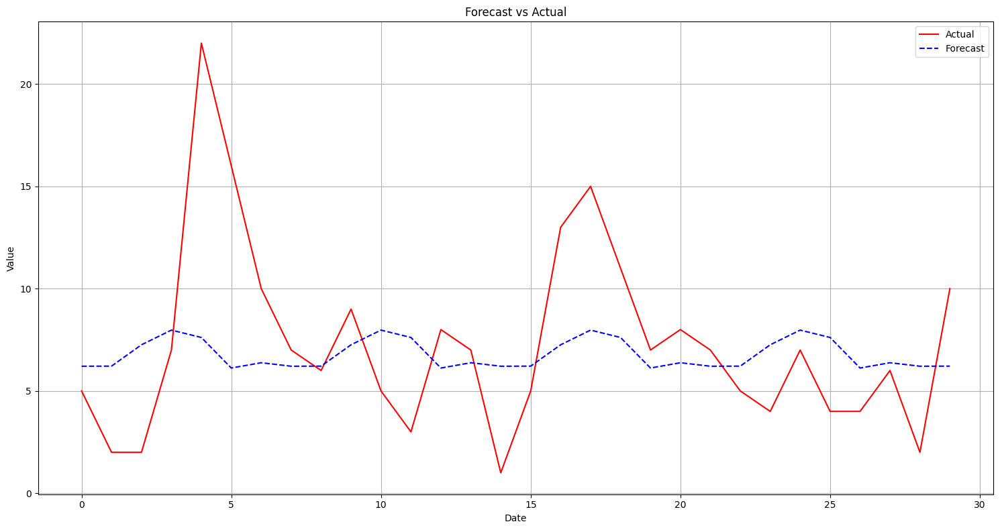

📊 Оценка прогноза:
MAE  = 3.84
RMSE = 5.28


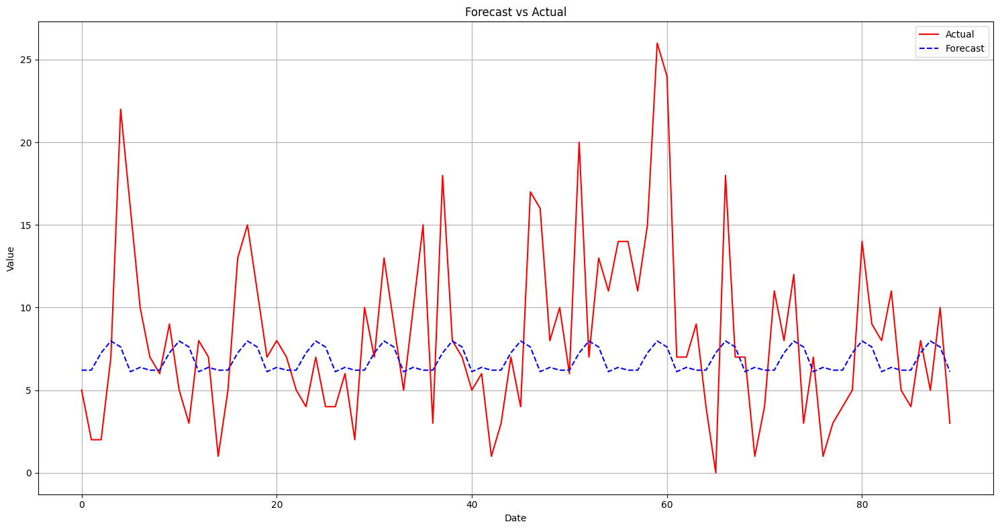

In [403]:
for period in [7,30,90]:
    pred = ts_toolkit.predict(steps=period)
    restored_pred = ts_toolkit.inverse_yeojohnson(pred)
    test_30 = df_test[['cnt']].iloc[:period]['cnt']
    MAIN_RESULTS[STORE]['ets'][f'res_{period}'] = ts_toolkit.evaluate_forecast(list(test_30), list(restored_pred), plot = True)
    MAIN_RESULTS[STORE]['ets'][f'pred_{period}'] = restored_pred

### SARIMA MODEL

In [404]:
exog_vars = ['wday', 'month','is_christmas']
exog = ts_toolkit.df[exog_vars]
exog = exog.astype(float)

In [405]:
# ts_toolkit.fit('yeojohnson_cnt', model_type='sarimax', exog = exog, order=(1,1,1), seasonal_order=(1,1,1,7))
# ts_toolkit.save_model(path=MAIN_RESULTS[STORE]['sarima']['model_path'])

In [406]:
restored_model = ts_toolkit.load_model(MAIN_RESULTS[STORE]['sarima']['model_path'], model_type='sarimax')
MAIN_RESULTS[STORE]['sarima'][f'resids'],MAIN_RESULTS[STORE]['sarima'][f'pvals'] = ts_toolkit.check_residuals()

t-тест Стьюдента на равенство 0: t-статистика = -0.132, p-значение = 0.8950
✅ Среднее значение остатков не отличается от 0
Критерий Вилкоксона: статистика = 740925.000, p-значение = 0.8364
✅ Медиана остатков не отличается от 0
Тест Жарка-Бера: статистика = 3.51, p-значение = 0.1728
✅ Остатки распределены нормально
Тест Льюнга-Бокса (lags=40): статистика = 31.82, p-значение = 0.8185
✅ Остатки не автокоррелированы
Тест Бройша-Пагана: статистика = 10.60, p-значение = 0.0011
❌ Есть гетероскедастичность


📊 Оценка прогноза:
MAE  = 5.70
RMSE = 6.99


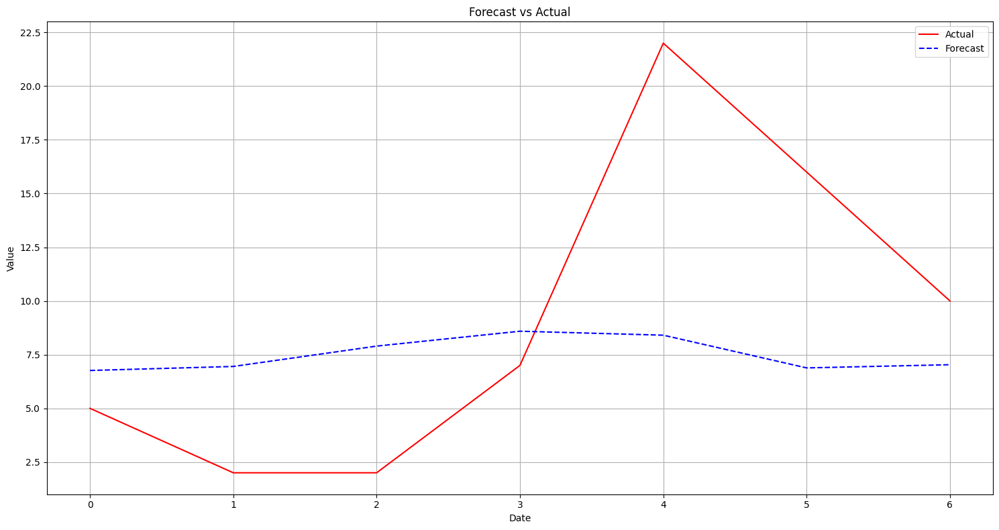

📊 Оценка прогноза:
MAE  = 3.30
RMSE = 4.40


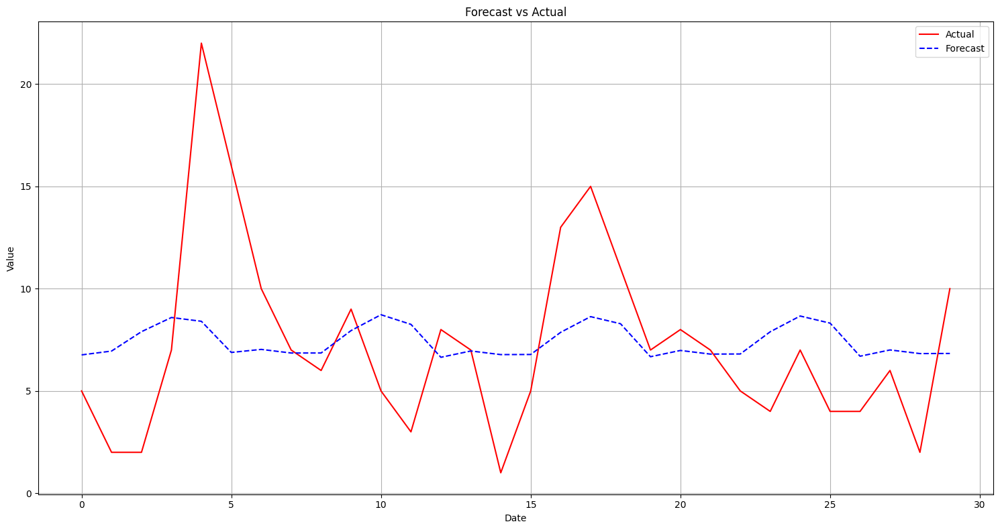

📊 Оценка прогноза:
MAE  = 3.84
RMSE = 5.15


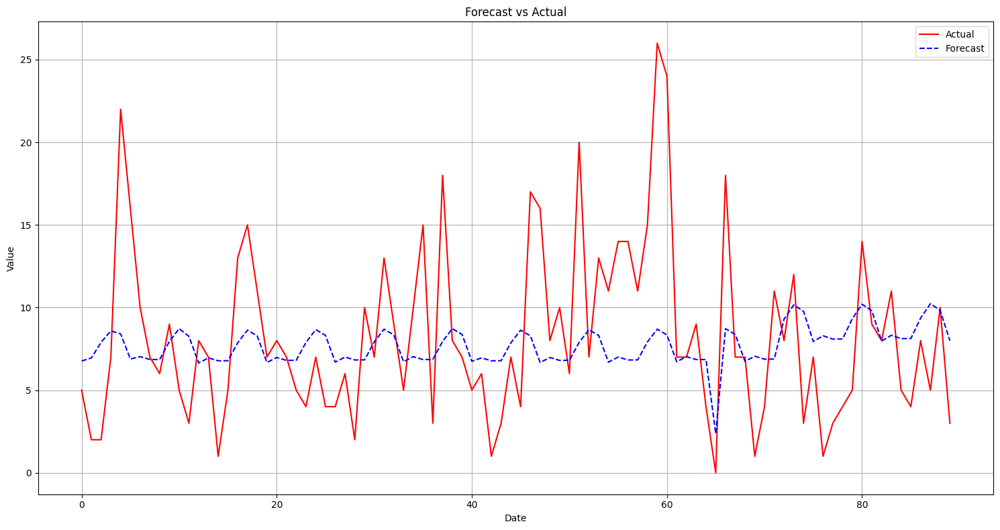

In [407]:
for period in [7,30,90]:
    exog_forecast = df_test[exog_vars].iloc[:period]
    exog_forecast = exog_forecast.astype(float)
    pred = ts_toolkit.predict(steps=period, exog=exog_forecast)
    restored_pred = ts_toolkit.inverse_yeojohnson(pred)
    test_30 = df_test[['cnt']].iloc[:period]['cnt']
    MAIN_RESULTS[STORE]['sarima'][f'res_{period}'] = ts_toolkit.evaluate_forecast(list(test_30), list(restored_pred), plot = True)
    MAIN_RESULTS[STORE]['sarima'][f'pred_{period}'] = restored_pred


### PROPHET MODEL

In [408]:
# custom_seasons = [
#     {'name': 'quarterly', 'period': 365.25 / 4, 'fourier_order': 10},
# ]

# ts_toolkit.fit(
#     'yeojohnson_cnt', 
#     model_type='prophet', 
#     seasonality_mode='multiplicative',
#     changepoint_prior_scale=0.1,
#     yearly_seasonality = True,
# )
# ts_toolkit.save_model(path=MAIN_RESULTS[STORE]['prophet']['model_path'])

In [409]:
restored_model = ts_toolkit.load_model(MAIN_RESULTS[STORE]['prophet']['model_path'], model_type='prophet')
MAIN_RESULTS[STORE]['prophet'][f'resids'], MAIN_RESULTS[STORE]['prophet'][f'pvals'] = ts_toolkit.check_residuals()

t-тест Стьюдента на равенство 0: t-статистика = -0.044, p-значение = 0.9647
✅ Среднее значение остатков не отличается от 0
Критерий Вилкоксона: статистика = 20984.000, p-значение = 0.7040
✅ Медиана остатков не отличается от 0
Тест Жарка-Бера: статистика = 4.54, p-значение = 0.1034
✅ Остатки распределены нормально
Тест Льюнга-Бокса (lags=40): статистика = 38.42, p-значение = 0.5415
✅ Остатки не автокоррелированы
Тест Бройша-Пагана: статистика = 0.26, p-значение = 0.6104
✅ Гомоскедастичность (гетероскедастичность не обнаружена)


In [410]:
for period in [7,30,90]:
    pred = ts_toolkit.predict(steps=period)
    restored_pred = ts_toolkit.inverse_yeojohnson(pred)

    test_values = df_test['cnt'].iloc[:period]
    MAIN_RESULTS[STORE]['prophet'][f'res_{period}'] = ts_toolkit.evaluate_forecast(list(test_values), list(restored_pred))
    MAIN_RESULTS[STORE]['prophet'][f'pred_{period}'] = restored_pred

📊 Оценка прогноза:
MAE  = 6.79
RMSE = 7.76
📊 Оценка прогноза:
MAE  = 7.17
RMSE = 8.56
📊 Оценка прогноза:
MAE  = 18.42
RMSE = 26.98


### BOOSTING_MODEL


In [411]:
exog_vars = [ 'lag_1', 'lag_7', 'lag_30', 'lag_90', 'sell_price', 'wday', 'month', 'has_event']

In [412]:
# exog = ts_toolkit.df[exog_vars]
# exog = exog.astype(float)

# ts_toolkit.fit(
#     'yeojohnson_cnt', 
#     model_type='boosting', 
#     exog=exog
# )
# ts_toolkit.save_model(path=MAIN_RESULTS[STORE]['boosting']['model_path'])

In [413]:
restored_model = ts_toolkit.load_model(MAIN_RESULTS[STORE]['boosting']['model_path'], model_type='boosting')
MAIN_RESULTS[STORE]['boosting'][f'resids'], MAIN_RESULTS[STORE]['boosting']['pvals'] = ts_toolkit.check_residuals()

t-тест Стьюдента на равенство 0: t-статистика = 0.000, p-значение = 1.0000
✅ Среднее значение остатков не отличается от 0
Критерий Вилкоксона: статистика = 21425.000, p-значение = 0.9393
✅ Медиана остатков не отличается от 0
Тест Жарка-Бера: статистика = 0.33, p-значение = 0.8461
✅ Остатки распределены нормально
Тест Льюнга-Бокса (lags=40): статистика = 44.85, p-значение = 0.2756
✅ Остатки не автокоррелированы
Тест Бройша-Пагана: статистика = 0.14, p-значение = 0.7122
✅ Гомоскедастичность (гетероскедастичность не обнаружена)


In [414]:
for period in [7,30,90]:
    
    exog_forecast = df_test[exog_vars].iloc[:period]

    pred = ts_toolkit.predict(steps=period, exog = exog_forecast)
    restored_pred = ts_toolkit.inverse_yeojohnson(pred)

    test_values = df_test['cnt'].iloc[:period]
    MAIN_RESULTS[STORE]['boosting'][f'res_{period}'] = ts_toolkit.evaluate_forecast(list(test_values), list(restored_pred))
    MAIN_RESULTS[STORE]['boosting'][f'pred_{period}'] = restored_pred

📊 Оценка прогноза:
MAE  = 8.48
RMSE = 10.57
📊 Оценка прогноза:
MAE  = 10.30
RMSE = 11.74
📊 Оценка прогноза:
MAE  = 8.06
RMSE = 9.90


## STORE_2_043

In [415]:
STORE = 'STORE_2_043'
MAIN_RESULTS[STORE] = {}
MAIN_RESULTS[STORE]['ets'] = {}
MAIN_RESULTS[STORE]['ets']['model_path'] = f'models/ets/model_{STORE}.pkl'
MAIN_RESULTS[STORE]['sarima'] = {}
MAIN_RESULTS[STORE]['sarima']['model_path'] = f'models/sarima/model_{STORE}.pkl'
MAIN_RESULTS[STORE]['prophet'] = {}
MAIN_RESULTS[STORE]['prophet']['model_path'] = f'models/prophet/model_{STORE}.pkl'
MAIN_RESULTS[STORE]['boosting'] = {}
MAIN_RESULTS[STORE]['boosting']['model_path'] = f'models/boosting/model_{STORE}.pkl'

In [416]:
df_train = train[train['item_id']==STORE]
df_train = df_train.sort_values('date_id')
df_train = df_train[df_train['year']>2012]

In [417]:
df_test = test[test['item_id']==STORE]

df_test = df_test.sort_values('date_id')

In [418]:
ts_toolkit = TimeSeriesForecastingToolkit(df_train, period= 30, year=2014, date_col='date', event_cols=['event_name_1', 'event_name_2'])

In [419]:
ts_toolkit.yeojohnson_transform('cnt')

### EDA

Use self-module df


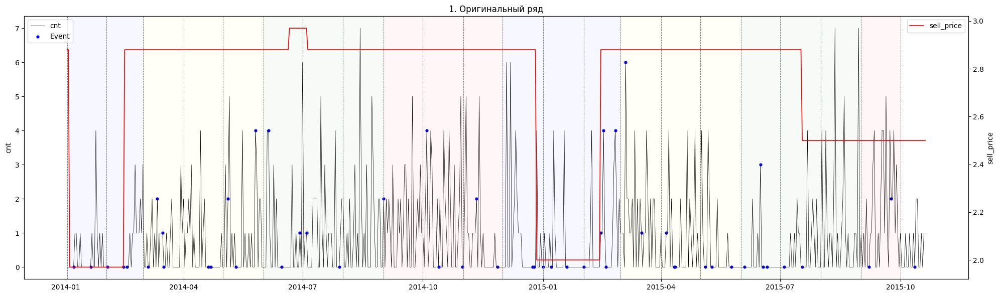

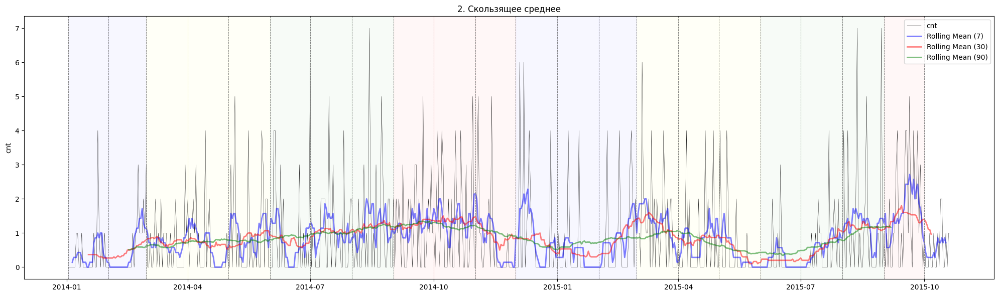

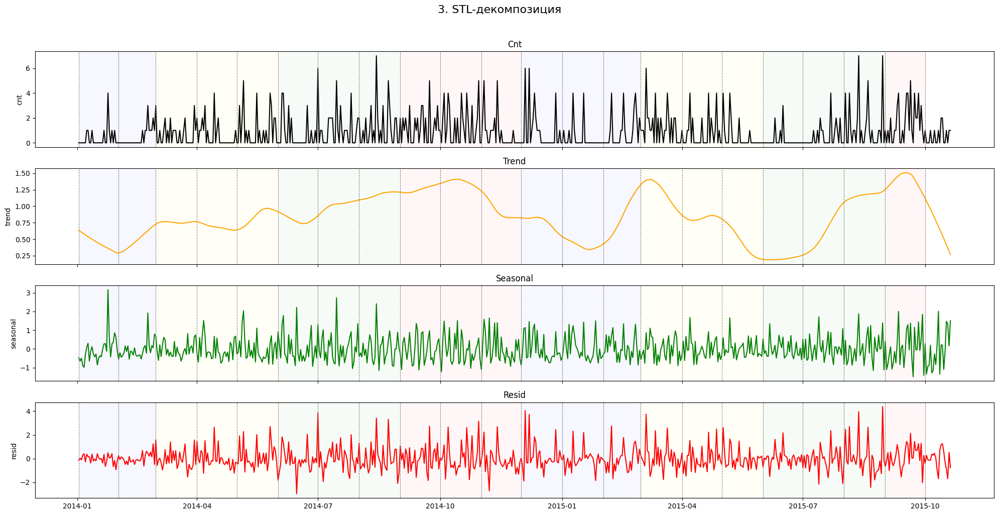

In [420]:
ts_toolkit.analyze(col='cnt')

In [421]:
ts_toolkit.stationarity_tests(d=0, D=1, period=14, col='yeojohnson_cnt')

=== Стационарность: d=0, D=1, period=14 ===

=== KPSS Test ===
Statistic: 0.023006465726862532, p-value: 0.1
✅ Стационарен

=== ADF Test ===
Statistic: -9.496861975801385, p-value: 3.529865187996248e-16
✅ Стационарен


### ETS MODEL

In [422]:
# ts_toolkit.fit('yeojohnson_cnt', model_type='ets', auto_fit_mode=True, verbose=False)
# ts_toolkit.save_model(path=MAIN_RESULTS[STORE]['ets']['model_path'])

In [423]:
restored_model = ts_toolkit.load_model(MAIN_RESULTS[STORE]['ets']['model_path'], model_type='ets')
MAIN_RESULTS[STORE]['ets'][f'resids'], MAIN_RESULTS[STORE]['ets'][f'pvals'] = ts_toolkit.check_residuals()

t-тест Стьюдента на равенство 0: t-статистика = 0.360, p-значение = 0.7189
✅ Среднее значение остатков не отличается от 0
Критерий Вилкоксона: статистика = 103414.000, p-значение = 0.3381
✅ Медиана остатков не отличается от 0
Тест Жарка-Бера: статистика = 57.74, p-значение = 0.0000
❌ Остатки не распределены нормально
Тест Льюнга-Бокса (lags=40): статистика = 45.52, p-значение = 0.2532
✅ Остатки не автокоррелированы
Тест Бройша-Пагана: статистика = 0.00, p-значение = 0.9831
✅ Гомоскедастичность (гетероскедастичность не обнаружена)


In [424]:
for period in [7,30,90]:
    pred = ts_toolkit.predict(steps=period)
    restored_pred = ts_toolkit.inverse_yeojohnson(pred)
    test_30 = df_test[['cnt']].iloc[:period]['cnt']
    MAIN_RESULTS[STORE]['ets'][f'res_{period}'] = ts_toolkit.evaluate_forecast(list(test_30), list(restored_pred))
    MAIN_RESULTS[STORE]['ets'][f'pred_{period}'] = restored_pred

📊 Оценка прогноза:
MAE  = 1.57
RMSE = 1.67
📊 Оценка прогноза:
MAE  = 1.09
RMSE = 1.39
📊 Оценка прогноза:
MAE  = 0.79
RMSE = 1.10


### SARIMA MODEL

In [425]:
# ts_toolkit.fit('yeojohnson_cnt', model_type='sarimax', order=(1,0,1), seasonal_order=(1,1,0,14))
# ts_toolkit.save_model(path=MAIN_RESULTS[STORE]['sarima']['model_path'])

In [426]:
restored_model = ts_toolkit.load_model(MAIN_RESULTS[STORE]['sarima']['model_path'], model_type='sarimax')
MAIN_RESULTS[STORE]['sarima'][f'resids'],MAIN_RESULTS[STORE]['sarima'][f'pvals'] = ts_toolkit.check_residuals()

t-тест Стьюдента на равенство 0: t-статистика = 0.663, p-значение = 0.5079
✅ Среднее значение остатков не отличается от 0
Критерий Вилкоксона: статистика = 20595.000, p-значение = 0.5824
✅ Медиана остатков не отличается от 0
Тест Жарка-Бера: статистика = 1.42, p-значение = 0.4920
✅ Остатки распределены нормально
Тест Льюнга-Бокса (lags=40): статистика = 54.50, p-значение = 0.0629
✅ Остатки не автокоррелированы
Тест Бройша-Пагана: статистика = 1.26, p-значение = 0.2611
✅ Гомоскедастичность (гетероскедастичность не обнаружена)


In [427]:
for period in [7,30,90]:
    pred = ts_toolkit.predict(steps=period)
    restored_pred = ts_toolkit.inverse_yeojohnson(pred)
    test_30 = df_test[['cnt']].iloc[:period]['cnt']
    MAIN_RESULTS[STORE]['sarima'][f'res_{period}'] = ts_toolkit.evaluate_forecast(list(test_30), list(restored_pred))
    MAIN_RESULTS[STORE]['sarima'][f'pred_{period}'] = restored_pred

📊 Оценка прогноза:
MAE  = 1.24
RMSE = 1.40
📊 Оценка прогноза:
MAE  = 1.03
RMSE = 1.39
📊 Оценка прогноза:
MAE  = 0.82
RMSE = 1.14


### PROPHET MODEL

In [428]:
# custom_seasons = [
#     {'name': 'half_year', 'period': 365/2, 'fourier_order': 10},
# ]

# ts_toolkit.fit(
#     'yeojohnson_cnt', 
#     model_type='prophet', 
#     seasonality_mode='additive',
#     changepoint_prior_scale=0.015,
#     custom_seasonalities=custom_seasons
# )
# ts_toolkit.save_model(path=MAIN_RESULTS[STORE]['prophet']['model_path'])

In [429]:
restored_model = ts_toolkit.load_model(MAIN_RESULTS[STORE]['prophet']['model_path'], model_type='prophet')
MAIN_RESULTS[STORE]['prophet'][f'resids'], MAIN_RESULTS[STORE]['prophet'][f'pvals'] = ts_toolkit.check_residuals()

t-тест Стьюдента на равенство 0: t-статистика = 0.645, p-значение = 0.5196
✅ Среднее значение остатков не отличается от 0
Критерий Вилкоксона: статистика = 21323.000, p-значение = 0.8836
✅ Медиана остатков не отличается от 0
Тест Жарка-Бера: статистика = 12.80, p-значение = 0.0017
❌ Остатки не распределены нормально
Тест Льюнга-Бокса (lags=40): статистика = 43.79, p-значение = 0.3140
✅ Остатки не автокоррелированы
Тест Бройша-Пагана: статистика = 0.31, p-значение = 0.5747
✅ Гомоскедастичность (гетероскедастичность не обнаружена)


In [430]:
for period in [7,30,90]:
    pred = ts_toolkit.predict(steps=period)
    restored_pred = ts_toolkit.inverse_yeojohnson(pred)
    test_values = df_test['cnt'].iloc[:period]
    MAIN_RESULTS[STORE]['prophet'][f'res_{period}'] = ts_toolkit.evaluate_forecast(list(test_values), list(restored_pred))
    MAIN_RESULTS[STORE]['prophet'][f'pred_{period}'] = restored_pred

📊 Оценка прогноза:
MAE  = 1.38
RMSE = 1.47
📊 Оценка прогноза:
MAE  = 1.06
RMSE = 1.34
📊 Оценка прогноза:
MAE  = 0.75
RMSE = 1.11


### BOOSTING_MODEL


In [431]:
ts_toolkit = TimeSeriesForecastingToolkit(df_train, period= 30, year=2012, date_col='date', event_cols=['event_name_1', 'event_name_2'])
ts_toolkit.yeojohnson_transform('cnt')
exog_vars = [ 'lag_1', 'lag_7', 'lag_30', 'lag_90', 'sell_price', 'wday', 'month', 'has_event']

In [432]:
# exog = ts_toolkit.df[exog_vars]
# exog = exog.astype(float)

# params = {
#     'objective': 'regression',
#     'metric': 'rmse',
#     'verbosity': 1,
#     'boosting_type': 'gbdt',
#     'seed': 42,
#     'num_leaves': 20,     
#     'min_data_in_leaf': 5,     
#     'max_depth': -1,      
# }

# ts_toolkit.fit(
#     'yeojohnson_cnt', 
#     model_type='boosting', 
#     params = params,
#     exog=exog
# )
# ts_toolkit.save_model(path=MAIN_RESULTS[STORE]['boosting']['model_path'])

In [433]:
restored_model = ts_toolkit.load_model(MAIN_RESULTS[STORE]['boosting']['model_path'], model_type='boosting')
MAIN_RESULTS[STORE]['boosting'][f'resids'], MAIN_RESULTS[STORE]['boosting']['pvals'] = ts_toolkit.check_residuals()

t-тест Стьюдента на равенство 0: t-статистика = 0.000, p-значение = 1.0000
✅ Среднее значение остатков не отличается от 0
Критерий Вилкоксона: статистика = 252058.000, p-значение = 0.2984
✅ Медиана остатков не отличается от 0
Тест Жарка-Бера: статистика = 76.22, p-значение = 0.0000
❌ Остатки не распределены нормально
Тест Льюнга-Бокса (lags=40): статистика = 37.19, p-значение = 0.5973
✅ Остатки не автокоррелированы
Тест Бройша-Пагана: статистика = 0.04, p-значение = 0.8437
✅ Гомоскедастичность (гетероскедастичность не обнаружена)


In [434]:
for period in [7,30,90]:
    
    exog_forecast = df_test[exog_vars].iloc[:period]

    pred = ts_toolkit.predict(steps=period, exog = exog_forecast)
    restored_pred = ts_toolkit.inverse_yeojohnson(pred)

    test_values = df_test['cnt'].iloc[:period]
    MAIN_RESULTS[STORE]['boosting'][f'res_{period}'] = ts_toolkit.evaluate_forecast(list(test_values), list(restored_pred))
    MAIN_RESULTS[STORE]['boosting'][f'pred_{period}'] = restored_pred

📊 Оценка прогноза:
MAE  = 1.55
RMSE = 1.59
📊 Оценка прогноза:
MAE  = 0.98
RMSE = 1.31
📊 Оценка прогноза:
MAE  = 0.69
RMSE = 1.09


## STORE_2_054

In [435]:
STORE = 'STORE_2_054'
MAIN_RESULTS[STORE] = {}
MAIN_RESULTS[STORE]['ets'] = {}
MAIN_RESULTS[STORE]['ets']['model_path'] = f'models/ets/model_{STORE}.pkl'
MAIN_RESULTS[STORE]['sarima'] = {}
MAIN_RESULTS[STORE]['sarima']['model_path'] = f'models/sarima/model_{STORE}.pkl'
MAIN_RESULTS[STORE]['prophet'] = {}
MAIN_RESULTS[STORE]['prophet']['model_path'] = f'models/prophet/model_{STORE}.pkl'
MAIN_RESULTS[STORE]['boosting'] = {}
MAIN_RESULTS[STORE]['boosting']['model_path'] = f'models/boosting/model_{STORE}.pkl'

In [436]:
df_train = train[train['item_id']==STORE]
df_train = df_train.sort_values('date_id')
df_train = df_train[df_train['date_id']>1311]

In [437]:
df_test = test[test['item_id']==STORE]
df_test = df_test.sort_values('date_id')

In [438]:
ts_toolkit = TimeSeriesForecastingToolkit(df_train, period= 30, date_col='date', event_cols=['event_name_1', 'event_name_2'])
ts_toolkit.yeojohnson_transform('cnt')

### EDA

In [439]:
# ts_toolkit.analyze(col='cnt')

In [440]:
ts_toolkit.stationarity_tests(d=1, D=1, col='yeojohnson_cnt')

=== Стационарность: d=1, D=1, period=30 ===

=== KPSS Test ===
Statistic: 0.05458419900159087, p-value: 0.1
✅ Стационарен

=== ADF Test ===
Statistic: -9.988353395388017, p-value: 2.0270442008179092e-17
✅ Стационарен


### ETS MODEL

In [441]:
# ts_toolkit.fit('yeojohnson_cnt', model_type='ets', auto_fit_mode=True, verbose=False)
# ts_toolkit.save_model(path=MAIN_RESULTS[STORE]['ets']['model_path'])

In [442]:
restored_model = ts_toolkit.load_model(MAIN_RESULTS[STORE]['ets']['model_path'], model_type='ets')
MAIN_RESULTS[STORE]['ets'][f'resids'], MAIN_RESULTS[STORE]['ets'][f'pvals'] = ts_toolkit.check_residuals()

t-тест Стьюдента на равенство 0: t-статистика = 0.000, p-значение = 1.0000
✅ Среднее значение остатков не отличается от 0
Критерий Вилкоксона: статистика = 42848.000, p-значение = 0.8985
✅ Медиана остатков не отличается от 0
Тест Жарка-Бера: статистика = 6.92, p-значение = 0.0314
❌ Остатки не распределены нормально
Тест Льюнга-Бокса (lags=40): статистика = 45.54, p-значение = 0.2524
✅ Остатки не автокоррелированы
Тест Бройша-Пагана: статистика = 0.16, p-значение = 0.6899
✅ Гомоскедастичность (гетероскедастичность не обнаружена)


In [443]:
for period in [7,30,90]:
    pred = ts_toolkit.predict(steps=period)
    restored_pred = ts_toolkit.inverse_yeojohnson(pred)
    test_30 = df_test[['cnt']].iloc[:period]['cnt']
    MAIN_RESULTS[STORE]['ets'][f'res_{period}'] = ts_toolkit.evaluate_forecast(list(test_30), list(restored_pred))
    MAIN_RESULTS[STORE]['ets'][f'pred_{period}'] = restored_pred

📊 Оценка прогноза:
MAE  = 2.59
RMSE = 3.42
📊 Оценка прогноза:
MAE  = 2.44
RMSE = 3.10
📊 Оценка прогноза:
MAE  = 2.49
RMSE = 3.32


### SARIMA MODEL

In [444]:
# ts_toolkit.fit('yeojohnson_cnt', model_type='sarimax', order=(1,1,1), seasonal_order=(5, 1 ,0, 7))
# ts_toolkit.save_model(path=MAIN_RESULTS[STORE]['sarima']['model_path'])

In [445]:
restored_model = ts_toolkit.load_model(MAIN_RESULTS[STORE]['sarima']['model_path'], model_type='sarimax')
MAIN_RESULTS[STORE]['sarima'][f'resids'],MAIN_RESULTS[STORE]['sarima'][f'pvals'] = ts_toolkit.check_residuals()

t-тест Стьюдента на равенство 0: t-статистика = 0.783, p-значение = 0.4340
✅ Среднее значение остатков не отличается от 0
Критерий Вилкоксона: статистика = 40722.000, p-значение = 0.3187
✅ Медиана остатков не отличается от 0
Тест Жарка-Бера: статистика = 3.93, p-значение = 0.1401
✅ Остатки распределены нормально
Тест Льюнга-Бокса (lags=40): статистика = 42.33, p-значение = 0.3707
✅ Остатки не автокоррелированы
Тест Бройша-Пагана: статистика = 2.41, p-значение = 0.1207
✅ Гомоскедастичность (гетероскедастичность не обнаружена)


In [446]:
for period in [7,30,90]:
    pred= ts_toolkit.predict(steps=period)
    restored_pred = ts_toolkit.inverse_yeojohnson(pred)
    test_30 = df_test[['cnt']].iloc[:period]['cnt']
    MAIN_RESULTS[STORE]['sarima'][f'res_{period}'] = ts_toolkit.evaluate_forecast(list(test_30), list(restored_pred))
    MAIN_RESULTS[STORE]['sarima'][f'pred_{period}'] = restored_pred

📊 Оценка прогноза:
MAE  = 3.01
RMSE = 3.71
📊 Оценка прогноза:
MAE  = 2.51
RMSE = 3.10
📊 Оценка прогноза:
MAE  = 2.42
RMSE = 3.10


### PROPHET MODEL

In [447]:
# custom_seasons = [
#     {'name': 'custom_weekly', 'period': 30, 'fourier_order': 20}
# ]

# ts_toolkit.fit(
#     'yeojohnson_cnt', 
#     model_type='prophet', 
#     seasonality_mode='additive',
#     custom_seasonalities=custom_seasons
# )
# ts_toolkit.save_model(path=MAIN_RESULTS[STORE]['prophet']['model_path'])

In [448]:
restored_model = ts_toolkit.load_model(MAIN_RESULTS[STORE]['prophet']['model_path'], model_type='prophet')
MAIN_RESULTS[STORE]['prophet'][f'resids'], MAIN_RESULTS[STORE]['prophet'][f'pvals'] = ts_toolkit.check_residuals()

t-тест Стьюдента на равенство 0: t-статистика = -0.021, p-значение = 0.9829
✅ Среднее значение остатков не отличается от 0
Критерий Вилкоксона: статистика = 42497.000, p-значение = 0.7863
✅ Медиана остатков не отличается от 0
Тест Жарка-Бера: статистика = 4.53, p-значение = 0.1037
✅ Остатки распределены нормально
Тест Льюнга-Бокса (lags=40): статистика = 48.85, p-значение = 0.1590
✅ Остатки не автокоррелированы
Тест Бройша-Пагана: статистика = 1.56, p-значение = 0.2123
✅ Гомоскедастичность (гетероскедастичность не обнаружена)


In [449]:
for period in [7,30,90]:
    pred = ts_toolkit.predict(steps=period)
    restored_pred = ts_toolkit.inverse_yeojohnson(pred)
    test_values = df_test['cnt'].iloc[:period]
    MAIN_RESULTS[STORE]['prophet'][f'res_{period}'] = ts_toolkit.evaluate_forecast(list(test_values), list(restored_pred))
    MAIN_RESULTS[STORE]['prophet'][f'pred_{period}'] = restored_pred

📊 Оценка прогноза:
MAE  = 2.68
RMSE = 3.59
📊 Оценка прогноза:
MAE  = 2.40
RMSE = 3.12
📊 Оценка прогноза:
MAE  = 2.48
RMSE = 3.31


### BOOSTING_MODEL


In [450]:
ts_toolkit = TimeSeriesForecastingToolkit(df_train, period= 30, year=2012, date_col='date', event_cols=['event_name_1', 'event_name_2'])
ts_toolkit.yeojohnson_transform('cnt')
exog_vars = [ 'lag_1', 'lag_7', 'lag_30', 'lag_90', 'sell_price', 'wday', 'month', 'has_event']

In [451]:
# exog = ts_toolkit.df[exog_vars]
# exog = exog.astype(float)

# ts_toolkit.fit(
#     'yeojohnson_cnt', 
#     model_type='boosting', 
#     exog=exog
# )
# ts_toolkit.save_model(path=MAIN_RESULTS[STORE]['boosting']['model_path'])

In [452]:
restored_model = ts_toolkit.load_model(MAIN_RESULTS[STORE]['boosting']['model_path'], model_type='boosting')
MAIN_RESULTS[STORE]['boosting'][f'resids'], MAIN_RESULTS[STORE]['boosting']['pvals'] = ts_toolkit.check_residuals()

t-тест Стьюдента на равенство 0: t-статистика = -0.000, p-значение = 1.0000
✅ Среднее значение остатков не отличается от 0
Критерий Вилкоксона: статистика = 42957.000, p-значение = 0.9338
✅ Медиана остатков не отличается от 0
Тест Жарка-Бера: статистика = 1.67, p-значение = 0.4332
✅ Остатки распределены нормально
Тест Льюнга-Бокса (lags=40): статистика = 43.52, p-значение = 0.3240
✅ Остатки не автокоррелированы
Тест Бройша-Пагана: статистика = 1.38, p-значение = 0.2398
✅ Гомоскедастичность (гетероскедастичность не обнаружена)


In [453]:
for period in [7,30,90]:
    
    exog_forecast = df_test[exog_vars].iloc[:period]

    pred = ts_toolkit.predict(steps=period, exog = exog_forecast)
    restored_pred = ts_toolkit.inverse_yeojohnson(pred)

    test_values = df_test['cnt'].iloc[:period]
    MAIN_RESULTS[STORE]['boosting'][f'res_{period}'] = ts_toolkit.evaluate_forecast(list(test_values), list(restored_pred))
    MAIN_RESULTS[STORE]['boosting'][f'pred_{period}'] = restored_pred

📊 Оценка прогноза:
MAE  = 2.79
RMSE = 3.18
📊 Оценка прогноза:
MAE  = 2.41
RMSE = 2.94
📊 Оценка прогноза:
MAE  = 2.49
RMSE = 3.15


## STORE_2_325

In [454]:
STORE = 'STORE_2_325'
MAIN_RESULTS[STORE] = {}
MAIN_RESULTS[STORE]['ets'] = {}
MAIN_RESULTS[STORE]['ets']['model_path'] = f'models/ets/model_{STORE}.pkl'
MAIN_RESULTS[STORE]['sarima'] = {}
MAIN_RESULTS[STORE]['sarima']['model_path'] = f'models/sarima/model_{STORE}.pkl'
MAIN_RESULTS[STORE]['prophet'] = {}
MAIN_RESULTS[STORE]['prophet']['model_path'] = f'models/prophet/model_{STORE}.pkl'
MAIN_RESULTS[STORE]['boosting'] = {}
MAIN_RESULTS[STORE]['boosting']['model_path'] = f'models/boosting/model_{STORE}.pkl'

In [455]:
df_train = train[train['item_id']==STORE]
df_train = df_train.sort_values('date_id')
df_train = df_train[df_train['year']>2012]

In [456]:
df_test = test[test['item_id']==STORE]
df_test = df_test.sort_values('date_id')

In [457]:
ts_toolkit = TimeSeriesForecastingToolkit(df_train, period= 30, date_col='date', event_cols=['event_name_1', 'event_name_2'])
ts_toolkit.yeojohnson_transform('cnt')
ts_toolkit.boxcox_transform('cnt')

### EDA

In [458]:
# ts_toolkit.analyze(col='cnt')

=== Стационарность: d=1, D=0 ===

=== KPSS Test ===
Statistic: 0.06830170989764311, p-value: 0.1
✅ Стационарен

=== ADF Test ===
Statistic: -11.613783860663396, p-value: 2.4768283671602644e-21
✅ Стационарен


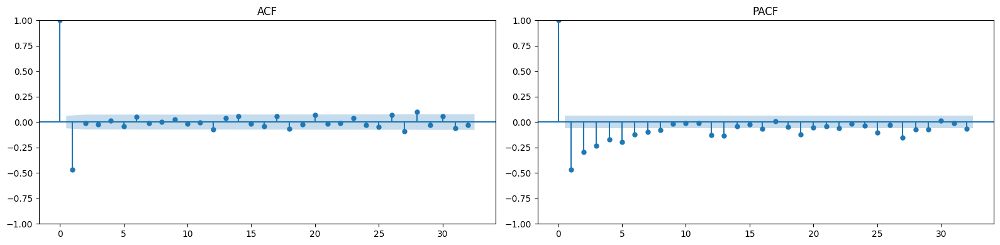

In [459]:
ts_toolkit.stationarity_tests(d=1, col='yeojohnson_cnt', plot=True)

### ETS MODEL

In [460]:
# ts_toolkit.fit('yeojohnson_cnt', model_type='ets', auto_fit_mode=True, verbose=False)
# ts_toolkit.save_model(path=MAIN_RESULTS[STORE]['ets']['model_path'])

In [461]:
restored_model = ts_toolkit.load_model(MAIN_RESULTS[STORE]['ets']['model_path'], model_type='ets')
MAIN_RESULTS[STORE]['ets'][f'resids'], MAIN_RESULTS[STORE]['ets'][f'pvals'] = ts_toolkit.check_residuals()

t-тест Стьюдента на равенство 0: t-статистика = 0.048, p-значение = 0.9617
✅ Среднее значение остатков не отличается от 0
Критерий Вилкоксона: статистика = 256446.000, p-значение = 0.5648
✅ Медиана остатков не отличается от 0
Тест Жарка-Бера: статистика = 1.35, p-значение = 0.5097
✅ Остатки распределены нормально
Тест Льюнга-Бокса (lags=40): статистика = 113.33, p-значение = 0.0000
❌ Остатки автокоррелированы
Тест Бройша-Пагана: статистика = 11.19, p-значение = 0.0008
❌ Есть гетероскедастичность


In [462]:
for period in [7,30,90]:
    pred = ts_toolkit.predict(steps=period)
    restored_pred = ts_toolkit.inverse_yeojohnson(pred)
    test_30 = df_test[['cnt']].iloc[:period]['cnt']
    MAIN_RESULTS[STORE]['ets'][f'res_{period}'] = ts_toolkit.evaluate_forecast(list(test_30), list(restored_pred))
    MAIN_RESULTS[STORE]['ets'][f'pred_{period}'] = restored_pred

📊 Оценка прогноза:
MAE  = 4.32
RMSE = 4.95
📊 Оценка прогноза:
MAE  = 4.37
RMSE = 5.54
📊 Оценка прогноза:
MAE  = 4.05
RMSE = 5.13


### SARIMA MODEL

In [463]:
# ts_toolkit.fit('yeojohnson_cnt', model_type='sarimax', order=(3,1,4), seasonal_order=(0,1,1,7))
# ts_toolkit.save_model(path=MAIN_RESULTS[STORE]['sarima']['model_path'])

In [464]:
restored_model = ts_toolkit.load_model(MAIN_RESULTS[STORE]['sarima']['model_path'], model_type='sarimax')
MAIN_RESULTS[STORE]['sarima'][f'resids'],MAIN_RESULTS[STORE]['sarima'][f'pvals'] = ts_toolkit.check_residuals()

t-тест Стьюдента на равенство 0: t-статистика = 1.779, p-значение = 0.0755
✅ Среднее значение остатков не отличается от 0
Критерий Вилкоксона: статистика = 241754.000, p-значение = 0.0332
❌ Медиана остатков статистически отличается от 0
Тест Жарка-Бера: статистика = 1.83, p-значение = 0.3997
✅ Остатки распределены нормально
Тест Льюнга-Бокса (lags=40): статистика = 51.48, p-значение = 0.1056
✅ Остатки не автокоррелированы
Тест Бройша-Пагана: статистика = 23.06, p-значение = 0.0000
❌ Есть гетероскедастичность


In [465]:
for period in [7,30,90]:
    pred = ts_toolkit.predict(steps=period)
    restored_pred = ts_toolkit.inverse_yeojohnson(pred)
    test_30 = df_test[['cnt']].iloc[:period]['cnt']
    MAIN_RESULTS[STORE]['sarima'][f'res_{period}'] = ts_toolkit.evaluate_forecast(list(test_30), list(restored_pred))
    MAIN_RESULTS[STORE]['sarima'][f'pred_{period}'] = restored_pred

📊 Оценка прогноза:
MAE  = 4.13
RMSE = 5.00
📊 Оценка прогноза:
MAE  = 4.75
RMSE = 6.01
📊 Оценка прогноза:
MAE  = 4.39
RMSE = 5.59


### PROPHET MODEL

In [466]:
# custom_seasons = [
#     {'name': 'quarterly', 'period': 365.25/4, 'fourier_order': 10}
# ]

# ts_toolkit.fit(
#     'yeojohnson_cnt', 
#     model_type='prophet', 
#     seasonality_mode='additive',
#     changepoint_prior_scale=0.1,
#     custom_seasonalities=custom_seasons
# )
# ts_toolkit.save_model(path=MAIN_RESULTS[STORE]['prophet']['model_path'])

In [467]:
restored_model = ts_toolkit.load_model(MAIN_RESULTS[STORE]['prophet']['model_path'], model_type='prophet')
MAIN_RESULTS[STORE]['prophet'][f'resids'], MAIN_RESULTS[STORE]['prophet'][f'pvals'] = ts_toolkit.check_residuals()

t-тест Стьюдента на равенство 0: t-статистика = -0.005, p-значение = 0.9963
✅ Среднее значение остатков не отличается от 0
Критерий Вилкоксона: статистика = 255086.000, p-значение = 0.4718
✅ Медиана остатков не отличается от 0
Тест Жарка-Бера: статистика = 4.68, p-значение = 0.0964
✅ Остатки распределены нормально
Тест Льюнга-Бокса (lags=40): статистика = 54.36, p-значение = 0.0644
✅ Остатки не автокоррелированы
Тест Бройша-Пагана: статистика = 9.55, p-значение = 0.0020
❌ Есть гетероскедастичность


In [468]:
for period in [7,30,90]:
    pred = ts_toolkit.predict(steps=period)
    restored_pred = ts_toolkit.inverse_yeojohnson(pred)
    test_values = df_test['cnt'].iloc[:period]
    MAIN_RESULTS[STORE]['prophet'][f'res_{period}'] = ts_toolkit.evaluate_forecast(list(test_values), list(restored_pred),)
    MAIN_RESULTS[STORE]['prophet'][f'pred_{period}'] = restored_pred

📊 Оценка прогноза:
MAE  = 4.22
RMSE = 5.05
📊 Оценка прогноза:
MAE  = 4.54
RMSE = 5.83
📊 Оценка прогноза:
MAE  = 4.10
RMSE = 5.23


### BOOSTING_MODEL


In [469]:
exog_vars = [ 'lag_1', 'lag_7', 'lag_30', 'lag_90', 'sell_price', 'wday', 'month', 'has_event']

In [470]:
# exog = ts_toolkit.df[exog_vars]
# exog = exog.astype(float)

# params = {
#     'objective': 'regression',
#     'metric': 'rmse',
#     'verbosity': 1,
#     'boosting_type': 'gbdt',
#     'seed': 42,
#     'num_leaves': 10,     
#     'min_data_in_leaf': 3,     
#     'max_depth': 8,      
# }

# ts_toolkit.fit(
#     'yeojohnson_cnt', 
#     model_type='boosting', 
#     exog=exog,
#     params = params
# )
# ts_toolkit.save_model(path=MAIN_RESULTS[STORE]['boosting']['model_path'])

In [471]:
restored_model = ts_toolkit.load_model(MAIN_RESULTS[STORE]['boosting']['model_path'], model_type='boosting')
MAIN_RESULTS[STORE]['boosting'][f'resids'], MAIN_RESULTS[STORE]['boosting']['pvals'] = ts_toolkit.check_residuals()

t-тест Стьюдента на равенство 0: t-статистика = -0.000, p-значение = 1.0000
✅ Среднее значение остатков не отличается от 0
Критерий Вилкоксона: статистика = 259474.000, p-значение = 0.7984
✅ Медиана остатков не отличается от 0
Тест Жарка-Бера: статистика = 2.01, p-значение = 0.3662
✅ Остатки распределены нормально
Тест Льюнга-Бокса (lags=40): статистика = 41.77, p-значение = 0.3938
✅ Остатки не автокоррелированы
Тест Бройша-Пагана: статистика = 0.38, p-значение = 0.5386
✅ Гомоскедастичность (гетероскедастичность не обнаружена)


In [472]:
for period in [7,30,90]:
    
    exog_forecast = df_test[exog_vars].iloc[:period]

    pred = ts_toolkit.predict(steps=period, exog = exog_forecast)
    restored_pred = ts_toolkit.inverse_yeojohnson(pred)

    test_values = df_test['cnt'].iloc[:period]
    MAIN_RESULTS[STORE]['boosting'][f'res_{period}'] = ts_toolkit.evaluate_forecast(list(test_values), list(restored_pred))
    MAIN_RESULTS[STORE]['boosting'][f'pred_{period}'] = restored_pred

📊 Оценка прогноза:
MAE  = 4.05
RMSE = 4.98
📊 Оценка прогноза:
MAE  = 4.93
RMSE = 6.41
📊 Оценка прогноза:
MAE  = 4.29
RMSE = 5.70


## STORE_2_090

In [473]:
STORE = 'STORE_2_090'
MAIN_RESULTS[STORE] = {}
MAIN_RESULTS[STORE]['ets'] = {}
MAIN_RESULTS[STORE]['ets']['model_path'] = f'models/ets/model_{STORE}.pkl'
MAIN_RESULTS[STORE]['sarima'] = {}
MAIN_RESULTS[STORE]['sarima']['model_path'] = f'models/sarima/model_{STORE}.pkl'
MAIN_RESULTS[STORE]['prophet'] = {}
MAIN_RESULTS[STORE]['prophet']['model_path'] = f'models/prophet/model_{STORE}.pkl'
MAIN_RESULTS[STORE]['boosting'] = {}
MAIN_RESULTS[STORE]['boosting']['model_path'] = f'models/boosting/model_{STORE}.pkl'

In [474]:
df_train = train[train['item_id']==STORE]
df_train = df_train.sort_values('date_id')
df_train = df_train[df_train['year']>2014]

In [475]:
df_test = test[test['item_id']==STORE]
df_test = df_test.sort_values('date_id')

In [476]:
ts_toolkit = TimeSeriesForecastingToolkit(df_train, period= 30, date_col='date', event_cols=['event_name_1', 'event_name_2'])
ts_toolkit.yeojohnson_transform('cnt')

### EDA

In [477]:
# ts_toolkit.analyze(col='cnt')

In [478]:
ts_toolkit.stationarity_tests(D=0, period=7, col='cnt')

=== Стационарность: d=0, D=0 ===

=== KPSS Test ===
Statistic: 0.4296114606371798, p-value: 0.06439161179431906
✅ Стационарен

=== ADF Test ===
Statistic: -3.1450410308959973, p-value: 0.023394587323979577
✅ Стационарен


### ETS MODEL

In [479]:
# ts_toolkit.fit('yeojohnson_cnt', model_type='ets', auto_fit_mode=True, verbose=False)
# ts_toolkit.save_model(path=MAIN_RESULTS[STORE]['ets']['model_path'])

In [480]:
restored_model = ts_toolkit.load_model(MAIN_RESULTS[STORE]['ets']['model_path'], model_type='ets')
MAIN_RESULTS[STORE]['ets'][f'resids'], MAIN_RESULTS[STORE]['ets'][f'pvals'] = ts_toolkit.check_residuals()

t-тест Стьюдента на равенство 0: t-статистика = 0.322, p-значение = 0.7479
✅ Среднее значение остатков не отличается от 0
Критерий Вилкоксона: статистика = 21415.000, p-значение = 0.9338
✅ Медиана остатков не отличается от 0
Тест Жарка-Бера: статистика = 903.02, p-значение = 0.0000
❌ Остатки не распределены нормально
Тест Льюнга-Бокса (lags=40): статистика = 44.87, p-значение = 0.2750
✅ Остатки не автокоррелированы
Тест Бройша-Пагана: статистика = 0.36, p-значение = 0.5513
✅ Гомоскедастичность (гетероскедастичность не обнаружена)


In [481]:
for period in [7,30,90]:
    pred = ts_toolkit.predict(steps=period)
    restored_pred = ts_toolkit.inverse_yeojohnson(pred)
    test_30 = df_test[['cnt']].iloc[:period]['cnt']
    MAIN_RESULTS[STORE]['ets'][f'res_{period}'] = ts_toolkit.evaluate_forecast(list(test_30), list(restored_pred))
    MAIN_RESULTS[STORE]['ets'][f'pred_{period}'] = restored_pred

📊 Оценка прогноза:
MAE  = 10.91
RMSE = 12.24
📊 Оценка прогноза:
MAE  = 17.79
RMSE = 21.04
📊 Оценка прогноза:
MAE  = 57.89
RMSE = 76.01


### SARIMA MODEL

In [482]:
exog_vars = ['sell_price', 'wday', 'month', 'has_event']
exog = ts_toolkit.df[exog_vars]
exog = exog.astype(float)

In [483]:
# ts_toolkit.fit('cnt', model_type='sarimax', order=(5,0,1), exog=exog, seasonal_order=(1,2,3,7), enforce_stationarity=False, enforce_invertibility=True)
# ts_toolkit.save_model(path=MAIN_RESULTS[STORE]['sarima']['model_path'])

In [484]:
restored_model = ts_toolkit.load_model(MAIN_RESULTS[STORE]['sarima']['model_path'], model_type='sarimax')
MAIN_RESULTS[STORE]['sarima'][f'resids'],MAIN_RESULTS[STORE]['sarima'][f'pvals'] = ts_toolkit.check_residuals()

t-тест Стьюдента на равенство 0: t-статистика = -0.091, p-значение = 0.9277
✅ Среднее значение остатков не отличается от 0
Критерий Вилкоксона: статистика = 102852.000, p-значение = 0.2549
✅ Медиана остатков не отличается от 0
Тест Жарка-Бера: статистика = 1130.25, p-значение = 0.0000
❌ Остатки не распределены нормально
Тест Льюнга-Бокса (lags=40): статистика = 51.60, p-значение = 0.1034
✅ Остатки не автокоррелированы
Тест Бройша-Пагана: статистика = 27.32, p-значение = 0.0000
❌ Есть гетероскедастичность


In [485]:
for period in [7,30,90]:
    exog_forecast = df_test[exog_vars].iloc[:period]
    exog_forecast = exog_forecast.astype(float)
    pred = ts_toolkit.predict(steps=period, exog=exog_forecast)
    test_30 = df_test[['cnt']].iloc[:period]['cnt']
    MAIN_RESULTS[STORE]['sarima'][f'res_{period}'] = ts_toolkit.evaluate_forecast(list(test_30), list(pred))
    MAIN_RESULTS[STORE]['sarima'][f'pred_{period}'] = pred


📊 Оценка прогноза:
MAE  = 4.31
RMSE = 4.85
📊 Оценка прогноза:
MAE  = 16.61
RMSE = 22.90
📊 Оценка прогноза:
MAE  = 38.88
RMSE = 54.12


### PROPHET MODEL

In [486]:
exog_vars = ['sell_price']

In [487]:
# custom_seasons = [
#     {'name': 'quarterly', 'period': 365.25/4, 'fourier_order': 10}
# ]

# exog = ts_toolkit.df[exog_vars]
# exog = exog.astype(float)

# ts_toolkit.fit(
#     'cnt', 
#     model_type='prophet', 
#     seasonality_mode='additive',
#     holidays=holidays_df,
#     exog = exog,
# )
# ts_toolkit.save_model(path=MAIN_RESULTS[STORE]['prophet']['model_path'])

In [488]:
restored_model = ts_toolkit.load_model(MAIN_RESULTS[STORE]['prophet']['model_path'], model_type='prophet')
MAIN_RESULTS[STORE]['prophet'][f'resids'], MAIN_RESULTS[STORE]['prophet'][f'pvals'] = ts_toolkit.check_residuals()

t-тест Стьюдента на равенство 0: t-статистика = 28.662, p-значение = 0.0000
❌ Среднее значение остатков статистически значимо отличается от 0
Тест Жарка-Бера: статистика = 127.78, p-значение = 0.0000
❌ Остатки не распределены нормально
Тест Льюнга-Бокса (lags=40): статистика = 1667.50, p-значение = 0.0000
❌ Остатки автокоррелированы
Тест Бройша-Пагана: статистика = 15.80, p-значение = 0.0001
❌ Есть гетероскедастичность


In [489]:
for period in [7,30,90]:
    exog_forecast = df_test[exog_vars].iloc[:period]
    pred = ts_toolkit.predict(steps=period, exog=exog_forecast)
    test_values = df_test['cnt'].iloc[:period]
    MAIN_RESULTS[STORE]['prophet'][f'res_{period}'] = ts_toolkit.evaluate_forecast(list(test_values), list(pred))
    MAIN_RESULTS[STORE]['prophet'][f'pred_{period}'] = pred

📊 Оценка прогноза:
MAE  = 11.50
RMSE = 12.72
📊 Оценка прогноза:
MAE  = 20.00
RMSE = 25.95
📊 Оценка прогноза:
MAE  = 42.57
RMSE = 62.88


### BOOSTING_MODEL


In [490]:
exog_vars = [ 'lag_1', 'lag_7', 'lag_30', 'lag_90', 'sell_price', 'wday', 'month', 'has_event']

In [491]:
# exog = ts_toolkit.df[exog_vars]
# exog = exog.astype(float)

# ts_toolkit.fit(
#     'yeojohnson_cnt', 
#     model_type='boosting', 
#     exog=exog,
# )
# ts_toolkit.save_model(path=MAIN_RESULTS[STORE]['boosting']['model_path'])

In [492]:
restored_model = ts_toolkit.load_model(MAIN_RESULTS[STORE]['boosting']['model_path'], model_type='boosting')
MAIN_RESULTS[STORE]['boosting'][f'resids'], MAIN_RESULTS[STORE]['boosting']['pvals'] = ts_toolkit.check_residuals()

t-тест Стьюдента на равенство 0: t-статистика = 0.000, p-значение = 1.0000
✅ Среднее значение остатков не отличается от 0
Критерий Вилкоксона: статистика = 20949.000, p-значение = 0.6862
✅ Медиана остатков не отличается от 0
Тест Жарка-Бера: статистика = 952.72, p-значение = 0.0000
❌ Остатки не распределены нормально
Тест Льюнга-Бокса (lags=40): статистика = 37.81, p-значение = 0.5691
✅ Остатки не автокоррелированы
Тест Бройша-Пагана: статистика = 0.04, p-значение = 0.8374
✅ Гомоскедастичность (гетероскедастичность не обнаружена)


📊 Оценка прогноза:
MAE  = 17.26
RMSE = 18.56


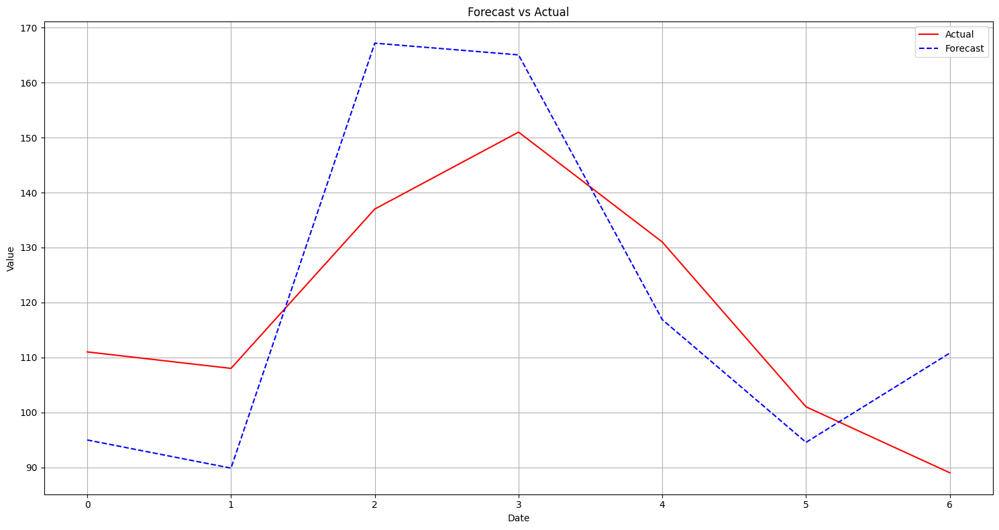

📊 Оценка прогноза:
MAE  = 17.76
RMSE = 21.77


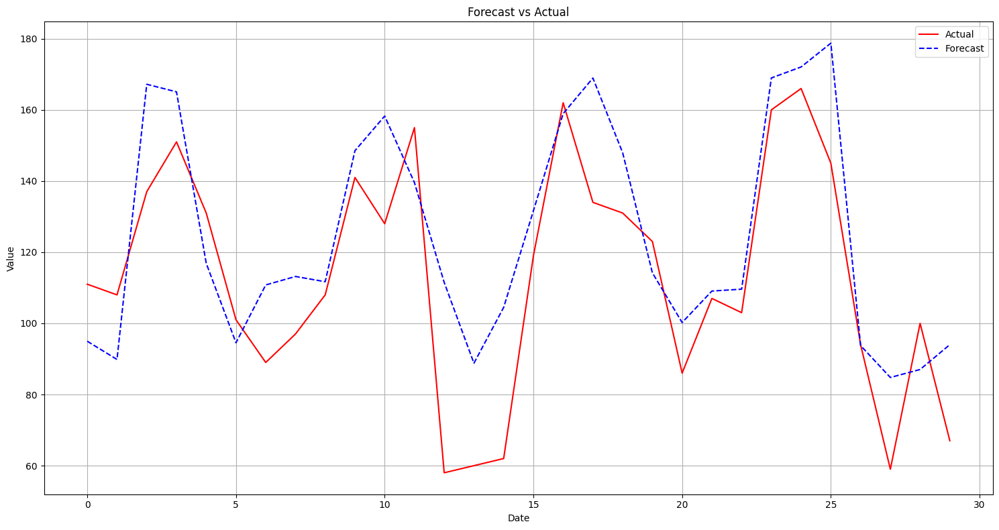

📊 Оценка прогноза:
MAE  = 22.81
RMSE = 40.81


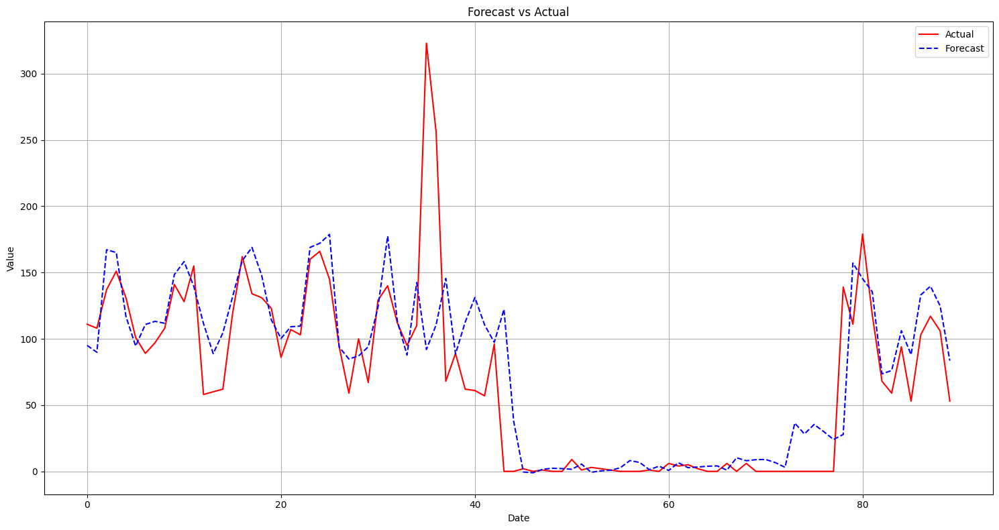

In [493]:
for period in [7,30,90]:
    
    exog_forecast = df_test[exog_vars].iloc[:period]

    pred = ts_toolkit.predict(steps=period, exog = exog_forecast)
    restored_pred = ts_toolkit.inverse_yeojohnson(pred)

    test_values = df_test['cnt'].iloc[:period]
    MAIN_RESULTS[STORE]['boosting'][f'res_{period}'] = ts_toolkit.evaluate_forecast(list(test_values), list(restored_pred), plot = True)
    MAIN_RESULTS[STORE]['boosting'][f'pred_{period}'] = restored_pred

## STORE_2_252

In [494]:
STORE = 'STORE_2_252'
MAIN_RESULTS[STORE] = {}
MAIN_RESULTS[STORE]['ets'] = {}
MAIN_RESULTS[STORE]['ets']['model_path'] = f'models/ets/model_{STORE}.pkl'
MAIN_RESULTS[STORE]['sarima'] = {}
MAIN_RESULTS[STORE]['sarima']['model_path'] = f'models/sarima/model_{STORE}.pkl'
MAIN_RESULTS[STORE]['prophet'] = {}
MAIN_RESULTS[STORE]['prophet']['model_path'] = f'models/prophet/model_{STORE}.pkl'
MAIN_RESULTS[STORE]['boosting'] = {}
MAIN_RESULTS[STORE]['boosting']['model_path'] = f'models/boosting/model_{STORE}.pkl'

In [495]:
df_train = train[train['item_id']==STORE]
df_train = df_train.sort_values('date_id')

In [496]:
df_test = test[test['item_id']==STORE]
df_test = df_test.sort_values('date_id')

In [497]:
ts_toolkit = TimeSeriesForecastingToolkit(df_train, period= 30, year=2013, date_col='date', event_cols=['event_name_1', 'event_name_2'])
ts_toolkit.yeojohnson_transform('cnt')

### EDA

Use self-module df


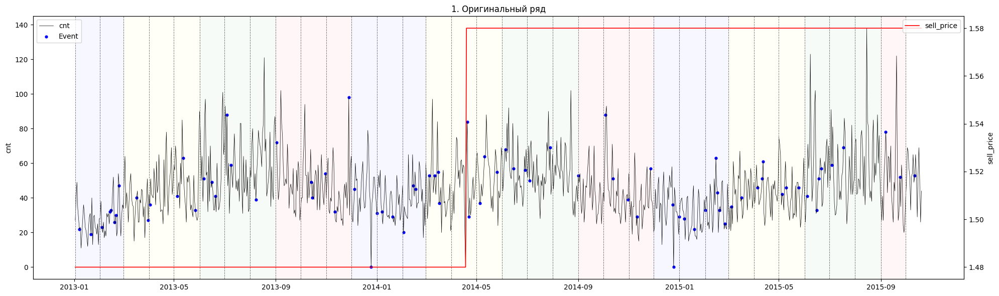

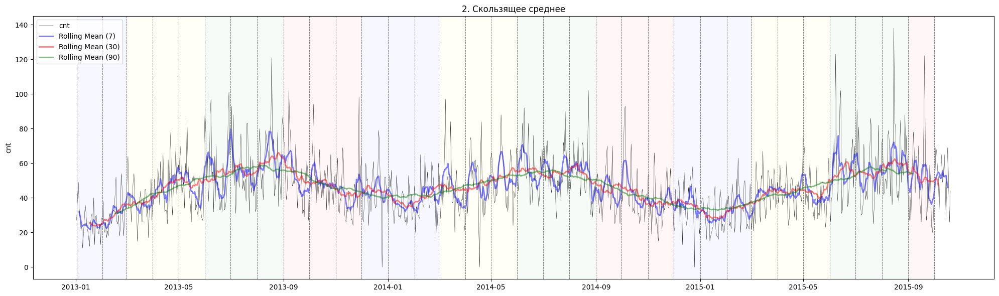

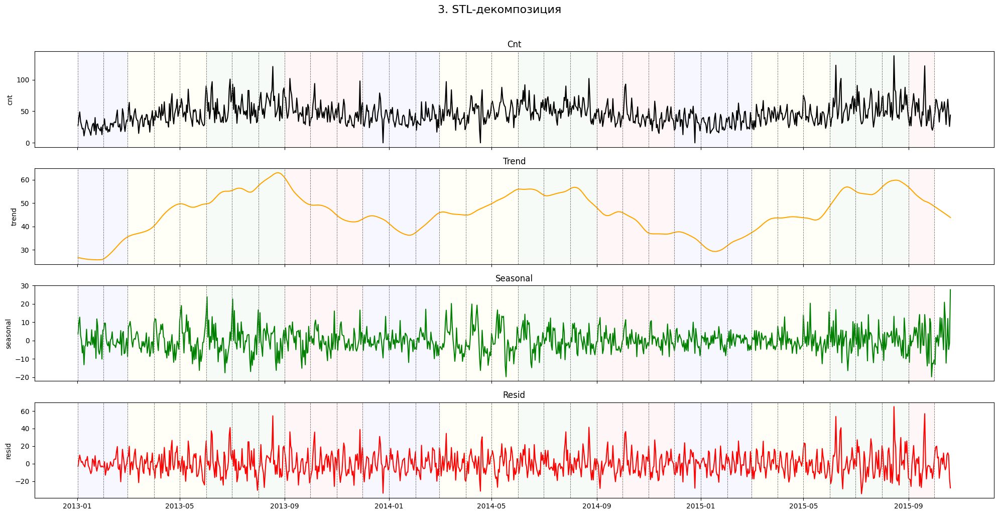

In [498]:
ts_toolkit.analyze(col='cnt')

In [499]:
ts_toolkit.stationarity_tests(d=1, D=1, col='yeojohnson_cnt', period=7)

=== Стационарность: d=1, D=1, period=7 ===

=== KPSS Test ===
Statistic: 0.08282173475630168, p-value: 0.1
✅ Стационарен

=== ADF Test ===
Statistic: -15.09210442389969, p-value: 8.16524878913462e-28
✅ Стационарен


### ETS MODEL

In [500]:
# ts_toolkit.fit('yeojohnson_cnt', model_type='ets', auto_fit_mode=True, verbose=False)
# ts_toolkit.save_model(path=MAIN_RESULTS[STORE]['ets']['model_path'])

In [501]:
restored_model = ts_toolkit.load_model(MAIN_RESULTS[STORE]['ets']['model_path'], model_type='ets')
MAIN_RESULTS[STORE]['ets'][f'resids'], MAIN_RESULTS[STORE]['ets'][f'pvals'] = ts_toolkit.check_residuals()

t-тест Стьюдента на равенство 0: t-статистика = 0.173, p-значение = 0.8631
✅ Среднее значение остатков не отличается от 0
Критерий Вилкоксона: статистика = 261034.000, p-значение = 0.9711
✅ Медиана остатков не отличается от 0
Тест Жарка-Бера: статистика = 758.73, p-значение = 0.0000
❌ Остатки не распределены нормально
Тест Льюнга-Бокса (lags=40): статистика = 88.25, p-значение = 0.0000
❌ Остатки автокоррелированы
Тест Бройша-Пагана: статистика = 0.23, p-значение = 0.6287
✅ Гомоскедастичность (гетероскедастичность не обнаружена)


In [502]:
for period in [7,30,90]:
    pred = ts_toolkit.predict(steps=period)
    restored_pred = ts_toolkit.inverse_yeojohnson(pred)
    test_30 = df_test[['cnt']].iloc[:period]['cnt']
    MAIN_RESULTS[STORE]['ets'][f'res_{period}'] = ts_toolkit.evaluate_forecast(list(test_30), list(restored_pred))
    MAIN_RESULTS[STORE]['ets'][f'pred_{period}'] = restored_pred

📊 Оценка прогноза:
MAE  = 6.42
RMSE = 8.52
📊 Оценка прогноза:
MAE  = 7.43
RMSE = 9.63
📊 Оценка прогноза:
MAE  = 11.04
RMSE = 14.28


### SARIMA MODEL

In [503]:
exog_vars = ['wday', 'month','is_christmas']
exog = ts_toolkit.df[exog_vars]
exog = exog.astype(float)

In [504]:
# ts_toolkit.fit('yeojohnson_cnt', model_type='sarimax', exog = exog, order=(1,1,1), seasonal_order=(0, 1 ,1, 7))
# ts_toolkit.save_model(path=MAIN_RESULTS[STORE]['sarima']['model_path'])

In [505]:
restored_model = ts_toolkit.load_model(MAIN_RESULTS[STORE]['sarima']['model_path'], model_type='sarimax')
MAIN_RESULTS[STORE]['sarima'][f'resids'],MAIN_RESULTS[STORE]['sarima'][f'pvals'] = ts_toolkit.check_residuals()

t-тест Стьюдента на равенство 0: t-статистика = -0.459, p-значение = 0.6460
✅ Среднее значение остатков не отличается от 0
Критерий Вилкоксона: статистика = 250705.000, p-значение = 0.2582
✅ Медиана остатков не отличается от 0
Тест Жарка-Бера: статистика = 239.48, p-значение = 0.0000
❌ Остатки не распределены нормально
Тест Льюнга-Бокса (lags=40): статистика = 52.08, p-значение = 0.0955
✅ Остатки не автокоррелированы
Тест Бройша-Пагана: статистика = 1.22, p-значение = 0.2703
✅ Гомоскедастичность (гетероскедастичность не обнаружена)


📊 Оценка прогноза:
MAE  = 6.83
RMSE = 8.59


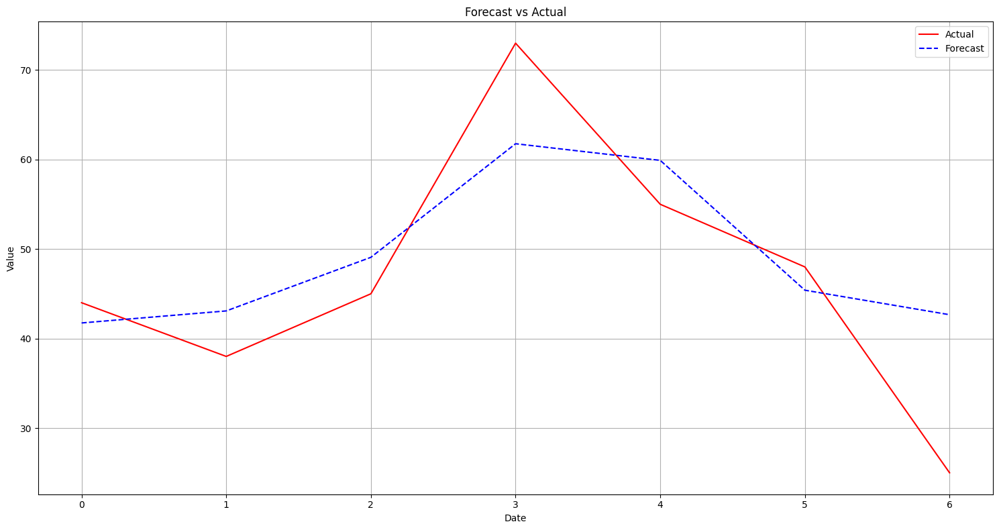

📊 Оценка прогноза:
MAE  = 8.81
RMSE = 10.75


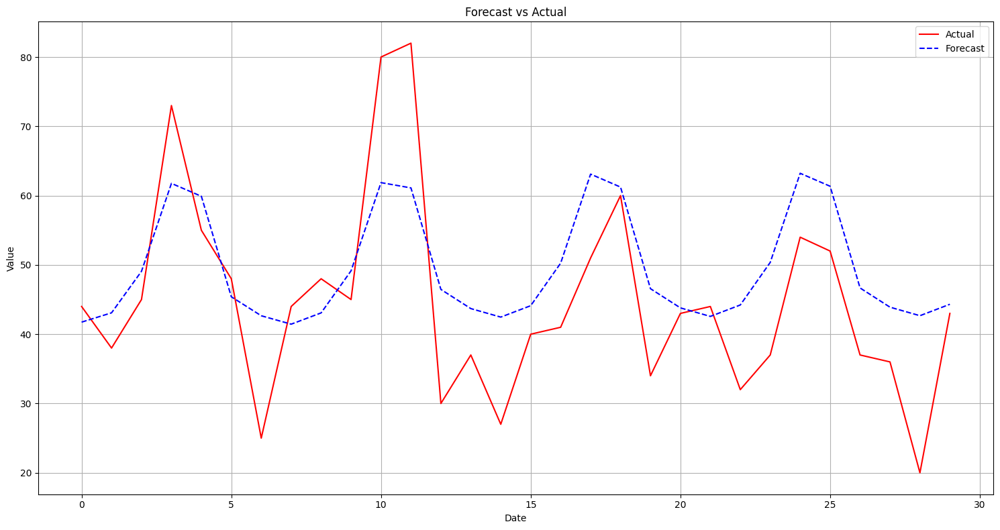

📊 Оценка прогноза:
MAE  = 11.40
RMSE = 13.64


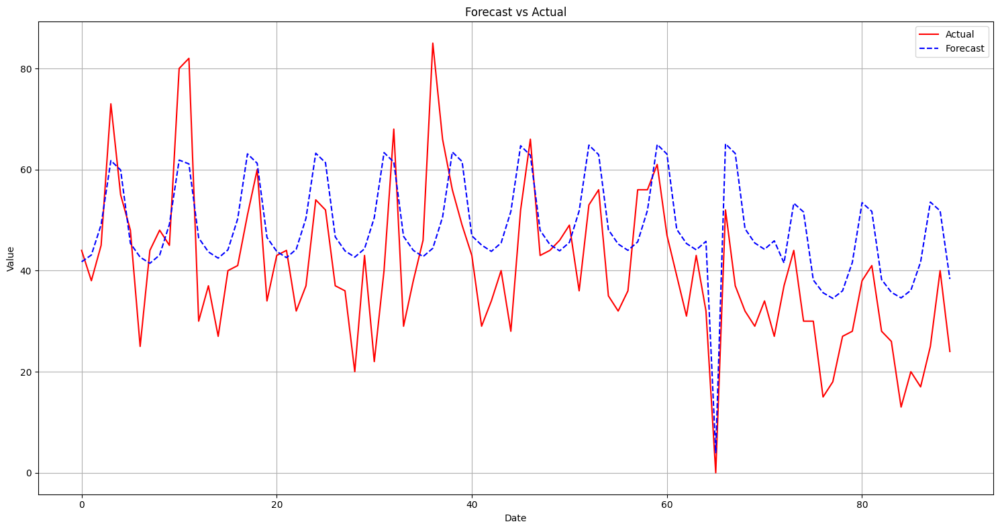

In [506]:
for period in [7,30,90]:
    exog_forecast = df_test[exog_vars].iloc[:period]
    exog_forecast = exog_forecast.astype(float)
    pred = ts_toolkit.predict(steps=period, exog=exog_forecast)
    restored_pred = ts_toolkit.inverse_yeojohnson(pred)
    test_30 = df_test[['cnt']].iloc[:period]['cnt']
    MAIN_RESULTS[STORE]['sarima'][f'res_{period}'] = ts_toolkit.evaluate_forecast(list(test_30), list(restored_pred), plot=True)
    MAIN_RESULTS[STORE]['sarima'][f'pred_{period}'] = restored_pred


### PROPHET MODEL

In [507]:
ts_toolkit = TimeSeriesForecastingToolkit(df_train, period= 30, year=2012, date_col='date', event_cols=['event_name_1', 'event_name_2'])
ts_toolkit.yeojohnson_transform('cnt')

In [508]:
# custom_seasons = [
#     {'name': 'half_year', 'period': 90, 'fourier_order': 10},
# ]

# ts_toolkit.fit(
#     'yeojohnson_cnt', 
#     model_type='prophet', 
#     seasonality_mode='multiplicative',
#     changepoint_prior_scale = 0.1,
#     holidays_prior_scale=20,
#     holidays = significant_holidays_df,
#     custom_seasonalities=custom_seasons
# )

# ts_toolkit.save_model(path=MAIN_RESULTS[STORE]['prophet']['model_path'])

In [509]:
restored_model = ts_toolkit.load_model(MAIN_RESULTS[STORE]['prophet']['model_path'], model_type='prophet')
MAIN_RESULTS[STORE]['prophet'][f'resids'], MAIN_RESULTS[STORE]['prophet'][f'pvals'] = ts_toolkit.check_residuals()

t-тест Стьюдента на равенство 0: t-статистика = -0.001, p-значение = 0.9994
✅ Среднее значение остатков не отличается от 0
Критерий Вилкоксона: статистика = 473496.000, p-значение = 0.5699
✅ Медиана остатков не отличается от 0
Тест Жарка-Бера: статистика = 451.14, p-значение = 0.0000
❌ Остатки не распределены нормально
Тест Льюнга-Бокса (lags=40): статистика = 164.90, p-значение = 0.0000
❌ Остатки автокоррелированы
Тест Бройша-Пагана: статистика = 3.38, p-значение = 0.0659
✅ Гомоскедастичность (гетероскедастичность не обнаружена)


In [510]:

for period in [7,30,90]:

    pred = ts_toolkit.predict(steps=period)
    restored_pred = ts_toolkit.inverse_yeojohnson(pred)

    test_values = df_test['cnt'].iloc[:period]
    MAIN_RESULTS[STORE]['prophet'][f'res_{period}'] = ts_toolkit.evaluate_forecast(list(test_values), list(restored_pred))
    MAIN_RESULTS[STORE]['prophet'][f'pred_{period}'] = restored_pred


📊 Оценка прогноза:
MAE  = 6.94
RMSE = 9.29
📊 Оценка прогноза:
MAE  = 7.26
RMSE = 9.77
📊 Оценка прогноза:
MAE  = 8.06
RMSE = 10.40


### BOOSTING_MODEL


In [511]:
ts_toolkit = TimeSeriesForecastingToolkit(df_train, period= 30, year=2014, date_col='date', event_cols=['event_name_1', 'event_name_2'])
ts_toolkit.yeojohnson_transform('cnt')

In [512]:
exog_vars = [ 'lag_1', 'lag_7', 'lag_30', 'lag_90', 'is_christmas','sell_price', 'wday', 'month', 'has_event']

In [513]:
# exog = ts_toolkit.df[exog_vars]
# exog = exog.astype(float)

# ts_toolkit.fit(
#     'yeojohnson_cnt', 
#     model_type='boosting', 
#     exog=exog,
# )
# ts_toolkit.save_model(path=MAIN_RESULTS[STORE]['boosting']['model_path'])

In [514]:
restored_model = ts_toolkit.load_model(MAIN_RESULTS[STORE]['boosting']['model_path'], model_type='boosting')
MAIN_RESULTS[STORE]['boosting'][f'resids'], MAIN_RESULTS[STORE]['boosting']['pvals'] = ts_toolkit.check_residuals()

t-тест Стьюдента на равенство 0: t-статистика = 0.000, p-значение = 1.0000
✅ Среднее значение остатков не отличается от 0
Критерий Вилкоксона: статистика = 107896.000, p-значение = 0.9704
✅ Медиана остатков не отличается от 0
Тест Жарка-Бера: статистика = 318.00, p-значение = 0.0000
❌ Остатки не распределены нормально
Тест Льюнга-Бокса (lags=40): статистика = 50.16, p-значение = 0.1303
✅ Остатки не автокоррелированы
Тест Бройша-Пагана: статистика = 0.52, p-значение = 0.4714
✅ Гомоскедастичность (гетероскедастичность не обнаружена)


In [515]:
for period in [7,30,90]:
    
    exog_forecast = df_test[exog_vars].iloc[:period]

    pred = ts_toolkit.predict(steps=period, exog = exog_forecast)
    restored_pred = ts_toolkit.inverse_yeojohnson(pred)

    test_values = df_test['cnt'].iloc[:period]
    MAIN_RESULTS[STORE]['boosting'][f'res_{period}'] = ts_toolkit.evaluate_forecast(list(test_values), list(restored_pred))
    MAIN_RESULTS[STORE]['boosting'][f'pred_{period}'] = restored_pred

📊 Оценка прогноза:
MAE  = 7.98
RMSE = 8.68
📊 Оценка прогноза:
MAE  = 7.76
RMSE = 9.05
📊 Оценка прогноза:
MAE  = 8.61
RMSE = 11.68


## STORE_2_376

In [516]:
STORE = 'STORE_2_376'
MAIN_RESULTS[STORE] = {}
MAIN_RESULTS[STORE]['ets'] = {}
MAIN_RESULTS[STORE]['ets']['model_path'] = f'models/ets/model_{STORE}.pkl'
MAIN_RESULTS[STORE]['sarima'] = {}
MAIN_RESULTS[STORE]['sarima']['model_path'] = f'models/sarima/model_{STORE}.pkl'
MAIN_RESULTS[STORE]['prophet'] = {}
MAIN_RESULTS[STORE]['prophet']['model_path'] = f'models/prophet/model_{STORE}.pkl'
MAIN_RESULTS[STORE]['boosting'] = {}
MAIN_RESULTS[STORE]['boosting']['model_path'] = f'models/boosting/model_{STORE}.pkl'

In [517]:
df_train = train[train['item_id']==STORE]
df_train = df_train.sort_values('date_id')
df_train = df_train[df_train['year']>2014]

In [518]:
df_test = test[test['item_id']==STORE]

df_test = df_test.sort_values('date_id')

In [519]:
ts_toolkit = TimeSeriesForecastingToolkit(df_train, period= 30, date_col='date', event_cols=['event_name_1', 'event_name_2'])
ts_toolkit.yeojohnson_transform('cnt')

### EDA

In [520]:
# ts_toolkit.analyze(col='cnt')

In [521]:
ts_toolkit.stationarity_tests(d=1, col='yeojohnson_cnt')

=== Стационарность: d=1, D=0 ===

=== KPSS Test ===
Statistic: 0.3049275969412939, p-value: 0.1
✅ Стационарен

=== ADF Test ===
Statistic: -7.930749579011256, p-value: 3.5185653363750103e-12
✅ Стационарен


### ETS MODEL

In [522]:
# ts_toolkit.fit('yeojohnson_cnt', model_type='ets', auto_fit_mode=True, verbose=False)
# ts_toolkit.save_model(path=MAIN_RESULTS[STORE]['ets']['model_path'])

In [523]:
restored_model = ts_toolkit.load_model(MAIN_RESULTS[STORE]['ets']['model_path'], model_type='ets')
MAIN_RESULTS[STORE]['ets'][f'resids'], MAIN_RESULTS[STORE]['ets'][f'pvals'] = ts_toolkit.check_residuals()

t-тест Стьюдента на равенство 0: t-статистика = -0.082, p-значение = 0.9349
✅ Среднее значение остатков не отличается от 0
Критерий Вилкоксона: статистика = 20895.000, p-значение = 0.6590
✅ Медиана остатков не отличается от 0
Тест Жарка-Бера: статистика = 13.53, p-значение = 0.0012
❌ Остатки не распределены нормально
Тест Льюнга-Бокса (lags=40): статистика = 48.16, p-значение = 0.1762
✅ Остатки не автокоррелированы
Тест Бройша-Пагана: статистика = 0.03, p-значение = 0.8595
✅ Гомоскедастичность (гетероскедастичность не обнаружена)


In [524]:
for period in [7,30,90]:
    pred = ts_toolkit.predict(steps=period)
    restored_pred = ts_toolkit.inverse_yeojohnson(pred)
    test_30 = df_test[['cnt']].iloc[:period]['cnt']
    MAIN_RESULTS[STORE]['ets'][f'res_{period}'] = ts_toolkit.evaluate_forecast(list(test_30), list(restored_pred))
    MAIN_RESULTS[STORE]['ets'][f'pred_{period}'] = restored_pred

📊 Оценка прогноза:
MAE  = 3.07
RMSE = 3.50
📊 Оценка прогноза:
MAE  = 2.79
RMSE = 3.21
📊 Оценка прогноза:
MAE  = 3.21
RMSE = 3.74


### SARIMA MODEL

In [525]:
# ts_toolkit.fit('yeojohnson_cnt', model_type='sarimax', order=(1,1,1), seasonal_order=(1, 0 , 1, 7))
# ts_toolkit.save_model(path=MAIN_RESULTS[STORE]['sarima']['model_path'])

In [526]:
restored_model = ts_toolkit.load_model(MAIN_RESULTS[STORE]['sarima']['model_path'], model_type='sarimax')
MAIN_RESULTS[STORE]['sarima'][f'resids'],MAIN_RESULTS[STORE]['sarima'][f'pvals'] = ts_toolkit.check_residuals()

t-тест Стьюдента на равенство 0: t-статистика = -0.000, p-значение = 0.9997
✅ Среднее значение остатков не отличается от 0
Критерий Вилкоксона: статистика = 21096.000, p-значение = 0.7621
✅ Медиана остатков не отличается от 0
Тест Жарка-Бера: статистика = 3.52, p-значение = 0.1720
✅ Остатки распределены нормально
Тест Льюнга-Бокса (lags=40): статистика = 50.73, p-значение = 0.1190
✅ Остатки не автокоррелированы
Тест Бройша-Пагана: статистика = 0.10, p-значение = 0.7554
✅ Гомоскедастичность (гетероскедастичность не обнаружена)


In [527]:
for period in [7,30,90]:
    pred = ts_toolkit.predict(steps=period)
    restored_pred = ts_toolkit.inverse_yeojohnson(pred)
    test_30 = df_test[['cnt']].iloc[:period]['cnt']
    MAIN_RESULTS[STORE]['sarima'][f'res_{period}'] = ts_toolkit.evaluate_forecast(list(test_30), list(restored_pred))
    MAIN_RESULTS[STORE]['sarima'][f'pred_{period}'] = restored_pred

📊 Оценка прогноза:
MAE  = 2.65
RMSE = 2.93
📊 Оценка прогноза:
MAE  = 2.74
RMSE = 3.18
📊 Оценка прогноза:
MAE  = 3.21
RMSE = 3.62


### PROPHET MODEL

In [528]:
# custom_seasons = [
#     {'name': 'month', 'period': 30, 'fourier_order': 20}
# ]

# ts_toolkit.fit(
#     'yeojohnson_cnt', 
#     model_type='prophet', 
#     seasonality_mode='additive',
#     weekly_seasonality = True,
#     custom_seasonalities=custom_seasons,
# )
# ts_toolkit.save_model(path=MAIN_RESULTS[STORE]['prophet']['model_path'])

In [529]:
restored_model = ts_toolkit.load_model(MAIN_RESULTS[STORE]['prophet']['model_path'], model_type='prophet')
MAIN_RESULTS[STORE]['prophet'][f'resids'], MAIN_RESULTS[STORE]['prophet'][f'pvals'] = ts_toolkit.check_residuals()

t-тест Стьюдента на равенство 0: t-статистика = 0.003, p-значение = 0.9974
✅ Среднее значение остатков не отличается от 0
Критерий Вилкоксона: статистика = 21344.000, p-значение = 0.8950
✅ Медиана остатков не отличается от 0
Тест Жарка-Бера: статистика = 13.48, p-значение = 0.0012
❌ Остатки не распределены нормально
Тест Льюнга-Бокса (lags=40): статистика = 412.55, p-значение = 0.0000
❌ Остатки автокоррелированы
Тест Бройша-Пагана: статистика = 3.33, p-значение = 0.0681
✅ Гомоскедастичность (гетероскедастичность не обнаружена)


In [530]:

for period in [7,30,90]:
    pred = ts_toolkit.predict(steps=period)
    restored_pred = ts_toolkit.inverse_yeojohnson(pred)

    test_values = df_test['cnt'].iloc[:period]
    MAIN_RESULTS[STORE]['prophet'][f'res_{period}'] = ts_toolkit.evaluate_forecast(list(test_values), list(restored_pred))
    MAIN_RESULTS[STORE]['prophet'][f'pred_{period}'] = restored_pred


📊 Оценка прогноза:
MAE  = 3.85
RMSE = 4.37
📊 Оценка прогноза:
MAE  = 2.91
RMSE = 3.39
📊 Оценка прогноза:
MAE  = 2.81
RMSE = 3.49


### BOOSTING_MODEL


In [531]:
exog_vars = [ 'lag_1', 'lag_7', 'lag_30', 'lag_90', 'sell_price', 'wday', 'month', 'has_event']

In [532]:
# exog = ts_toolkit.df[exog_vars]
# exog = exog.astype(float)

# ts_toolkit.fit(
#     'yeojohnson_cnt', 
#     model_type='boosting', 
#     exog=exog,
# )
# ts_toolkit.save_model(path=MAIN_RESULTS[STORE]['boosting']['model_path'])

In [533]:
restored_model = ts_toolkit.load_model(MAIN_RESULTS[STORE]['boosting']['model_path'], model_type='boosting')
MAIN_RESULTS[STORE]['boosting'][f'resids'], MAIN_RESULTS[STORE]['boosting']['pvals'] = ts_toolkit.check_residuals()

t-тест Стьюдента на равенство 0: t-статистика = 0.000, p-значение = 1.0000
✅ Среднее значение остатков не отличается от 0
Критерий Вилкоксона: статистика = 21187.000, p-значение = 0.8103
✅ Медиана остатков не отличается от 0
Тест Жарка-Бера: статистика = 2.21, p-значение = 0.3310
✅ Остатки распределены нормально
Тест Льюнга-Бокса (lags=40): статистика = 33.87, p-значение = 0.7414
✅ Остатки не автокоррелированы
Тест Бройша-Пагана: статистика = 0.06, p-значение = 0.8098
✅ Гомоскедастичность (гетероскедастичность не обнаружена)


In [534]:
for period in [7,30,90]:
    
    exog_forecast = df_test[exog_vars].iloc[:period]

    pred = ts_toolkit.predict(steps=period, exog = exog_forecast)
    restored_pred = ts_toolkit.inverse_yeojohnson(pred)

    test_values = df_test['cnt'].iloc[:period]
    MAIN_RESULTS[STORE]['boosting'][f'res_{period}'] = ts_toolkit.evaluate_forecast(list(test_values), list(restored_pred))
    MAIN_RESULTS[STORE]['boosting'][f'pred_{period}'] = restored_pred

📊 Оценка прогноза:
MAE  = 3.35
RMSE = 3.65
📊 Оценка прогноза:
MAE  = 3.18
RMSE = 3.88
📊 Оценка прогноза:
MAE  = 3.41
RMSE = 4.09


## STORE_2_391

In [535]:
STORE = 'STORE_2_391'
MAIN_RESULTS[STORE] = {}
MAIN_RESULTS[STORE]['ets'] = {}
MAIN_RESULTS[STORE]['ets']['model_path'] = f'models/ets/model_{STORE}.pkl'
MAIN_RESULTS[STORE]['sarima'] = {}
MAIN_RESULTS[STORE]['sarima']['model_path'] = f'models/sarima/model_{STORE}.pkl'
MAIN_RESULTS[STORE]['prophet'] = {}
MAIN_RESULTS[STORE]['prophet']['model_path'] = f'models/prophet/model_{STORE}.pkl'
MAIN_RESULTS[STORE]['boosting'] = {}
MAIN_RESULTS[STORE]['boosting']['model_path'] = f'models/boosting/model_{STORE}.pkl'

In [536]:
df_train = train[train['item_id']==STORE]
df_train = df_train.sort_values('date_id')
df_train = df_train[df_train['year']>2012]

In [537]:
df_test = test[test['item_id']==STORE]

df_test = df_test.sort_values('date_id')

In [538]:
ts_toolkit = TimeSeriesForecastingToolkit(df_train, period= 30, date_col='date', event_cols=['event_name_1', 'event_name_2'])
ts_toolkit.yeojohnson_transform('cnt')

### EDA

In [539]:
# ts_toolkit.analyze(col='cnt')

In [540]:
ts_toolkit.stationarity_tests(d=0, col='yeojohnson_cnt')

=== Стационарность: d=0, D=0 ===

=== KPSS Test ===
Statistic: 0.8901841161830873, p-value: 0.01
❌ Нестационарен

=== ADF Test ===
Statistic: -3.850198463455906, p-value: 0.002433514535181435
✅ Стационарен


### ETS MODEL

In [541]:
# ts_toolkit.fit('yeojohnson_cnt', model_type='ets', auto_fit_mode=True, verbose=False)
# ts_toolkit.save_model(path=MAIN_RESULTS[STORE]['ets']['model_path'])

In [542]:
restored_model = ts_toolkit.load_model(MAIN_RESULTS[STORE]['ets']['model_path'], model_type='ets')
MAIN_RESULTS[STORE]['ets'][f'resids'], MAIN_RESULTS[STORE]['ets'][f'pvals'] = ts_toolkit.check_residuals()

t-тест Стьюдента на равенство 0: t-статистика = 0.227, p-значение = 0.8201
✅ Среднее значение остатков не отличается от 0
Критерий Вилкоксона: статистика = 252567.000, p-значение = 0.3241
✅ Медиана остатков не отличается от 0
Тест Жарка-Бера: статистика = 420.03, p-значение = 0.0000
❌ Остатки не распределены нормально
Тест Льюнга-Бокса (lags=40): статистика = 55.08, p-значение = 0.0566
✅ Остатки не автокоррелированы
Тест Бройша-Пагана: статистика = 9.87, p-значение = 0.0017
❌ Есть гетероскедастичность


In [543]:
for period in [7,30,90]:
    pred = ts_toolkit.predict(steps=period)
    restored_pred = ts_toolkit.inverse_yeojohnson(pred)
    test_30 = df_test[['cnt']].iloc[:period]['cnt']
    MAIN_RESULTS[STORE]['ets'][f'res_{period}'] = ts_toolkit.evaluate_forecast(list(test_30), list(restored_pred))
    MAIN_RESULTS[STORE]['ets'][f'pred_{period}'] = restored_pred

📊 Оценка прогноза:
MAE  = 0.74
RMSE = 0.98
📊 Оценка прогноза:
MAE  = 0.67
RMSE = 0.76
📊 Оценка прогноза:
MAE  = 0.66
RMSE = 0.70


### SARIMA MODEL

In [544]:
exog_vars = ['sell_price', 'wday', 'month', 'has_event']
exog = ts_toolkit.df[exog_vars]
exog = exog.astype(float)
exog = exog.replace([np.inf, -np.inf], np.nan)
exog = exog.interpolate(method='linear')

In [545]:
# ts_toolkit.fit('yeojohnson_cnt', model_type='sarimax', order=(1,0,2), exog=exog, seasonal_order=(0,0,1,7))
# ts_toolkit.save_model(path=MAIN_RESULTS[STORE]['sarima']['model_path'])

In [546]:
restored_model = ts_toolkit.load_model(MAIN_RESULTS[STORE]['sarima']['model_path'], model_type='sarimax')
MAIN_RESULTS[STORE]['sarima'][f'resids'],MAIN_RESULTS[STORE]['sarima'][f'pvals'] = ts_toolkit.check_residuals()

t-тест Стьюдента на равенство 0: t-статистика = -0.099, p-значение = 0.9209
✅ Среднее значение остатков не отличается от 0
Критерий Вилкоксона: статистика = 113737.000, p-значение = 0.9999
✅ Медиана остатков не отличается от 0
Тест Жарка-Бера: статистика = 3.29, p-значение = 0.1928
✅ Остатки распределены нормально
Тест Льюнга-Бокса (lags=40): статистика = 30.49, p-значение = 0.8610
✅ Остатки не автокоррелированы
Тест Бройша-Пагана: статистика = 1.11, p-значение = 0.2924
✅ Гомоскедастичность (гетероскедастичность не обнаружена)


In [547]:
for period in [7,30,90]:
    exog_forecast = df_test[exog_vars].iloc[:period]
    exog_forecast = exog_forecast.astype(float)
    pred = ts_toolkit.predict(steps=period, exog=exog_forecast)
    restored_pred = ts_toolkit.inverse_yeojohnson(pred)
    test_30 = df_test[['cnt']].iloc[:period]['cnt']
    MAIN_RESULTS[STORE]['sarima'][f'res_{period}'] = ts_toolkit.evaluate_forecast(list(test_30), list(restored_pred))
    MAIN_RESULTS[STORE]['sarima'][f'pred_{period}'] = restored_pred


📊 Оценка прогноза:
MAE  = 0.80
RMSE = 1.00
📊 Оценка прогноза:
MAE  = 0.65
RMSE = 0.74
📊 Оценка прогноза:
MAE  = 0.51
RMSE = 0.56


### PROPHET MODEL

In [548]:
# ts_toolkit.fit(
#     'yeojohnson_cnt', 
#     model_type='prophet', 
#     seasonality_mode='multiplicative',
# )
# ts_toolkit.save_model(path=MAIN_RESULTS[STORE]['prophet']['model_path'])

In [549]:
restored_model = ts_toolkit.load_model(MAIN_RESULTS[STORE]['prophet']['model_path'], model_type='prophet')
MAIN_RESULTS[STORE]['prophet'][f'resids'], MAIN_RESULTS[STORE]['prophet'][f'pvals'] = ts_toolkit.check_residuals()

t-тест Стьюдента на равенство 0: t-статистика = 0.259, p-значение = 0.7960
✅ Среднее значение остатков не отличается от 0
Критерий Вилкоксона: статистика = 227470.000, p-значение = 0.0003
❌ Медиана остатков статистически отличается от 0
Тест Жарка-Бера: статистика = 102.50, p-значение = 0.0000
❌ Остатки не распределены нормально
Тест Льюнга-Бокса (lags=40): статистика = 1300.01, p-значение = 0.0000
❌ Остатки автокоррелированы
Тест Бройша-Пагана: статистика = 0.80, p-значение = 0.3704
✅ Гомоскедастичность (гетероскедастичность не обнаружена)


In [550]:

for period in [7,30,90]:
    pred = ts_toolkit.predict(steps=period)
    restored_pred = ts_toolkit.inverse_yeojohnson(pred)

    test_values = df_test['cnt'].iloc[:period]
    MAIN_RESULTS[STORE]['prophet'][f'res_{period}'] = ts_toolkit.evaluate_forecast(list(test_values), list(restored_pred))
    MAIN_RESULTS[STORE]['prophet'][f'pred_{period}'] = restored_pred


📊 Оценка прогноза:
MAE  = 0.75
RMSE = 1.01
📊 Оценка прогноза:
MAE  = 0.39
RMSE = 0.63
📊 Оценка прогноза:
MAE  = 0.19
RMSE = 0.42


### BOOSTING_MODEL


In [551]:
ts_toolkit = TimeSeriesForecastingToolkit(df_train, period= 30, year=2015, date_col='date', event_cols=['event_name_1', 'event_name_2'])
ts_toolkit.remove_outliers()
ts_toolkit.yeojohnson_transform('cnt')

In [552]:
exog_vars = [ 'lag_1', 'lag_7', 'lag_30', 'lag_90', 'sell_price', 'wday', 'month', 'has_event']

In [553]:
# exog = ts_toolkit.df[exog_vars]
# exog = exog.astype(float)

# params = {
#     'objective': 'regression',
#     'metric': 'rmse',
#     'verbosity': 1,
#     'boosting_type': 'gbdt',
#     'seed': 42,
#     'num_leaves': 6,
#     'min_data_in_leaf': 5,
#     'max_depth': -1,
# }

# ts_toolkit.fit(
#     'yeojohnson_cnt', 
#     model_type='boosting', 
#     exog=exog,
#     params = params
# )
# ts_toolkit.save_model(path=MAIN_RESULTS[STORE]['boosting']['model_path'])

In [554]:
restored_model = ts_toolkit.load_model(MAIN_RESULTS[STORE]['boosting']['model_path'], model_type='boosting')
MAIN_RESULTS[STORE]['boosting'][f'resids'], MAIN_RESULTS[STORE]['boosting']['pvals'] = ts_toolkit.check_residuals()

t-тест Стьюдента на равенство 0: t-статистика = -0.000, p-значение = 1.0000
✅ Среднее значение остатков не отличается от 0
Критерий Вилкоксона: статистика = 19403.000, p-значение = 0.1690
✅ Медиана остатков не отличается от 0
Тест Жарка-Бера: статистика = 50.72, p-значение = 0.0000
❌ Остатки не распределены нормально
Тест Льюнга-Бокса (lags=40): статистика = 37.40, p-значение = 0.5877
✅ Остатки не автокоррелированы
Тест Бройша-Пагана: статистика = 1.23, p-значение = 0.2683
✅ Гомоскедастичность (гетероскедастичность не обнаружена)


In [555]:
for period in [7,30,90]:
    
    exog_forecast = df_test[exog_vars].iloc[:period]

    pred = ts_toolkit.predict(steps=period, exog = exog_forecast)
    restored_pred = ts_toolkit.inverse_yeojohnson(pred)

    test_values = df_test['cnt'].iloc[:period]
    MAIN_RESULTS[STORE]['boosting'][f'res_{period}'] = ts_toolkit.evaluate_forecast(list(test_values), list(restored_pred))
    MAIN_RESULTS[STORE]['boosting'][f'pred_{period}'] = restored_pred

📊 Оценка прогноза:
MAE  = 0.95
RMSE = 1.06
📊 Оценка прогноза:
MAE  = 0.54
RMSE = 0.69
📊 Оценка прогноза:
MAE  = 0.26
RMSE = 0.45


## STORE_2_524

In [556]:
STORE = 'STORE_2_524'
MAIN_RESULTS[STORE] = {}
MAIN_RESULTS[STORE]['ets'] = {}
MAIN_RESULTS[STORE]['ets']['model_path'] = f'models/ets/model_{STORE}.pkl'
MAIN_RESULTS[STORE]['sarima'] = {}
MAIN_RESULTS[STORE]['sarima']['model_path'] = f'models/sarima/model_{STORE}.pkl'
MAIN_RESULTS[STORE]['prophet'] = {}
MAIN_RESULTS[STORE]['prophet']['model_path'] = f'models/prophet/model_{STORE}.pkl'
MAIN_RESULTS[STORE]['boosting'] = {}
MAIN_RESULTS[STORE]['boosting']['model_path'] = f'models/boosting/model_{STORE}.pkl'

In [557]:
df_train = train[train['item_id']==STORE]
df_train = df_train.sort_values('date_id')
df_train.loc[df_train['cnt'] > 60, 'cnt'] = 30
df_train = df_train[df_train['year']>2013]

In [558]:
df_test = test[test['item_id']==STORE]
df_test = df_test.sort_values('date_id')

In [559]:
ts_toolkit = TimeSeriesForecastingToolkit(df_train, period= 7, date_col='date', event_cols=['event_name_1', 'event_name_2'])
ts_toolkit.yeojohnson_transform('cnt')

### EDA

In [560]:
# ts_toolkit.analyze(col='cnt')

In [561]:
ts_toolkit.stationarity_tests(d=0, col='yeojohnson_cnt')

=== Стационарность: d=0, D=0 ===

=== KPSS Test ===
Statistic: 0.15163563004396233, p-value: 0.1
✅ Стационарен

=== ADF Test ===
Statistic: -3.601888656485332, p-value: 0.0057250231778593254
✅ Стационарен


### ETS MODEL

In [562]:
# ts_toolkit.fit('yeojohnson_cnt', model_type='ets', auto_fit_mode=True, verbose=False)
# ts_toolkit.save_model(path=MAIN_RESULTS[STORE]['ets']['model_path'])

In [563]:
restored_model = ts_toolkit.load_model(MAIN_RESULTS[STORE]['ets']['model_path'], model_type='ets')
MAIN_RESULTS[STORE]['ets'][f'resids'], MAIN_RESULTS[STORE]['ets'][f'pvals'] = ts_toolkit.check_residuals()

t-тест Стьюдента на равенство 0: t-статистика = -0.244, p-значение = 0.8073
✅ Среднее значение остатков не отличается от 0
Критерий Вилкоксона: статистика = 107159.000, p-значение = 0.7983
✅ Медиана остатков не отличается от 0
Тест Жарка-Бера: статистика = 12.77, p-значение = 0.0017
❌ Остатки не распределены нормально
Тест Льюнга-Бокса (lags=40): статистика = 37.17, p-значение = 0.5983
✅ Остатки не автокоррелированы
Тест Бройша-Пагана: статистика = 0.99, p-значение = 0.3197
✅ Гомоскедастичность (гетероскедастичность не обнаружена)


In [564]:
for period in [7,30,90]:
    pred = ts_toolkit.predict(steps=period)
    restored_pred = ts_toolkit.inverse_yeojohnson(pred)
    test_30 = df_test[['cnt']].iloc[:period]['cnt']
    MAIN_RESULTS[STORE]['ets'][f'res_{period}'] = ts_toolkit.evaluate_forecast(list(test_30), list(restored_pred))
    MAIN_RESULTS[STORE]['ets'][f'pred_{period}'] = restored_pred

📊 Оценка прогноза:
MAE  = 0.40
RMSE = 0.48
📊 Оценка прогноза:
MAE  = 0.43
RMSE = 0.50
📊 Оценка прогноза:
MAE  = 2.32
RMSE = 4.91


### SARIMA MODEL

In [565]:
exog_vars = ['sell_price', 'wday', 'month', 'has_event']
exog = ts_toolkit.df[exog_vars]
exog = exog.astype(float)
exog = exog.replace([np.inf, -np.inf], np.nan)
exog = exog.interpolate(method='linear')
exog = exog.fillna(exog.mean())

In [566]:
# ts_toolkit.fit('yeojohnson_cnt', model_type='sarimax', order=(3,0,1), exog=exog, seasonal_order=(0,0,0,0), enforce_stationarity=False, enforce_invertibility=False)
# ts_toolkit.save_model(path=MAIN_RESULTS[STORE]['sarima']['model_path'])

In [567]:
restored_model = ts_toolkit.load_model(MAIN_RESULTS[STORE]['sarima']['model_path'], model_type='sarimax')
MAIN_RESULTS[STORE]['sarima'][f'resids'],MAIN_RESULTS[STORE]['sarima'][f'pvals'] = ts_toolkit.check_residuals()

t-тест Стьюдента на равенство 0: t-статистика = -0.255, p-значение = 0.7990
✅ Среднее значение остатков не отличается от 0
Критерий Вилкоксона: статистика = 105033.000, p-значение = 0.4893
✅ Медиана остатков не отличается от 0
Тест Жарка-Бера: статистика = 4.68, p-значение = 0.0962
✅ Остатки распределены нормально
Тест Льюнга-Бокса (lags=40): статистика = 37.86, p-значение = 0.5672
✅ Остатки не автокоррелированы
Тест Бройша-Пагана: статистика = 0.64, p-значение = 0.4231
✅ Гомоскедастичность (гетероскедастичность не обнаружена)


In [568]:
for period in [7,30,90]:
    exog_forecast = df_test[exog_vars].iloc[:period]
    exog_forecast = exog_forecast.astype(float)
    pred = ts_toolkit.predict(steps=period, exog=exog_forecast)
    restored_pred = ts_toolkit.inverse_yeojohnson(pred)
    test_30 = df_test[['cnt']].iloc[:period]['cnt']
    MAIN_RESULTS[STORE]['sarima'][f'res_{period}'] = ts_toolkit.evaluate_forecast(list(test_30), list(restored_pred))
    MAIN_RESULTS[STORE]['sarima'][f'pred_{period}'] = restored_pred


📊 Оценка прогноза:
MAE  = 1.03
RMSE = 1.32
📊 Оценка прогноза:
MAE  = 2.75
RMSE = 3.15
📊 Оценка прогноза:
MAE  = 4.85
RMSE = 5.52


### PROPHET MODEL

In [569]:
# exog_vars = ['sell_price']
# exog = ts_toolkit.df[exog_vars]
# exog = exog.astype(float)

# ts_toolkit.fit(
#     'yeojohnson_cnt', 
#     model_type='prophet', 
#     seasonality_mode='multiplicative',
#     changepoint_prior_scale = 0.1,
#     exog = exog,
# )
# ts_toolkit.save_model(path=MAIN_RESULTS[STORE]['prophet']['model_path'])

In [570]:
restored_model = ts_toolkit.load_model(MAIN_RESULTS[STORE]['prophet']['model_path'], model_type='prophet')
MAIN_RESULTS[STORE]['prophet'][f'resids'], MAIN_RESULTS[STORE]['prophet'][f'pvals'] = ts_toolkit.check_residuals()

t-тест Стьюдента на равенство 0: t-статистика = 25.721, p-значение = 0.0000
❌ Среднее значение остатков статистически значимо отличается от 0
Тест Жарка-Бера: статистика = 396.24, p-значение = 0.0000
❌ Остатки не распределены нормально
Тест Льюнга-Бокса (lags=40): статистика = 7309.35, p-значение = 0.0000
❌ Остатки автокоррелированы
Тест Бройша-Пагана: статистика = 44.93, p-значение = 0.0000
❌ Есть гетероскедастичность


In [571]:

for period in [7,30,90]:

    exog_forecast = df_test[exog_vars].iloc[:period]

    pred = ts_toolkit.predict(steps=period, exog=exog_forecast)

    test_values = df_test['cnt'].iloc[:period]
    MAIN_RESULTS[STORE]['prophet'][f'res_{period}'] = ts_toolkit.evaluate_forecast(list(test_values), list(pred),)
    MAIN_RESULTS[STORE]['prophet'][f'pred_{period}'] = pred


📊 Оценка прогноза:
MAE  = 0.49
RMSE = 0.65
📊 Оценка прогноза:
MAE  = 0.46
RMSE = 0.62
📊 Оценка прогноза:
MAE  = 1.62
RMSE = 3.16


### BOOSTING_MODEL


In [572]:
ts_toolkit = TimeSeriesForecastingToolkit(df_train, period= 7, year= 2015, date_col='date', event_cols=['event_name_1', 'event_name_2'])
ts_toolkit.yeojohnson_transform('cnt')

In [573]:
exog_vars = [ 'lag_1', 'lag_7', 'lag_30', 'lag_90', 'sell_price', 'wday', 'month', 'has_event']

In [574]:
# exog = ts_toolkit.df[exog_vars]
# exog = exog.astype(float)

# ts_toolkit.fit(
#     'yeojohnson_cnt', 
#     model_type='boosting', 
#     exog=exog,
# )
# ts_toolkit.save_model(path=MAIN_RESULTS[STORE]['boosting']['model_path'])

In [575]:
restored_model = ts_toolkit.load_model(MAIN_RESULTS[STORE]['boosting']['model_path'], model_type='boosting')
MAIN_RESULTS[STORE]['boosting'][f'resids'], MAIN_RESULTS[STORE]['boosting']['pvals'] = ts_toolkit.check_residuals()

t-тест Стьюдента на равенство 0: t-статистика = -0.000, p-значение = 1.0000
✅ Среднее значение остатков не отличается от 0
Критерий Вилкоксона: статистика = 21153.000, p-значение = 0.8702
✅ Медиана остатков не отличается от 0
Тест Жарка-Бера: статистика = 3.69, p-значение = 0.1578
✅ Остатки распределены нормально
Тест Льюнга-Бокса (lags=40): статистика = 55.12, p-значение = 0.0562
✅ Остатки не автокоррелированы
Тест Бройша-Пагана: статистика = 2.95, p-значение = 0.0857
✅ Гомоскедастичность (гетероскедастичность не обнаружена)


In [576]:
for period in [7,30,90]:
    
    exog_forecast = df_test[exog_vars].iloc[:period]

    pred = ts_toolkit.predict(steps=period, exog = exog_forecast)
    restored_pred = ts_toolkit.inverse_yeojohnson(pred)

    test_values = df_test['cnt'].iloc[:period]
    MAIN_RESULTS[STORE]['boosting'][f'res_{period}'] = ts_toolkit.evaluate_forecast(list(test_values), list(restored_pred))
    MAIN_RESULTS[STORE]['boosting'][f'pred_{period}'] = restored_pred

📊 Оценка прогноза:
MAE  = 0.43
RMSE = 0.57
📊 Оценка прогноза:
MAE  = 0.45
RMSE = 0.59
📊 Оценка прогноза:
MAE  = 2.14
RMSE = 4.78


## STORE_2_555

In [577]:
STORE = 'STORE_2_555'
MAIN_RESULTS[STORE] = {}
MAIN_RESULTS[STORE]['ets'] = {}
MAIN_RESULTS[STORE]['ets']['model_path'] = f'models/ets/model_{STORE}.pkl'
MAIN_RESULTS[STORE]['sarima'] = {}
MAIN_RESULTS[STORE]['sarima']['model_path'] = f'models/sarima/model_{STORE}.pkl'
MAIN_RESULTS[STORE]['prophet'] = {}
MAIN_RESULTS[STORE]['prophet']['model_path'] = f'models/prophet/model_{STORE}.pkl'
MAIN_RESULTS[STORE]['boosting'] = {}
MAIN_RESULTS[STORE]['boosting']['model_path'] = f'models/boosting/model_{STORE}.pkl'

In [578]:
df_train = train[train['item_id']==STORE]
df_train = df_train.sort_values('date_id')
df_train = df_train[df_train['year']>2013]

In [579]:
df_test = test[test['item_id']==STORE]

df_test = df_test.sort_values('date_id')

In [580]:
ts_toolkit = TimeSeriesForecastingToolkit(df_train, period= 30, date_col='date', event_cols=['event_name_1', 'event_name_2'])
ts_toolkit.yeojohnson_transform('cnt')

### EDA

In [581]:
# ts_toolkit.analyze(col='cnt')

In [582]:
ts_toolkit.stationarity_tests(d=1, col='cnt')

=== Стационарность: d=1, D=0 ===

=== KPSS Test ===
Statistic: 0.1210788149291656, p-value: 0.1
✅ Стационарен

=== ADF Test ===
Statistic: -10.856167406088367, p-value: 1.4857654311077398e-19
✅ Стационарен


### ETS MODEL

In [583]:
# ts_toolkit.fit('yeojohnson_cnt', model_type='ets', auto_fit_mode=True, verbose=False)
# ts_toolkit.save_model(path=MAIN_RESULTS[STORE]['ets']['model_path'])

In [584]:
restored_model = ts_toolkit.load_model(MAIN_RESULTS[STORE]['ets']['model_path'], model_type='ets')
MAIN_RESULTS[STORE]['ets'][f'resids'], MAIN_RESULTS[STORE]['ets'][f'pvals'] = ts_toolkit.check_residuals()

t-тест Стьюдента на равенство 0: t-статистика = -0.226, p-значение = 0.8212
✅ Среднее значение остатков не отличается от 0
Критерий Вилкоксона: статистика = 108322.000, p-значение = 0.9863
✅ Медиана остатков не отличается от 0
Тест Жарка-Бера: статистика = 118.86, p-значение = 0.0000
❌ Остатки не распределены нормально
Тест Льюнга-Бокса (lags=40): статистика = 74.12, p-значение = 0.0008
❌ Остатки автокоррелированы
Тест Бройша-Пагана: статистика = 0.01, p-значение = 0.9027
✅ Гомоскедастичность (гетероскедастичность не обнаружена)


In [585]:
for period in [7,30,90]:
    pred = ts_toolkit.predict(steps=period)
    restored_pred = ts_toolkit.inverse_yeojohnson(pred)
    test_30 = df_test[['cnt']].iloc[:period]['cnt']
    MAIN_RESULTS[STORE]['ets'][f'res_{period}'] = ts_toolkit.evaluate_forecast(list(test_30), list(restored_pred))
    MAIN_RESULTS[STORE]['ets'][f'pred_{period}'] = restored_pred

📊 Оценка прогноза:
MAE  = 4.04
RMSE = 5.37
📊 Оценка прогноза:
MAE  = 5.52
RMSE = 6.96
📊 Оценка прогноза:
MAE  = 6.50
RMSE = 8.81


### SARIMA MODEL

In [586]:
exog_vars = ['sell_price', 'wday', 'month', 'is_christmas', 'has_event']
exog = ts_toolkit.df[exog_vars]
exog = exog.astype(float)
exog = exog.replace([np.inf, -np.inf], np.nan)
exog = exog.interpolate(method='linear')
exog = exog.fillna(exog.mean())

In [587]:
# ts_toolkit.fit('cnt', model_type='sarimax', order=(7,1,1), exog=exog, seasonal_order=(0,0,0,0))
# ts_toolkit.save_model(path=MAIN_RESULTS[STORE]['sarima']['model_path'])

In [588]:
restored_model = ts_toolkit.load_model(MAIN_RESULTS[STORE]['sarima']['model_path'], model_type='sarimax')
MAIN_RESULTS[STORE]['sarima'][f'resids'],MAIN_RESULTS[STORE]['sarima'][f'pvals'] = ts_toolkit.check_residuals()

t-тест Стьюдента на равенство 0: t-статистика = 1.232, p-значение = 0.2185
✅ Среднее значение остатков не отличается от 0
Критерий Вилкоксона: статистика = 106724.000, p-значение = 0.7303
✅ Медиана остатков не отличается от 0
Тест Жарка-Бера: статистика = 2557388.93, p-значение = 0.0000
❌ Остатки не распределены нормально
Тест Льюнга-Бокса (lags=40): статистика = 17.81, p-значение = 0.9991
✅ Остатки не автокоррелированы
Тест Бройша-Пагана: статистика = 3.20, p-значение = 0.0737
✅ Гомоскедастичность (гетероскедастичность не обнаружена)


In [589]:
for period in [7,30,90]:
    exog_forecast = df_test[exog_vars].iloc[:period]
    exog_forecast = exog_forecast.astype(float)
    pred = ts_toolkit.predict(steps=period, exog=exog_forecast)
    test_30 = df_test[['cnt']].iloc[:period]['cnt']
    MAIN_RESULTS[STORE]['sarima'][f'res_{period}'] = ts_toolkit.evaluate_forecast(list(test_30), list(pred))
    MAIN_RESULTS[STORE]['sarima'][f'pred_{period}'] = pred


📊 Оценка прогноза:
MAE  = 4.15
RMSE = 5.10
📊 Оценка прогноза:
MAE  = 5.77
RMSE = 6.91
📊 Оценка прогноза:
MAE  = 6.24
RMSE = 7.96


### PROPHET MODEL

In [590]:
ts_toolkit = TimeSeriesForecastingToolkit(df_train, period= 30, date_col='date', event_cols=['event_name_1', 'event_name_2'])
ts_toolkit.yeojohnson_transform('cnt')

In [591]:

# custom_seasons = [
#     {'name': 'quarterly', 'period': 180, 'fourier_order': 25}
# ]

# ts_toolkit.fit(
#     'yeojohnson_cnt', 
#     model_type='prophet', 
#     seasonality_mode='multiplicative',
#     # weekly_seasonality = True,
#     yearly_seasonality = True,
#     changepoint_prior_scale = 0.1,
#     holidays = significant_holidays_df,
#     custom_seasonalities=custom_seasons,
# )
# ts_toolkit.save_model(path=MAIN_RESULTS[STORE]['prophet']['model_path'])
# ts_toolkit.check_residuals(plot=True)

In [592]:
restored_model = ts_toolkit.load_model(MAIN_RESULTS[STORE]['prophet']['model_path'], model_type='prophet')
MAIN_RESULTS[STORE]['prophet'][f'resids'], MAIN_RESULTS[STORE]['prophet'][f'pvals'] = ts_toolkit.check_residuals()

t-тест Стьюдента на равенство 0: t-статистика = -0.023, p-значение = 0.9813
✅ Среднее значение остатков не отличается от 0
Критерий Вилкоксона: статистика = 107040.000, p-значение = 0.7795
✅ Медиана остатков не отличается от 0
Тест Жарка-Бера: статистика = 9.82, p-значение = 0.0074
❌ Остатки не распределены нормально
Тест Льюнга-Бокса (lags=40): статистика = 44.64, p-значение = 0.2830
✅ Остатки не автокоррелированы
Тест Бройша-Пагана: статистика = 0.65, p-значение = 0.4195
✅ Гомоскедастичность (гетероскедастичность не обнаружена)


📊 Оценка прогноза:
MAE  = 5.44
RMSE = 7.94


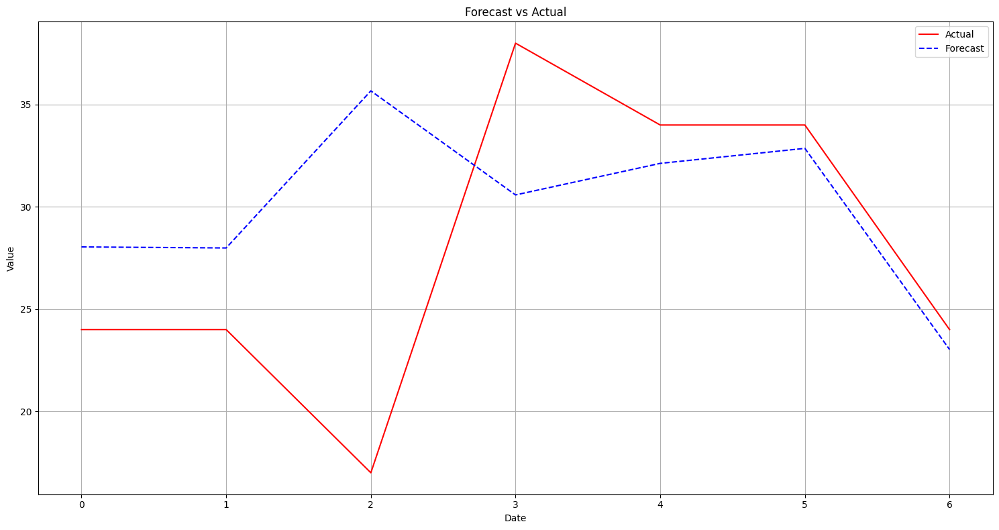

📊 Оценка прогноза:
MAE  = 7.85
RMSE = 10.01


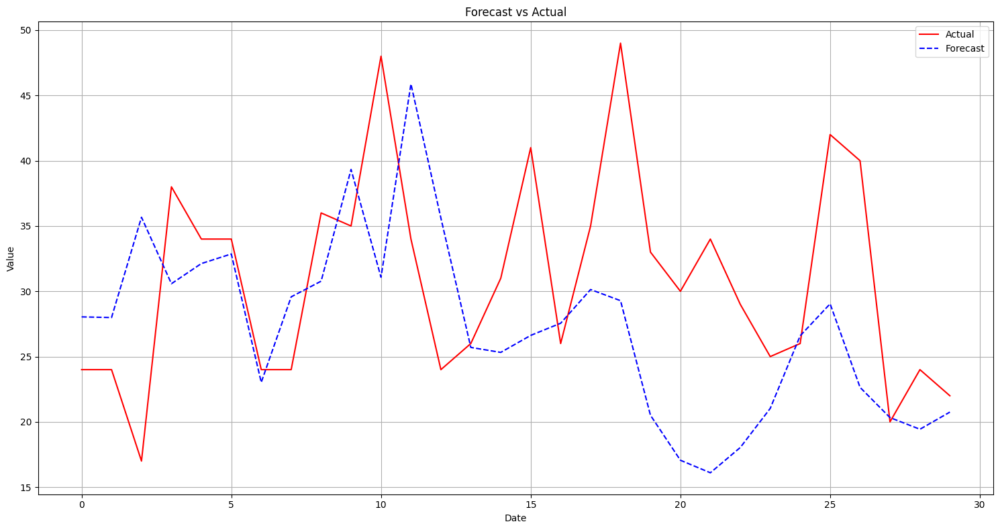

📊 Оценка прогноза:
MAE  = 7.09
RMSE = 9.11


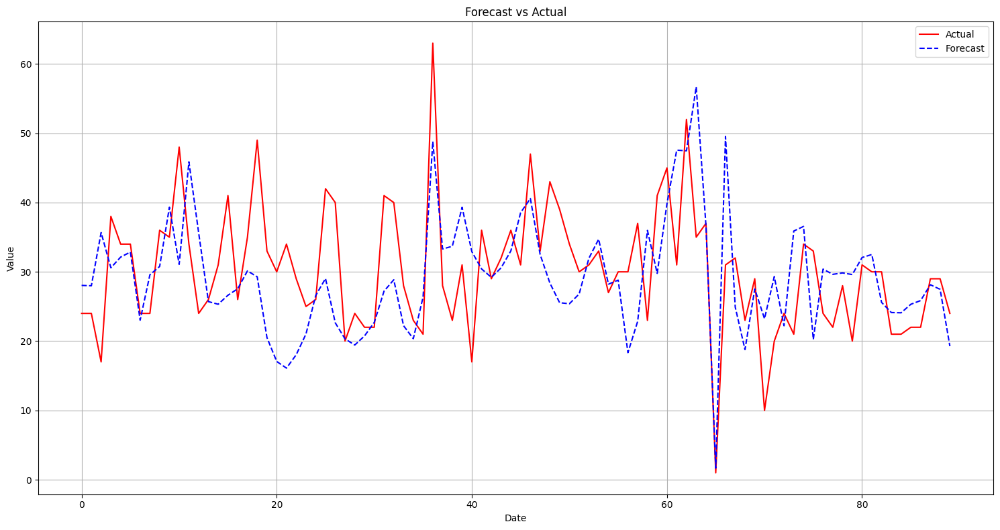

In [593]:

for period in [7,30,90]:
    pred = ts_toolkit.predict(steps=period)
    restored_pred = ts_toolkit.inverse_yeojohnson(pred)

    test_values = df_test['cnt'].iloc[:period]
    MAIN_RESULTS[STORE]['prophet'][f'res_{period}'] = ts_toolkit.evaluate_forecast(list(test_values), list(restored_pred), plot=True )
    MAIN_RESULTS[STORE]['prophet'][f'pred_{period}'] = restored_pred


### BOOSTING_MODEL


In [594]:
ts_toolkit = TimeSeriesForecastingToolkit(df_train, period= 7, year=2015, date_col='date', event_cols=['event_name_1', 'event_name_2'])
ts_toolkit.yeojohnson_transform('cnt')

In [595]:
exog_vars = [ 'lag_1', 'lag_7', 'lag_30', 'lag_90', 'is_christmas' ,'sell_price', 'wday', 'month', 'has_event']

In [596]:
# exog = ts_toolkit.df[exog_vars]
# exog = exog.astype(float)

# ts_toolkit.fit(
#     'yeojohnson_cnt', 
#     model_type='boosting', 
#     exog=exog,
# )
# ts_toolkit.save_model(path=MAIN_RESULTS[STORE]['boosting']['model_path'])

In [597]:
restored_model = ts_toolkit.load_model(MAIN_RESULTS[STORE]['boosting']['model_path'], model_type='boosting')
MAIN_RESULTS[STORE]['boosting'][f'resids'], MAIN_RESULTS[STORE]['boosting']['pvals'] = ts_toolkit.check_residuals()

t-тест Стьюдента на равенство 0: t-статистика = 0.000, p-значение = 1.0000
✅ Среднее значение остатков не отличается от 0
Критерий Вилкоксона: статистика = 20939.000, p-значение = 0.7553
✅ Медиана остатков не отличается от 0
Тест Жарка-Бера: статистика = 1.42, p-значение = 0.4922
✅ Остатки распределены нормально
Тест Льюнга-Бокса (lags=40): статистика = 45.08, p-значение = 0.2678
✅ Остатки не автокоррелированы
Тест Бройша-Пагана: статистика = 0.83, p-значение = 0.3615
✅ Гомоскедастичность (гетероскедастичность не обнаружена)


In [598]:
for period in [7,30,90]:
    
    exog_forecast = df_test[exog_vars].iloc[:period]

    pred = ts_toolkit.predict(steps=period, exog = exog_forecast)
    restored_pred = ts_toolkit.inverse_yeojohnson(pred)

    test_values = df_test['cnt'].iloc[:period]
    MAIN_RESULTS[STORE]['boosting'][f'res_{period}'] = ts_toolkit.evaluate_forecast(list(test_values), list(restored_pred))
    MAIN_RESULTS[STORE]['boosting'][f'pred_{period}'] = restored_pred

📊 Оценка прогноза:
MAE  = 5.91
RMSE = 6.97
📊 Оценка прогноза:
MAE  = 5.67
RMSE = 6.93
📊 Оценка прогноза:
MAE  = 6.82
RMSE = 9.16


## STORE_2_587

In [599]:
STORE = 'STORE_2_587'
MAIN_RESULTS[STORE] = {}
MAIN_RESULTS[STORE]['ets'] = {}
MAIN_RESULTS[STORE]['ets']['model_path'] = f'models/ets/model_{STORE}.pkl'
MAIN_RESULTS[STORE]['sarima'] = {}
MAIN_RESULTS[STORE]['sarima']['model_path'] = f'models/sarima/model_{STORE}.pkl'
MAIN_RESULTS[STORE]['prophet'] = {}
MAIN_RESULTS[STORE]['prophet']['model_path'] = f'models/prophet/model_{STORE}.pkl'
MAIN_RESULTS[STORE]['boosting'] = {}
MAIN_RESULTS[STORE]['boosting']['model_path'] = f'models/boosting/model_{STORE}.pkl'

In [600]:
df_train = train[train['item_id']==STORE]
df_train = df_train.sort_values('date_id')

In [601]:
df_test = test[test['item_id']==STORE]
df_test = df_test.sort_values('date_id')

In [602]:
ts_toolkit = TimeSeriesForecastingToolkit(df_train, period= 30, date_col='date', event_cols=['event_name_1', 'event_name_2'])
ts_toolkit.yeojohnson_transform('cnt')

### EDA

In [603]:
# ts_toolkit.analyze(col='cnt',)

In [604]:
ts_toolkit.stationarity_tests(d=1, col='yeojohnson_cnt', period=7)

=== Стационарность: d=1, D=0 ===

=== KPSS Test ===
Statistic: 0.15147185613666653, p-value: 0.1
✅ Стационарен

=== ADF Test ===
Statistic: -10.686601063638408, p-value: 3.8191001357410163e-19
✅ Стационарен


### ETS MODEL

In [605]:
# ts_toolkit.fit('yeojohnson_cnt', model_type='ets', auto_fit_mode=True, verbose=False)
# ts_toolkit.save_model(path=MAIN_RESULTS[STORE]['ets']['model_path'])

In [606]:
restored_model = ts_toolkit.load_model(MAIN_RESULTS[STORE]['ets']['model_path'], model_type='ets')
MAIN_RESULTS[STORE]['ets'][f'resids'], MAIN_RESULTS[STORE]['ets'][f'pvals'] = ts_toolkit.check_residuals()

t-тест Стьюдента на равенство 0: t-статистика = -0.355, p-значение = 0.7225
✅ Среднее значение остатков не отличается от 0
Критерий Вилкоксона: статистика = 740370.000, p-значение = 0.8156
✅ Медиана остатков не отличается от 0
Тест Жарка-Бера: статистика = 1905.79, p-значение = 0.0000
❌ Остатки не распределены нормально
Тест Льюнга-Бокса (lags=40): статистика = 74.73, p-значение = 0.0007
❌ Остатки автокоррелированы
Тест Бройша-Пагана: статистика = 12.12, p-значение = 0.0005
❌ Есть гетероскедастичность


In [607]:
for period in [7,30,90]:
    pred = ts_toolkit.predict(steps=period)
    restored_pred = ts_toolkit.inverse_yeojohnson(pred)
    test_30 = df_test[['cnt']].iloc[:period]['cnt']
    MAIN_RESULTS[STORE]['ets'][f'res_{period}'] = ts_toolkit.evaluate_forecast(list(test_30), list(restored_pred))
    MAIN_RESULTS[STORE]['ets'][f'pred_{period}'] = restored_pred

📊 Оценка прогноза:
MAE  = 12.73
RMSE = 13.15
📊 Оценка прогноза:
MAE  = 18.63
RMSE = 20.82
📊 Оценка прогноза:
MAE  = 17.09
RMSE = 19.10


### SARIMA MODEL

In [608]:
ts_toolkit = TimeSeriesForecastingToolkit(df_train, period= 30, year= 2014, date_col='date', event_cols=['event_name_1', 'event_name_2'])
ts_toolkit.yeojohnson_transform('cnt')

exog_vars = [ 'wday', 'has_event', 'is_christmas']
exog = ts_toolkit.df[exog_vars]
exog = exog.astype(float)
exog = exog.replace([np.inf, -np.inf], np.nan)
exog = exog.interpolate(method='linear')
exog = exog.fillna(exog.mean())

In [609]:
# ts_toolkit.fit('yeojohnson_cnt', model_type='sarimax', exog = exog,  order=(2,1,3), seasonal_order=(1,0,1,7))
# ts_toolkit.save_model(path=MAIN_RESULTS[STORE]['sarima']['model_path'])

In [610]:
restored_model = ts_toolkit.load_model(MAIN_RESULTS[STORE]['sarima']['model_path'], model_type='sarimax')
MAIN_RESULTS[STORE]['sarima'][f'resids'],MAIN_RESULTS[STORE]['sarima'][f'pvals'] = ts_toolkit.check_residuals()

t-тест Стьюдента на равенство 0: t-статистика = 1.094, p-значение = 0.2743
✅ Среднее значение остатков не отличается от 0
Критерий Вилкоксона: статистика = 106027.000, p-значение = 0.6737
✅ Медиана остатков не отличается от 0
Тест Жарка-Бера: статистика = 271.98, p-значение = 0.0000
❌ Остатки не распределены нормально
Тест Льюнга-Бокса (lags=40): статистика = 42.33, p-значение = 0.3706
✅ Остатки не автокоррелированы
Тест Бройша-Пагана: статистика = 1.67, p-значение = 0.1962
✅ Гомоскедастичность (гетероскедастичность не обнаружена)


In [611]:
for period in [7,30,90]:
    exog_forecast = df_test[exog_vars].iloc[:period]
    exog_forecast = exog_forecast.astype(float)
    pred = ts_toolkit.predict(steps=period, exog=exog_forecast)
    restored_pred = ts_toolkit.inverse_yeojohnson(pred)
    test_30 = df_test[['cnt']].iloc[:period]['cnt']
    MAIN_RESULTS[STORE]['sarima'][f'res_{period}'] = ts_toolkit.evaluate_forecast(list(test_30), list(restored_pred))
    MAIN_RESULTS[STORE]['sarima'][f'pred_{period}'] = restored_pred


📊 Оценка прогноза:
MAE  = 8.30
RMSE = 9.58
📊 Оценка прогноза:
MAE  = 10.30
RMSE = 12.14
📊 Оценка прогноза:
MAE  = 7.50
RMSE = 9.68


### PROPHET MODEL

In [612]:
ts_toolkit = TimeSeriesForecastingToolkit(df_train, period= 30, date_col='date', event_cols=['event_name_1', 'event_name_2'])
ts_toolkit.yeojohnson_transform('cnt')

In [613]:
# custom_seasons = [
#    {'name': 'month', 'period': 30, 'fourier_order': 20}
# ]

# ts_toolkit.fit(
#     'yeojohnson_cnt', 
#     model_type='prophet', 
#     seasonality_mode='multiplicative',
#     weekly_seasonality = True,
#     holidays = significant_holidays_df,
#     changepoint_prior_scale = 0.3,
#     custom_seasonalities=custom_seasons,
# )
# ts_toolkit.save_model(path=MAIN_RESULTS[STORE]['prophet']['model_path'])

In [614]:
restored_model = ts_toolkit.load_model(MAIN_RESULTS[STORE]['prophet']['model_path'], model_type='prophet')
MAIN_RESULTS[STORE]['prophet'][f'resids'], MAIN_RESULTS[STORE]['prophet'][f'pvals'] = ts_toolkit.check_residuals()

t-тест Стьюдента на равенство 0: t-статистика = -0.201, p-значение = 0.8409
✅ Среднее значение остатков не отличается от 0
Критерий Вилкоксона: статистика = 737321.000, p-значение = 0.7036
✅ Медиана остатков не отличается от 0
Тест Жарка-Бера: статистика = 513.99, p-значение = 0.0000
❌ Остатки не распределены нормально
Тест Льюнга-Бокса (lags=40): статистика = 3890.46, p-значение = 0.0000
❌ Остатки автокоррелированы
Тест Бройша-Пагана: статистика = 3.65, p-значение = 0.0561
✅ Гомоскедастичность (гетероскедастичность не обнаружена)


In [615]:

for period in [7,30,90]:
    pred = ts_toolkit.predict(steps=period)
    restored_pred = ts_toolkit.inverse_yeojohnson(pred)

    test_values = df_test['cnt'].iloc[:period]
    MAIN_RESULTS[STORE]['prophet'][f'res_{period}'] = ts_toolkit.evaluate_forecast(list(test_values), list(restored_pred))
    MAIN_RESULTS[STORE]['prophet'][f'pred_{period}'] = restored_pred


📊 Оценка прогноза:
MAE  = 4.42
RMSE = 5.64
📊 Оценка прогноза:
MAE  = 11.41
RMSE = 13.51
📊 Оценка прогноза:
MAE  = 11.45
RMSE = 14.06


### BOOSTING_MODEL


In [616]:
ts_toolkit = TimeSeriesForecastingToolkit(df_train, period= 30, date_col='date', year =2014, event_cols=['event_name_1', 'event_name_2'])
ts_toolkit.yeojohnson_transform('cnt')

exog_vars = [ 'lag_1', 'lag_7', 'lag_30', 'lag_90', 'is_christmas','sell_price', 'wday', 'month', 'has_event']

In [617]:
# exog = ts_toolkit.df[exog_vars]
# exog = exog.astype(float)

# ts_toolkit.fit(
#     'yeojohnson_cnt', 
#     model_type='boosting', 
#     exog=exog,
# )
# ts_toolkit.save_model(path=MAIN_RESULTS[STORE]['boosting']['model_path'])
# ts_toolkit.check_residuals(plot=True)

In [618]:
restored_model = ts_toolkit.load_model(MAIN_RESULTS[STORE]['boosting']['model_path'], model_type='boosting')
MAIN_RESULTS[STORE]['boosting'][f'resids'], MAIN_RESULTS[STORE]['boosting']['pvals'] = ts_toolkit.check_residuals()

t-тест Стьюдента на равенство 0: t-статистика = -0.000, p-значение = 1.0000
✅ Среднее значение остатков не отличается от 0
Критерий Вилкоксона: статистика = 104844.000, p-значение = 0.5066
✅ Медиана остатков не отличается от 0
Тест Жарка-Бера: статистика = 472.95, p-значение = 0.0000
❌ Остатки не распределены нормально
Тест Льюнга-Бокса (lags=40): статистика = 34.80, p-значение = 0.7030
✅ Остатки не автокоррелированы
Тест Бройша-Пагана: статистика = 1.11, p-значение = 0.2930
✅ Гомоскедастичность (гетероскедастичность не обнаружена)


In [619]:
for period in [7,30,90]:
    
    exog_forecast = df_test[exog_vars].iloc[:period]

    pred = ts_toolkit.predict(steps=period, exog = exog_forecast)
    restored_pred = ts_toolkit.inverse_yeojohnson(pred)

    test_values = df_test['cnt'].iloc[:period]
    MAIN_RESULTS[STORE]['boosting'][f'res_{period}'] = ts_toolkit.evaluate_forecast(list(test_values), list(restored_pred))
    MAIN_RESULTS[STORE]['boosting'][f'pred_{period}'] = restored_pred

📊 Оценка прогноза:
MAE  = 3.67
RMSE = 4.11
📊 Оценка прогноза:
MAE  = 8.59
RMSE = 10.88
📊 Оценка прогноза:
MAE  = 8.28
RMSE = 10.42


## STORE_2_681

In [620]:
STORE = 'STORE_2_681'
MAIN_RESULTS[STORE] = {}
MAIN_RESULTS[STORE]['ets'] = {}
MAIN_RESULTS[STORE]['ets']['model_path'] = f'models/ets/model_{STORE}.pkl'
MAIN_RESULTS[STORE]['sarima'] = {}
MAIN_RESULTS[STORE]['sarima']['model_path'] = f'models/sarima/model_{STORE}.pkl'
MAIN_RESULTS[STORE]['prophet'] = {}
MAIN_RESULTS[STORE]['prophet']['model_path'] = f'models/prophet/model_{STORE}.pkl'
MAIN_RESULTS[STORE]['boosting'] = {}
MAIN_RESULTS[STORE]['boosting']['model_path'] = f'models/boosting/model_{STORE}.pkl'

In [621]:
Fdf_train = train[train['item_id']==STORE]
df_train = df_train.sort_values('date_id')

In [622]:
df_test = test[test['item_id']==STORE]
df_test = df_test.sort_values('date_id')

In [623]:
ts_toolkit = TimeSeriesForecastingToolkit(df_train, period= 30, date_col='date', event_cols=['event_name_1', 'event_name_2'])
ts_toolkit.remove_outliers()
ts_toolkit.replace_outlier_streaks_with_rolling_mean('cnt',zero_streak=5, lower_bound=3, padding=2, window=60)
ts_toolkit.yeojohnson_transform('cnt')

### EDA

In [624]:
# ts_toolkit.analyze(col='cnt',)

In [625]:
ts_toolkit.stationarity_tests(D=1, col='yeojohnson_cnt', period=7)

=== Стационарность: d=0, D=1, period=7 ===

=== KPSS Test ===
Statistic: 0.018688425861042725, p-value: 0.1
✅ Стационарен

=== ADF Test ===
Statistic: -9.462011428715348, p-value: 4.328488400442777e-16
✅ Стационарен


### ETS MODEL

In [626]:
# ts_toolkit.fit('yeojohnson_cnt', model_type='ets', auto_fit_mode=True, verbose=False)
# ts_toolkit.save_model(path=MAIN_RESULTS[STORE]['ets']['model_path'])

In [627]:
restored_model = ts_toolkit.load_model(MAIN_RESULTS[STORE]['ets']['model_path'], model_type='ets')
MAIN_RESULTS[STORE]['ets'][f'resids'], MAIN_RESULTS[STORE]['ets'][f'pvals'] = ts_toolkit.check_residuals()

t-тест Стьюдента на равенство 0: t-статистика = 0.414, p-значение = 0.6789
✅ Среднее значение остатков не отличается от 0
Критерий Вилкоксона: статистика = 705694.000, p-значение = 0.0564
✅ Медиана остатков не отличается от 0
Тест Жарка-Бера: статистика = 476.96, p-значение = 0.0000
❌ Остатки не распределены нормально
Тест Льюнга-Бокса (lags=40): статистика = 166.34, p-значение = 0.0000
❌ Остатки автокоррелированы
Тест Бройша-Пагана: статистика = 0.68, p-значение = 0.4081
✅ Гомоскедастичность (гетероскедастичность не обнаружена)


In [628]:
for period in [7,30,90]:
    pred = ts_toolkit.predict(steps=period)
    restored_pred = ts_toolkit.inverse_yeojohnson(pred)
    test_30 = df_test[['cnt']].iloc[:period]['cnt']
    MAIN_RESULTS[STORE]['ets'][f'res_{period}'] = ts_toolkit.evaluate_forecast(list(test_30), list(restored_pred))
    MAIN_RESULTS[STORE]['ets'][f'pred_{period}'] = restored_pred

📊 Оценка прогноза:
MAE  = 22.07
RMSE = 24.43
📊 Оценка прогноза:
MAE  = 25.15
RMSE = 29.20
📊 Оценка прогноза:
MAE  = 34.54
RMSE = 37.93


### SARIMA MODEL

In [629]:
exog_vars = ['sell_price', 'wday', 'month', 'has_event']
exog = ts_toolkit.df[exog_vars]
exog = exog.astype(float)
exog = exog.replace([np.inf, -np.inf], np.nan)
exog = exog.interpolate(method='linear')
exog = exog.fillna(exog.mean())

In [630]:
# ts_toolkit.fit('yeojohnson_cnt', model_type='sarimax', exog = exog,  order=(3,0,3), seasonal_order=(0,1,1,7))
# ts_toolkit.save_model(path=MAIN_RESULTS[STORE]['sarima']['model_path'])

In [631]:
restored_model = ts_toolkit.load_model(MAIN_RESULTS[STORE]['sarima']['model_path'], model_type='sarimax')
MAIN_RESULTS[STORE]['sarima'][f'resids'],MAIN_RESULTS[STORE]['sarima'][f'pvals'] = ts_toolkit.check_residuals()

t-тест Стьюдента на равенство 0: t-статистика = 1.597, p-значение = 0.1104
✅ Среднее значение остатков не отличается от 0
Критерий Вилкоксона: статистика = 686777.000, p-значение = 0.0048
❌ Медиана остатков статистически отличается от 0
Тест Жарка-Бера: статистика = 355.92, p-значение = 0.0000
❌ Остатки не распределены нормально
Тест Льюнга-Бокса (lags=40): статистика = 49.25, p-значение = 0.1498
✅ Остатки не автокоррелированы
Тест Бройша-Пагана: статистика = 2.85, p-значение = 0.0914
✅ Гомоскедастичность (гетероскедастичность не обнаружена)


In [632]:
for period in [7,30,90]:
    exog_forecast = df_test[exog_vars].iloc[:period]
    exog_forecast = exog_forecast.astype(float)
    pred = ts_toolkit.predict(steps=period, exog=exog_forecast)
    restored_pred = ts_toolkit.inverse_yeojohnson(pred)
    test_30 = df_test[['cnt']].iloc[:period]['cnt']
    MAIN_RESULTS[STORE]['sarima'][f'res_{period}'] = ts_toolkit.evaluate_forecast(list(test_30), list(restored_pred))
    MAIN_RESULTS[STORE]['sarima'][f'pred_{period}'] = restored_pred


📊 Оценка прогноза:
MAE  = 29.95
RMSE = 33.54
📊 Оценка прогноза:
MAE  = 20.96
RMSE = 25.16
📊 Оценка прогноза:
MAE  = 19.06
RMSE = 23.73


### PROPHET MODEL

In [633]:
# custom_seasons = [
#    {'name': 'quartal', 'period': 180, 'fourier_order': 20}
# ]

# ts_toolkit.fit(
#     'yeojohnson_cnt', 
#     model_type='prophet', 
#     seasonality_mode='multiplicative',
#     yearly_seasonality = True, 
#     changepoint_prior_scale = 0.3,
#     custom_seasonalities=custom_seasons,
# )
# ts_toolkit.save_model(path=MAIN_RESULTS[STORE]['prophet']['model_path'])

In [634]:
restored_model = ts_toolkit.load_model(MAIN_RESULTS[STORE]['prophet']['model_path'], model_type='prophet')
MAIN_RESULTS[STORE]['prophet'][f'resids'], MAIN_RESULTS[STORE]['prophet'][f'pvals'] = ts_toolkit.check_residuals()

t-тест Стьюдента на равенство 0: t-статистика = -0.033, p-значение = 0.9739
✅ Среднее значение остатков не отличается от 0
Критерий Вилкоксона: статистика = 734394.000, p-значение = 0.6018
✅ Медиана остатков не отличается от 0
Тест Жарка-Бера: статистика = 51.57, p-значение = 0.0000
❌ Остатки не распределены нормально
Тест Льюнга-Бокса (lags=40): статистика = 1253.52, p-значение = 0.0000
❌ Остатки автокоррелированы
Тест Бройша-Пагана: статистика = 3.01, p-значение = 0.0830
✅ Гомоскедастичность (гетероскедастичность не обнаружена)


In [635]:

for period in [7,30,90]:
    pred = ts_toolkit.predict(steps=period)
    restored_pred = ts_toolkit.inverse_yeojohnson(pred)

    test_values = df_test['cnt'].iloc[:period]
    MAIN_RESULTS[STORE]['prophet'][f'res_{period}'] = ts_toolkit.evaluate_forecast(list(test_values), list(restored_pred))
    MAIN_RESULTS[STORE]['prophet'][f'pred_{period}'] = restored_pred


📊 Оценка прогноза:
MAE  = 30.51
RMSE = 34.90
📊 Оценка прогноза:
MAE  = 19.13
RMSE = 24.08
📊 Оценка прогноза:
MAE  = 15.97
RMSE = 23.11


### BOOSTING_MODEL


In [636]:
exog_vars = [ 'lag_1', 'lag_7', 'lag_30', 'lag_90', 'sell_price', 'wday', 'month', 'has_event']

In [637]:
# exog = ts_toolkit.df[exog_vars]
# exog = exog.astype(float)

# ts_toolkit.fit(
#     'yeojohnson_cnt', 
#     model_type='boosting', 
#     exog=exog,
# )
# ts_toolkit.save_model(path=MAIN_RESULTS[STORE]['boosting']['model_path'])

In [638]:
restored_model = ts_toolkit.load_model(MAIN_RESULTS[STORE]['boosting']['model_path'], model_type='boosting')
MAIN_RESULTS[STORE]['boosting'][f'resids'], MAIN_RESULTS[STORE]['boosting']['pvals'] = ts_toolkit.check_residuals()

t-тест Стьюдента на равенство 0: t-статистика = 0.000, p-значение = 1.0000
✅ Среднее значение остатков не отличается от 0
Критерий Вилкоксона: статистика = 720300.000, p-значение = 0.2292
✅ Медиана остатков не отличается от 0
Тест Жарка-Бера: статистика = 177.36, p-значение = 0.0000
❌ Остатки не распределены нормально
Тест Льюнга-Бокса (lags=40): статистика = 43.59, p-значение = 0.3213
✅ Остатки не автокоррелированы
Тест Бройша-Пагана: статистика = 2.30, p-значение = 0.1293
✅ Гомоскедастичность (гетероскедастичность не обнаружена)


In [639]:
for period in [7,30,90]:
    
    exog_forecast = df_test[exog_vars].iloc[:period]

    pred = ts_toolkit.predict(steps=period, exog = exog_forecast)
    restored_pred = ts_toolkit.inverse_yeojohnson(pred)

    test_values = df_test['cnt'].iloc[:period]
    MAIN_RESULTS[STORE]['boosting'][f'res_{period}'] = ts_toolkit.evaluate_forecast(list(test_values), list(restored_pred))
    MAIN_RESULTS[STORE]['boosting'][f'pred_{period}'] = restored_pred

📊 Оценка прогноза:
MAE  = 36.08
RMSE = 39.86
📊 Оценка прогноза:
MAE  = 20.69
RMSE = 26.54
📊 Оценка прогноза:
MAE  = 14.90
RMSE = 20.33


## STORE_2_714

In [640]:
STORE = 'STORE_2_714'
MAIN_RESULTS[STORE] = {}
MAIN_RESULTS[STORE]['ets'] = {}
MAIN_RESULTS[STORE]['ets']['model_path'] = f'models/ets/model_{STORE}.pkl'
MAIN_RESULTS[STORE]['sarima'] = {}
MAIN_RESULTS[STORE]['sarima']['model_path'] = f'models/sarima/model_{STORE}.pkl'
MAIN_RESULTS[STORE]['prophet'] = {}
MAIN_RESULTS[STORE]['prophet']['model_path'] = f'models/prophet/model_{STORE}.pkl'
MAIN_RESULTS[STORE]['boosting'] = {}
MAIN_RESULTS[STORE]['boosting']['model_path'] = f'models/boosting/model_{STORE}.pkl'

In [641]:
df_train = train[train['item_id']==STORE]
df_train = df_train.sort_values('date_id')

In [642]:
df_test = test[test['item_id']==STORE]

df_test = df_test.sort_values('date_id')

In [643]:
ts_toolkit = TimeSeriesForecastingToolkit(df_train, year=2014, period= 30, date_col='date', event_cols=['event_name_1', 'event_name_2'])
ts_toolkit.yeojohnson_transform('cnt')

### EDA

In [644]:
# ts_toolkit.analyze(col='cnt',period=30)

In [645]:
ts_toolkit.stationarity_tests(d=1, col='yeojohnson_cnt', period=30)

=== Стационарность: d=1, D=0 ===

=== KPSS Test ===
Statistic: 0.2007341202301902, p-value: 0.1
✅ Стационарен

=== ADF Test ===
Statistic: -9.285073669655077, p-value: 1.2216603245896698e-15
✅ Стационарен


### ETS MODEL

In [646]:
# ts_toolkit.fit('yeojohnson_cnt', model_type='ets', auto_fit_mode=True, verbose=False)
# ts_toolkit.save_model(path=MAIN_RESULTS[STORE]['ets']['model_path'])

In [647]:
restored_model = ts_toolkit.load_model(MAIN_RESULTS[STORE]['ets']['model_path'], model_type='ets')
MAIN_RESULTS[STORE]['ets'][f'resids'], MAIN_RESULTS[STORE]['ets'][f'pvals'] = ts_toolkit.check_residuals()

t-тест Стьюдента на равенство 0: t-статистика = 0.217, p-значение = 0.8281
✅ Среднее значение остатков не отличается от 0
Критерий Вилкоксона: статистика = 106876.000, p-значение = 0.8052
✅ Медиана остатков не отличается от 0
Тест Жарка-Бера: статистика = 32.02, p-значение = 0.0000
❌ Остатки не распределены нормально
Тест Льюнга-Бокса (lags=40): статистика = 96.67, p-значение = 0.0000
❌ Остатки автокоррелированы
Тест Бройша-Пагана: статистика = 1.13, p-значение = 0.2888
✅ Гомоскедастичность (гетероскедастичность не обнаружена)


In [648]:
for period in [7,30,90]:
    pred = ts_toolkit.predict(steps=period)
    restored_pred = ts_toolkit.inverse_yeojohnson(pred)
    test_30 = df_test[['cnt']].iloc[:period]['cnt']
    MAIN_RESULTS[STORE]['ets'][f'res_{period}'] = ts_toolkit.evaluate_forecast(list(test_30), list(restored_pred))
    MAIN_RESULTS[STORE]['ets'][f'pred_{period}'] = restored_pred

📊 Оценка прогноза:
MAE  = 4.43
RMSE = 5.96
📊 Оценка прогноза:
MAE  = 5.86
RMSE = 8.10
📊 Оценка прогноза:
MAE  = 8.25
RMSE = 10.15


### SARIMA MODEL

In [649]:
exog_vars = ['sell_price', 'wday', 'month', 'is_christmas', 'has_event']
exog = ts_toolkit.df[exog_vars]
exog = exog.astype(float)
exog = exog.replace([np.inf, -np.inf], np.nan)
exog = exog.interpolate(method='linear')
exog = exog.fillna(exog.mean())

In [650]:
# ts_toolkit.fit('yeojohnson_cnt', model_type='sarimax', order=(5,1,1), exog=exog, seasonal_order=(0,0,0,0))
# ts_toolkit.save_model(path=MAIN_RESULTS[STORE]['sarima']['model_path'])

In [651]:
restored_model = ts_toolkit.load_model(MAIN_RESULTS[STORE]['sarima']['model_path'], model_type='sarimax')
MAIN_RESULTS[STORE]['sarima'][f'resids'],MAIN_RESULTS[STORE]['sarima'][f'pvals'] = ts_toolkit.check_residuals()

t-тест Стьюдента на равенство 0: t-статистика = -0.888, p-значение = 0.3750
✅ Среднее значение остатков не отличается от 0
Критерий Вилкоксона: статистика = 106472.000, p-значение = 0.7416
✅ Медиана остатков не отличается от 0
Тест Жарка-Бера: статистика = 824181.31, p-значение = 0.0000
❌ Остатки не распределены нормально
Тест Льюнга-Бокса (lags=40): статистика = 41.40, p-значение = 0.4093
✅ Остатки не автокоррелированы
Тест Бройша-Пагана: статистика = 3.10, p-значение = 0.0784
✅ Гомоскедастичность (гетероскедастичность не обнаружена)


In [652]:
for period in [7,30,90]:
    exog_forecast = df_test[exog_vars].iloc[:period]
    exog_forecast = exog_forecast.astype(float)
    pred = ts_toolkit.predict(steps=period, exog=exog_forecast)
    restored_pred = ts_toolkit.inverse_yeojohnson(pred)
    test_30 = df_test[['cnt']].iloc[:period]['cnt']
    MAIN_RESULTS[STORE]['sarima'][f'res_{period}'] = ts_toolkit.evaluate_forecast(list(test_30), list(restored_pred))
    MAIN_RESULTS[STORE]['sarima'][f'pred_{period}'] = restored_pred


📊 Оценка прогноза:
MAE  = 7.32
RMSE = 9.20
📊 Оценка прогноза:
MAE  = 7.48
RMSE = 9.50
📊 Оценка прогноза:
MAE  = 8.69
RMSE = 10.49


### PROPHET MODEL

In [653]:
ts_toolkit = TimeSeriesForecastingToolkit(df_train, period= 30, year=2012, date_col='date', event_cols=['event_name_1', 'event_name_2'])
ts_toolkit.yeojohnson_transform('cnt')

In [654]:

# custom_seasons = [
#     {'name': 'quarterly', 'period': 180, 'fourier_order': 10}
# ]

# ts_toolkit.fit(
#     'yeojohnson_cnt', 
#     model_type='prophet', 
#     seasonality_mode='multiplicative',
#     weekly_seasonality = True,
#     yearly_seasonality = True,
#     changepoint_prior_scale = 0.01,
#     holidays = significant_holidays_df,
# )
# ts_toolkit.save_model(path=MAIN_RESULTS[STORE]['prophet']['model_path'])
# ts_toolkit.check_residuals(plot=True)

In [655]:
restored_model = ts_toolkit.load_model(MAIN_RESULTS[STORE]['prophet']['model_path'], model_type='prophet')
MAIN_RESULTS[STORE]['prophet'][f'resids'], MAIN_RESULTS[STORE]['prophet'][f'pvals'] = ts_toolkit.check_residuals()

t-тест Стьюдента на равенство 0: t-статистика = 0.049, p-значение = 0.9607
✅ Среднее значение остатков не отличается от 0
Критерий Вилкоксона: статистика = 480562.000, p-значение = 0.9242
✅ Медиана остатков не отличается от 0
Тест Жарка-Бера: статистика = 46.58, p-значение = 0.0000
❌ Остатки не распределены нормально
Тест Льюнга-Бокса (lags=40): статистика = 371.58, p-значение = 0.0000
❌ Остатки автокоррелированы
Тест Бройша-Пагана: статистика = 0.18, p-значение = 0.6694
✅ Гомоскедастичность (гетероскедастичность не обнаружена)


In [656]:

for period in [7,30,90]:
    pred = ts_toolkit.predict(steps=period)
    restored_pred = ts_toolkit.inverse_yeojohnson(pred)

    test_values = df_test['cnt'].iloc[:period]
    MAIN_RESULTS[STORE]['prophet'][f'res_{period}'] = ts_toolkit.evaluate_forecast(list(test_values), list(restored_pred))
    MAIN_RESULTS[STORE]['prophet'][f'pred_{period}'] = restored_pred


📊 Оценка прогноза:
MAE  = 7.81
RMSE = 8.08
📊 Оценка прогноза:
MAE  = 6.28
RMSE = 7.99
📊 Оценка прогноза:
MAE  = 6.23
RMSE = 8.35


### BOOSTING_MODEL


In [657]:
exog_vars = [ 'lag_1', 'lag_7', 'lag_30', 'lag_90', 'is_christmas', 'wday', 'month', 'has_event']

In [658]:
# exog = ts_toolkit.df[exog_vars]
# exog = exog.astype(float)

# ts_toolkit.fit(
#     'yeojohnson_cnt', 
#     model_type='boosting', 
#     exog=exog,
# )

# ts_toolkit.save_model(path=MAIN_RESULTS[STORE]['boosting']['model_path'])

In [659]:
restored_model = ts_toolkit.load_model(MAIN_RESULTS[STORE]['boosting']['model_path'], model_type='boosting')
MAIN_RESULTS[STORE]['boosting'][f'resids'], MAIN_RESULTS[STORE]['boosting']['pvals'] = ts_toolkit.check_residuals()

t-тест Стьюдента на равенство 0: t-статистика = 0.000, p-значение = 1.0000
✅ Среднее значение остатков не отличается от 0
Критерий Вилкоксона: статистика = 480970.000, p-значение = 0.9459
✅ Медиана остатков не отличается от 0
Тест Жарка-Бера: статистика = 161.87, p-значение = 0.0000
❌ Остатки не распределены нормально
Тест Льюнга-Бокса (lags=40): статистика = 52.05, p-значение = 0.0961
✅ Остатки не автокоррелированы
Тест Бройша-Пагана: статистика = 1.20, p-значение = 0.2740
✅ Гомоскедастичность (гетероскедастичность не обнаружена)


In [660]:
for period in [7,30,90]:
    
    exog_forecast = df_test[exog_vars].iloc[:period]

    pred = ts_toolkit.predict(steps=period, exog = exog_forecast)
    restored_pred = ts_toolkit.inverse_yeojohnson(pred)

    test_values = df_test['cnt'].iloc[:period]
    MAIN_RESULTS[STORE]['boosting'][f'res_{period}'] = ts_toolkit.evaluate_forecast(list(test_values), list(restored_pred))
    MAIN_RESULTS[STORE]['boosting'][f'pred_{period}'] = restored_pred

📊 Оценка прогноза:
MAE  = 6.52
RMSE = 8.29
📊 Оценка прогноза:
MAE  = 6.00
RMSE = 7.99
📊 Оценка прогноза:
MAE  = 5.26
RMSE = 6.91


## STORE_2_716

In [661]:
STORE = 'STORE_2_716'
MAIN_RESULTS[STORE] = {}
MAIN_RESULTS[STORE]['ets'] = {}
MAIN_RESULTS[STORE]['ets']['model_path'] = f'models/ets/model_{STORE}.pkl'
MAIN_RESULTS[STORE]['sarima'] = {}
MAIN_RESULTS[STORE]['sarima']['model_path'] = f'models/sarima/model_{STORE}.pkl'
MAIN_RESULTS[STORE]['prophet'] = {}
MAIN_RESULTS[STORE]['prophet']['model_path'] = f'models/prophet/model_{STORE}.pkl'
MAIN_RESULTS[STORE]['boosting'] = {}
MAIN_RESULTS[STORE]['boosting']['model_path'] = f'models/boosting/model_{STORE}.pkl'

In [662]:
df_train = train[train['item_id']==STORE]
df_train = df_train.sort_values('date_id')

In [663]:
df_test = test[test['item_id']==STORE]
df_test = df_test.sort_values('date_id')

In [664]:
ts_toolkit = TimeSeriesForecastingToolkit(df_train, period= 30, year=2014, date_col='date', event_cols=['event_name_1', 'event_name_2'])
ts_toolkit.yeojohnson_transform('cnt')
ts_toolkit.remove_outliers()

### EDA

In [665]:
# ts_toolkit.analyze(col='cnt',period=30)

In [666]:
ts_toolkit.stationarity_tests(d=1, col='cnt', period=30)

=== Стационарность: d=1, D=0 ===

=== KPSS Test ===
Statistic: 0.06694016525866026, p-value: 0.1
✅ Стационарен

=== ADF Test ===


Statistic: -11.816026676667365, p-value: 8.634175282546326e-22
✅ Стационарен


### ETS MODEL

In [667]:
ts_toolkit = TimeSeriesForecastingToolkit(df_train, period= 30, year=2014, date_col='date', event_cols=['event_name_1', 'event_name_2'])
ts_toolkit.yeojohnson_transform('cnt')

# ts_toolkit.fit('yeojohnson_cnt', model_type='ets', auto_fit_mode=True, verbose=False)
# ts_toolkit.save_model(path=MAIN_RESULTS[STORE]['ets']['model_path'])

In [668]:
restored_model = ts_toolkit.load_model(MAIN_RESULTS[STORE]['ets']['model_path'], model_type='ets')
MAIN_RESULTS[STORE]['ets'][f'resids'], MAIN_RESULTS[STORE]['ets'][f'pvals'] = ts_toolkit.check_residuals()

t-тест Стьюдента на равенство 0: t-статистика = -0.000, p-значение = 1.0000
✅ Среднее значение остатков не отличается от 0
Критерий Вилкоксона: статистика = 107097.000, p-значение = 0.8405
✅ Медиана остатков не отличается от 0
Тест Жарка-Бера: статистика = 34.69, p-значение = 0.0000
❌ Остатки не распределены нормально
Тест Льюнга-Бокса (lags=40): статистика = 42.50, p-значение = 0.3640
✅ Остатки не автокоррелированы
Тест Бройша-Пагана: статистика = 0.88, p-значение = 0.3472
✅ Гомоскедастичность (гетероскедастичность не обнаружена)


In [669]:
for period in [7,30,90]:
    pred = ts_toolkit.predict(steps=period)
    restored_pred = ts_toolkit.inverse_yeojohnson(pred)
    test_30 = df_test[['cnt']].iloc[:period]['cnt']
    MAIN_RESULTS[STORE]['ets'][f'res_{period}'] = ts_toolkit.evaluate_forecast(list(test_30), list(restored_pred))
    MAIN_RESULTS[STORE]['ets'][f'pred_{period}'] = restored_pred

📊 Оценка прогноза:
MAE  = 0.96
RMSE = 1.05
📊 Оценка прогноза:
MAE  = 1.25
RMSE = 1.89
📊 Оценка прогноза:
MAE  = 1.08
RMSE = 1.60


### SARIMA MODEL

In [670]:
exog_vars = ['wday', 'month',]
exog = ts_toolkit.df[exog_vars]
exog = exog.astype(float)
exog = exog.replace([np.inf, -np.inf], np.nan)
exog = exog.interpolate(method='linear')
exog = exog.fillna(exog.mean())

In [671]:
# ts_toolkit.fit('cnt', model_type='sarimax', order=(0,0,4), seasonal_order=(2,2,1,7))
# ts_toolkit.save_model(path=MAIN_RESULTS[STORE]['sarima']['model_path'])

In [672]:
restored_model = ts_toolkit.load_model(MAIN_RESULTS[STORE]['sarima']['model_path'], model_type='sarimax')
MAIN_RESULTS[STORE]['sarima'][f'resids'],MAIN_RESULTS[STORE]['sarima'][f'pvals'] = ts_toolkit.check_residuals()

t-тест Стьюдента на равенство 0: t-статистика = 0.986, p-значение = 0.3250
✅ Среднее значение остатков не отличается от 0
Критерий Вилкоксона: статистика = 20139.000, p-значение = 0.3360
✅ Медиана остатков не отличается от 0
Тест Жарка-Бера: статистика = 6.04, p-значение = 0.0488
❌ Остатки не распределены нормально
Тест Льюнга-Бокса (lags=40): статистика = 27.38, p-значение = 0.9355
✅ Остатки не автокоррелированы
Тест Бройша-Пагана: статистика = 19.86, p-значение = 0.0000
❌ Есть гетероскедастичность


In [673]:
for period in [7,30,90]:
    exog_forecast = df_test[exog_vars].iloc[:period]
    exog_forecast = exog_forecast.astype(float)
    pred = ts_toolkit.predict(steps=period, exog=exog_forecast)
    test_30 = df_test[['cnt']].iloc[:period]['cnt']
    MAIN_RESULTS[STORE]['sarima'][f'res_{period}'] = ts_toolkit.evaluate_forecast(list(test_30), list(pred))
    MAIN_RESULTS[STORE]['sarima'][f'pred_{period}'] = pred


📊 Оценка прогноза:
MAE  = 1.09
RMSE = 1.38
📊 Оценка прогноза:
MAE  = 1.26
RMSE = 1.95
📊 Оценка прогноза:
MAE  = 1.23
RMSE = 1.71


### PROPHET MODEL

In [674]:

# ts_toolkit.fit(
#     'cnt', 
#     model_type='prophet', 
#     seasonality_mode='additive',
#     weekly_seasonality = True,
#     changepoint_prior_scale = 0.05,
    
# )
# ts_toolkit.save_model(path=MAIN_RESULTS[STORE]['prophet']['model_path'])

In [675]:
restored_model = ts_toolkit.load_model(MAIN_RESULTS[STORE]['prophet']['model_path'], model_type='prophet')
MAIN_RESULTS[STORE]['prophet'][f'resids'], MAIN_RESULTS[STORE]['prophet'][f'pvals'] = ts_toolkit.check_residuals()

t-тест Стьюдента на равенство 0: t-статистика = 0.144, p-значение = 0.8854
✅ Среднее значение остатков не отличается от 0
Критерий Вилкоксона: статистика = 19710.000, p-значение = 0.2085
✅ Медиана остатков не отличается от 0
Тест Жарка-Бера: статистика = 35.19, p-значение = 0.0000
❌ Остатки не распределены нормально
Тест Льюнга-Бокса (lags=40): статистика = 40.41, p-значение = 0.4523
✅ Остатки не автокоррелированы
Тест Бройша-Пагана: статистика = 4.60, p-значение = 0.0320
❌ Есть гетероскедастичность


In [676]:

for period in [7,30,90]:
    pred = ts_toolkit.predict(steps=period)

    test_values = df_test['cnt'].iloc[:period]
    MAIN_RESULTS[STORE]['prophet'][f'res_{period}'] = ts_toolkit.evaluate_forecast(list(test_values), list(pred))
    MAIN_RESULTS[STORE]['prophet'][f'pred_{period}'] = pred


📊 Оценка прогноза:
MAE  = 0.99
RMSE = 1.04
📊 Оценка прогноза:
MAE  = 1.20
RMSE = 1.83
📊 Оценка прогноза:
MAE  = 1.07
RMSE = 1.59


### BOOSTING_MODEL


In [677]:
exog_vars = [ 'lag_1', 'lag_7', 'lag_30', 'lag_90', 'sell_price', 'wday', 'month', 'has_event']

In [678]:
# exog = ts_toolkit.df[exog_vars]
# exog = exog.astype(float)

# params = {
#     'objective': 'regression',
#     'metric': 'rmse',
#     'verbosity': 1,
#     'boosting_type': 'gbdt',
#     'seed': 42,
#     'num_leaves': 5,     
#     'min_data_in_leaf': 5,     
#     'max_depth': 5,      
# }

# ts_toolkit.fit(
#     'cnt', 
#     model_type='boosting', 
#     exog=exog,
#     params = params
# )
# ts_toolkit.save_model(path=MAIN_RESULTS[STORE]['boosting']['model_path'])

In [679]:
restored_model = ts_toolkit.load_model(MAIN_RESULTS[STORE]['boosting']['model_path'], model_type='boosting')
MAIN_RESULTS[STORE]['boosting'][f'resids'], MAIN_RESULTS[STORE]['boosting']['pvals'] = ts_toolkit.check_residuals()

t-тест Стьюдента на равенство 0: t-статистика = 0.000, p-значение = 1.0000
✅ Среднее значение остатков не отличается от 0
Критерий Вилкоксона: статистика = 97174.000, p-значение = 0.0251
❌ Медиана остатков статистически отличается от 0
Тест Жарка-Бера: статистика = 92.86, p-значение = 0.0000
❌ Остатки не распределены нормально
Тест Льюнга-Бокса (lags=40): статистика = 27.99, p-значение = 0.9237
✅ Остатки не автокоррелированы
Тест Бройша-Пагана: статистика = 3.19, p-значение = 0.0739
✅ Гомоскедастичность (гетероскедастичность не обнаружена)


In [680]:
for period in [7,30,90]:
    
    exog_forecast = df_test[exog_vars].iloc[:period]

    pred = ts_toolkit.predict(steps=period, exog = exog_forecast)

    test_values = df_test['cnt'].iloc[:period]
    MAIN_RESULTS[STORE]['boosting'][f'res_{period}'] = ts_toolkit.evaluate_forecast(list(test_values), list(pred))
    MAIN_RESULTS[STORE]['boosting'][f'pred_{period}'] = pred

📊 Оценка прогноза:
MAE  = 0.89
RMSE = 0.93
📊 Оценка прогноза:
MAE  = 1.06
RMSE = 1.71
📊 Оценка прогноза:
MAE  = 1.02
RMSE = 1.46


# Results functions

In [714]:
def plot_forecasts(items, sales, results_dict, model_name='prophet', period=30, figsize=(15, 10)):
    rows = (len(items) + 2) // 3
    fig, ax = plt.subplots(rows, 3, figsize=figsize, sharex=True, sharey=False)

    ax = ax.flatten()

    for i, item_id in enumerate(items):
        df_test = sales[sales['item_id']==item_id]
        df_test = df_test.sort_values('date_id')
        
        actual = df_test[['cnt']].iloc[:period]['cnt']

        preds = list(results_dict[item_id][model_name][f'pred_{period}'])

        sns.lineplot(x=range(period), y=actual, ax=ax[i], label='Actual')
        sns.lineplot(x=range(period), y=preds, ax=ax[i], linestyle='--', color='red', label='Forecast')

        ax[i].set_title(f'{item_id}')
        ax[i].legend().remove()  

    for j in range(i + 1, len(ax)):
        fig.delaxes(ax[j])

    handles, labels = ax[0].get_legend_handles_labels()
    fig.legend(handles, labels, loc='upper left', ncol=2, frameon=False)
    fig.suptitle(f'{model_name} forecasts for period = {period}', fontsize=16) 
    plt.tight_layout(rect=[0, 0, 1, 0.95])
    plt.show()


def plot_acf_with_pvals(items, MAIN_RESULTS, model_name='prophet', lags=40, figsize=(15, 10)):
    rows = (len(items) + 2) // 3
    fig, axes = plt.subplots(rows, 3, figsize=figsize)
    axes = axes.flatten()

    for i, item_id in enumerate(items):
        ax = axes[i]
        
        residuals = MAIN_RESULTS[item_id][model_name]['resids']
        pvals = MAIN_RESULTS[item_id][model_name]['pvals']
        
        autocorr_significant = pvals[3] < 0.05  
        
        color = 'red' if autocorr_significant else 'green'
        
        plot_acf(residuals, lags=lags, ax=ax, alpha=0.05, zero=False, title='')
        
        for line in ax.lines:
            line.set_color(color)
        for bar in ax.patches:
            bar.set_facecolor(color)
            bar.set_edgecolor(color)
            bar.set_alpha(0.5)
        
        ax.legend([f"{'Autocorrelation detected' if autocorr_significant else 'No autocorrelation'}"], 
                  loc='upper right', frameon=False, prop={'size': 10}, labelcolor=color)
        
        ax.set_title(f'Item {item_id}')
        
    for j in range(i + 1, len(axes)):
        fig.delaxes(axes[j])
        
    fig.suptitle(f'ACF plots with autocorrelation test for model {model_name}', fontsize=16)
    plt.tight_layout(rect=[0, 0, 1, 0.95])
    plt.show()


def plot_residuals_hist_with_normality(items, MAIN_RESULTS, model_name='prophet', bins=30, figsize=(18, 12)):
    num_items = len(items)
    cols = 3
    rows = math.ceil(num_items / cols)
    
    fig, axes = plt.subplots(rows, cols, figsize=figsize)
    axes = axes.flatten()

    for i, item_id in enumerate(items):
        ax = axes[i]
        
        residuals = MAIN_RESULTS[item_id][model_name]['resids']
        normality_pval = MAIN_RESULTS[item_id][model_name]['pvals'][2]
        is_normal = normality_pval >= 0.05
        
        ax.set_facecolor('#e6ffe6' if is_normal else '#ffe6e6')

        sns.histplot(residuals, bins=bins, kde=True, stat="density", ax=ax, color='skyblue', edgecolor='black')

        mu, std = np.mean(residuals), np.std(residuals)
        x_vals = np.linspace(min(residuals), max(residuals), 200)
        y_vals = stats.norm.pdf(x_vals, mu, std)
        ax.plot(x_vals, y_vals, color='steelblue', linestyle='--', linewidth=1.5, label='Normal PDF')

        color = 'green' if is_normal else 'red'
        ax.set_title(f'Item {item_id}', fontsize=10)
        ax.set_xlabel('Residuals')
        ax.set_ylabel('Density')
        ax.legend([f'(p={normality_pval:.3f})'], loc='upper right', frameon=False, prop={'size': 9}, labelcolor=color)

    for j in range(i + 1, len(axes)):
        fig.delaxes(axes[j])
        
    fig.suptitle(f'Residuals distribution with normality test for model {model_name}', fontsize=18)
    plt.tight_layout(rect=[0, 0, 1, 0.95])
    plt.show()


def plot_residuals_diagnostics(items, MAIN_RESULTS, model_name='prophet', figsize=(18, 12)):
    diagnostics = []
    for item_id in items:
        res = MAIN_RESULTS[item_id][model_name]
        resids = res['resids']
        pvals = res['pvals']
        homoskedastic = pvals[4] >= 0.05
        ttest = pvals[0] < 0.05
        wilcoxon = pvals[1] < 0.05
        issues = int(not homoskedastic) + int(ttest) + int(wilcoxon)
        diagnostics.append((item_id, resids, homoskedastic, ttest, wilcoxon, issues))

    diagnostics.sort(key=lambda x: -x[-1])

    n = len(diagnostics)
    rows = (n + 2) // 3
    fig, axes = plt.subplots(rows, 3, figsize=figsize)
    axes = axes.flatten()

    for i, (item_id, resids, homoskedastic, ttest, wilcoxon, issues) in enumerate(diagnostics):
        ax = axes[i]
        ax.plot(resids, color='blue')
        ax.set_title(f'{item_id}', fontsize=10)

        ax.set_xticks([])
        ax.set_yticks([])
        ax.set_xlabel('')
        ax.set_ylabel('')
        ax.grid(False)

        annotation = []
        if not homoskedastic:
            annotation.append("Гетероскедастичность")
        if ttest:
            annotation.append("t-test ≠ 0")
        if wilcoxon:
            annotation.append("Wilcoxon ≠ 0")
        if not annotation:
            annotation.append("ОК")

        ax.set_facecolor('#ffe6e6' if issues > 0 else '#e6ffe6')

        ax.text(0.02, 0.95, "\n".join(annotation), transform=ax.transAxes,
                fontsize=9, verticalalignment='top', bbox=dict(facecolor='white', alpha=0.8, edgecolor='gray'))

    for j in range(i + 1, len(axes)):
        fig.delaxes(axes[j])

    fig.suptitle(f'Диагностика остатков модели {model_name}', fontsize=18)
    plt.tight_layout(rect=[0, 0, 1, 0.95])
    plt.show()


unique_item_ids = sales_merged.item_id.unique()

# ETS Results

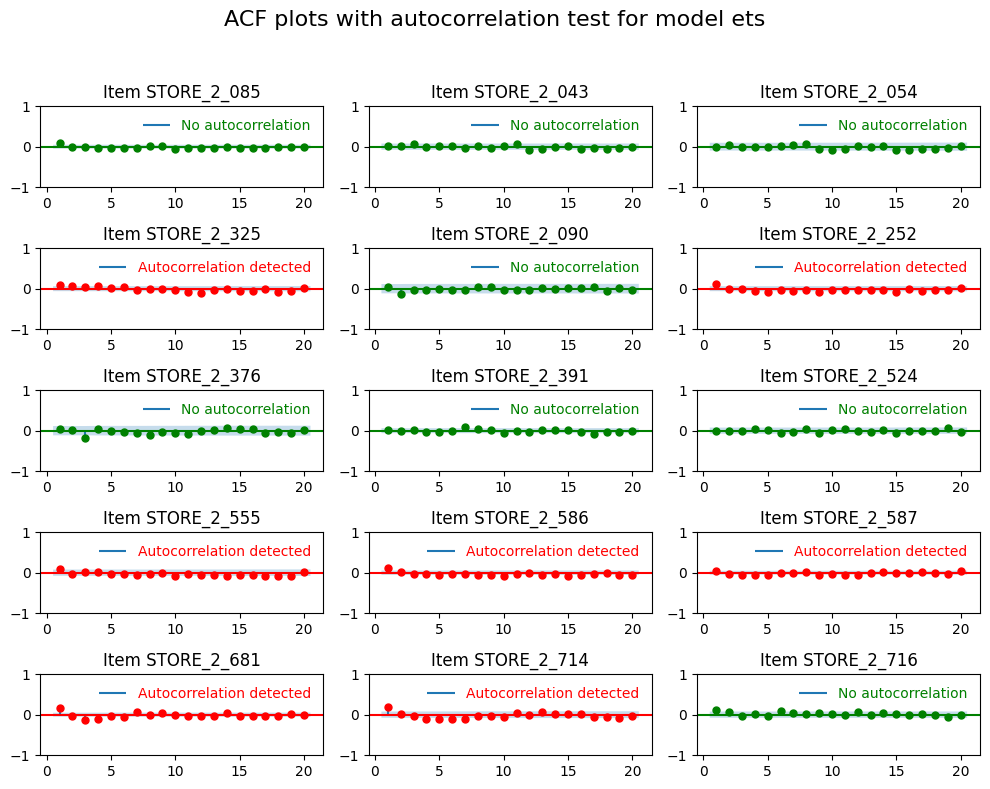

In [715]:
plot_acf_with_pvals(unique_item_ids, MAIN_RESULTS, 'ets', lags=20, figsize=FIGSIZE)

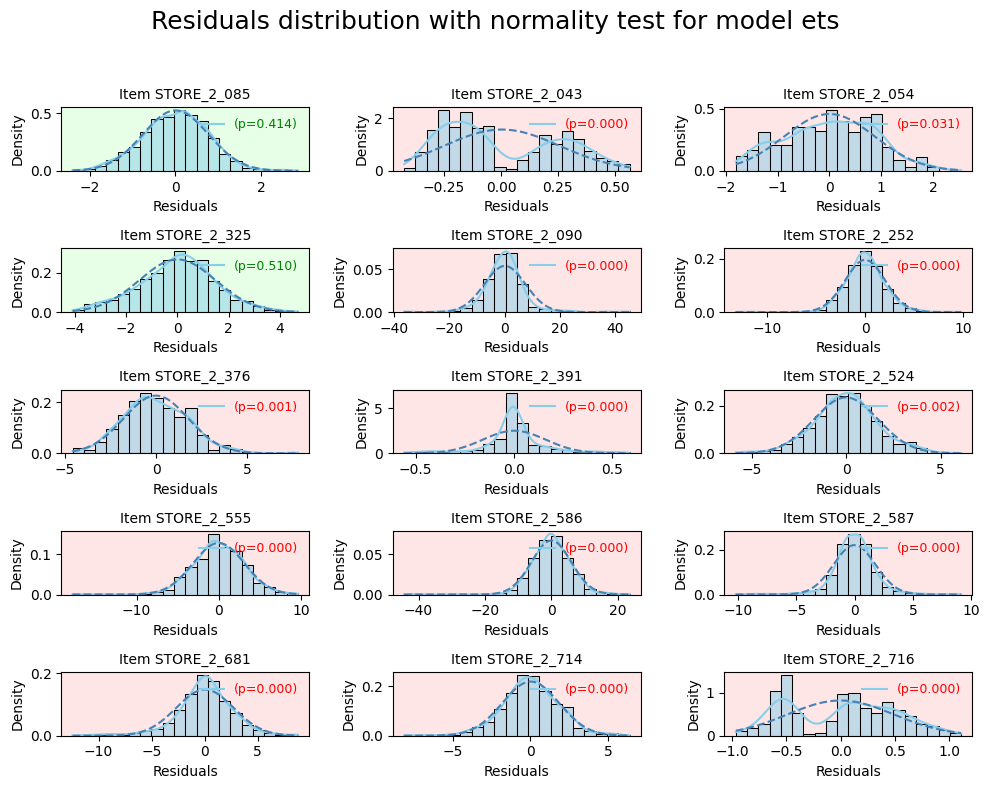

In [716]:
plot_residuals_hist_with_normality(unique_item_ids, MAIN_RESULTS, 'ets', bins=20, figsize=FIGSIZE)

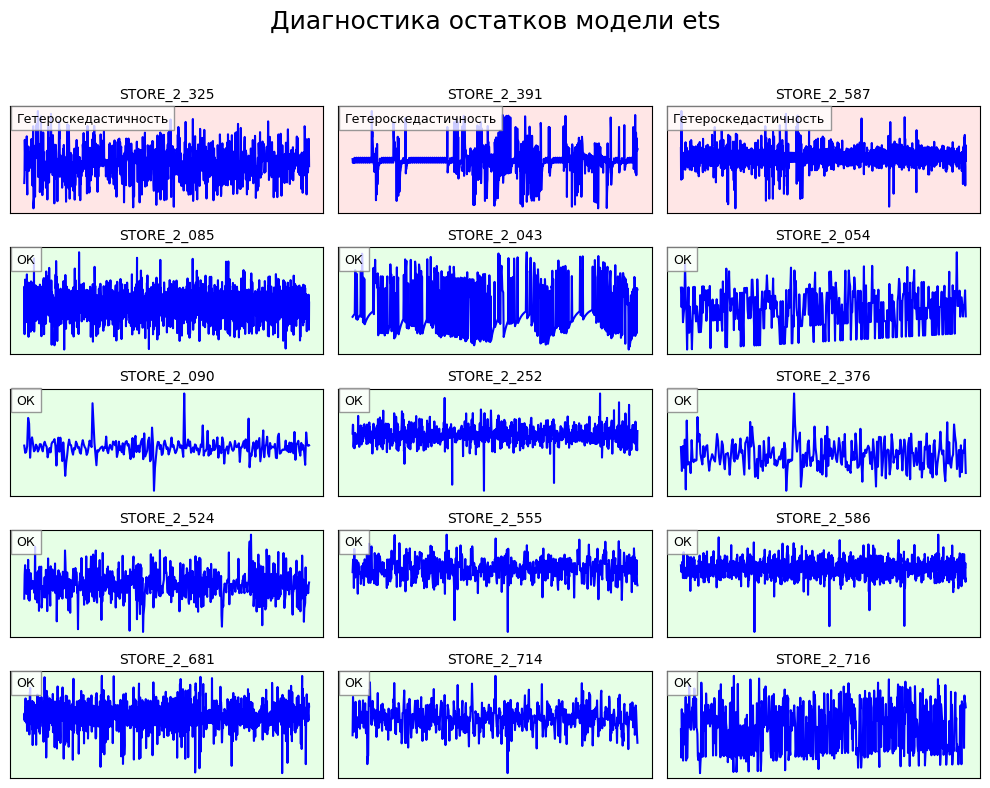

In [ ]:
plot_residuals_diagnostics(unique_item_ids, MAIN_RESULTS, 'ets', FIGSIZE)

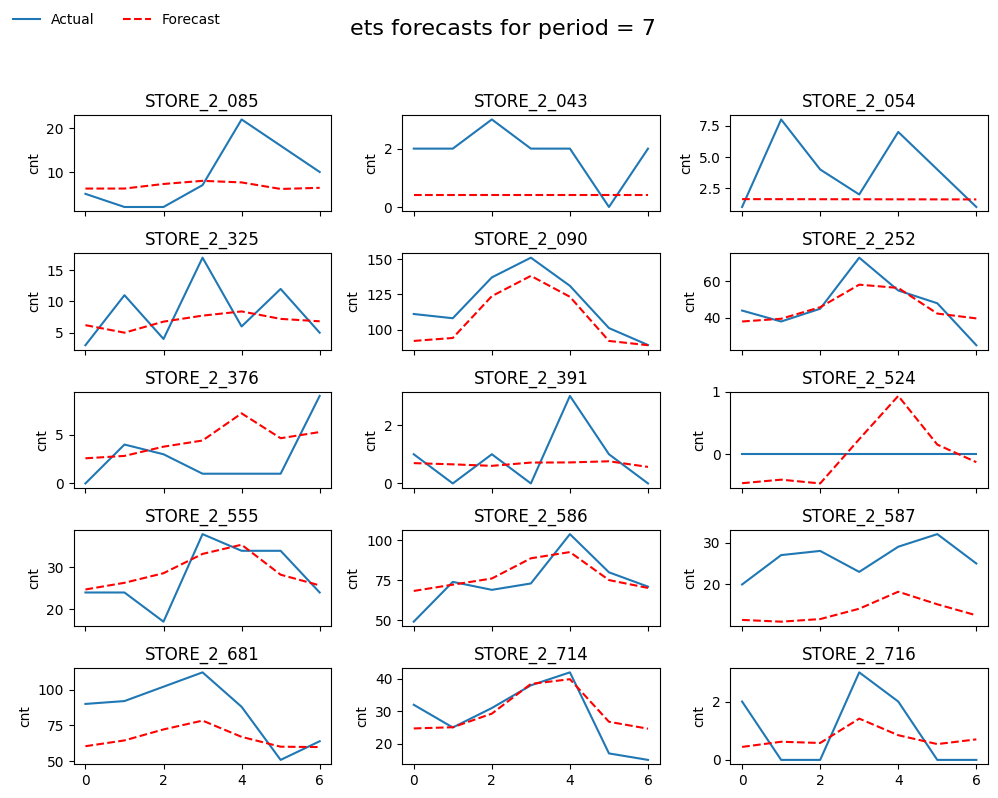

In [684]:
plot_forecasts(unique_item_ids, test, MAIN_RESULTS, model_name='ets', period=7, figsize=FIGSIZE)

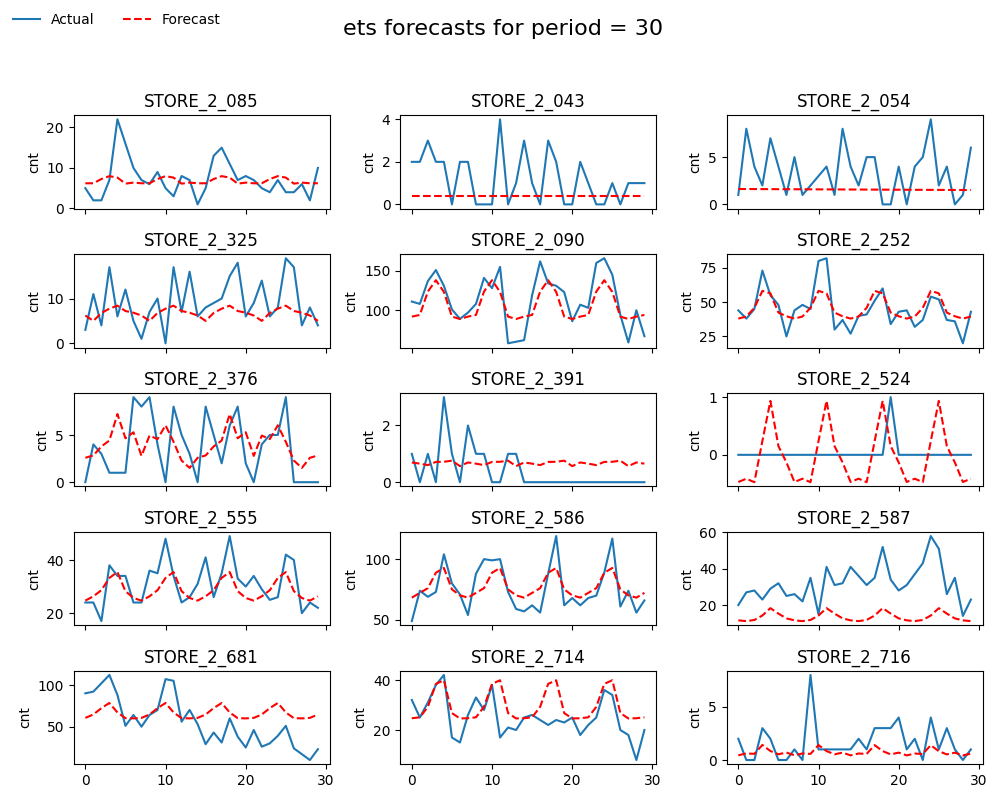

In [685]:
plot_forecasts(unique_item_ids, test, MAIN_RESULTS, model_name='ets', period=30, figsize=FIGSIZE)

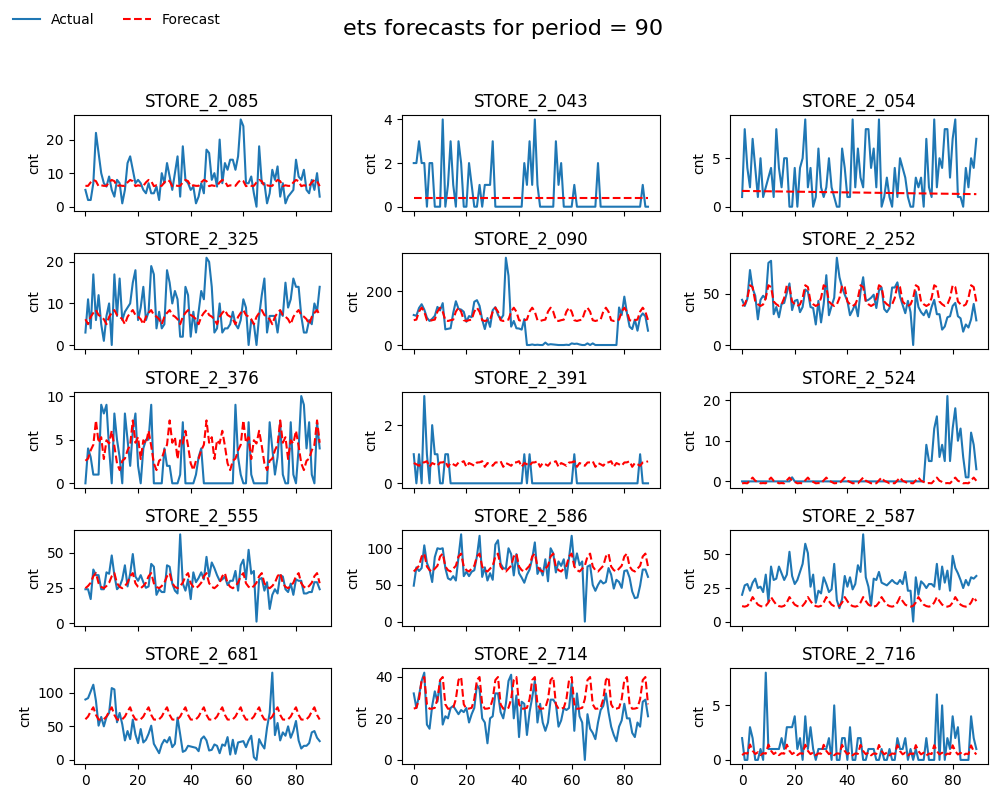

In [686]:
plot_forecasts(unique_item_ids, test, MAIN_RESULTS, model_name='ets', period=90, figsize=FIGSIZE)

# SARIMA Results

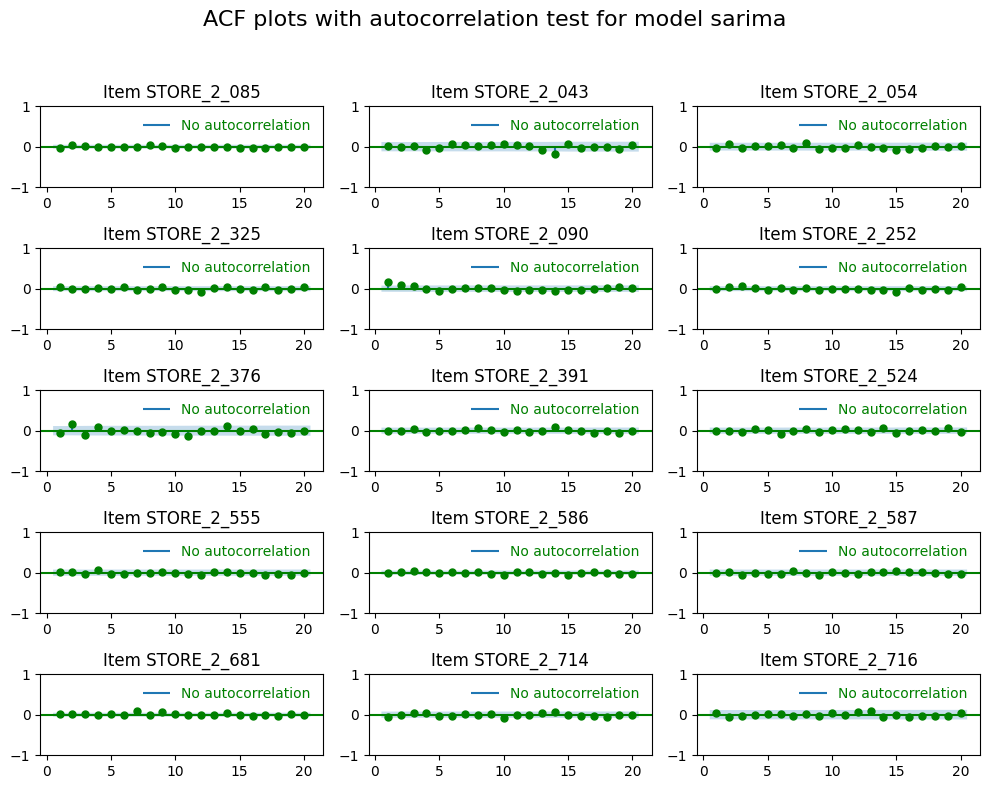

In [717]:
plot_acf_with_pvals(unique_item_ids, MAIN_RESULTS, 'sarima', lags=20, figsize=FIGSIZE)

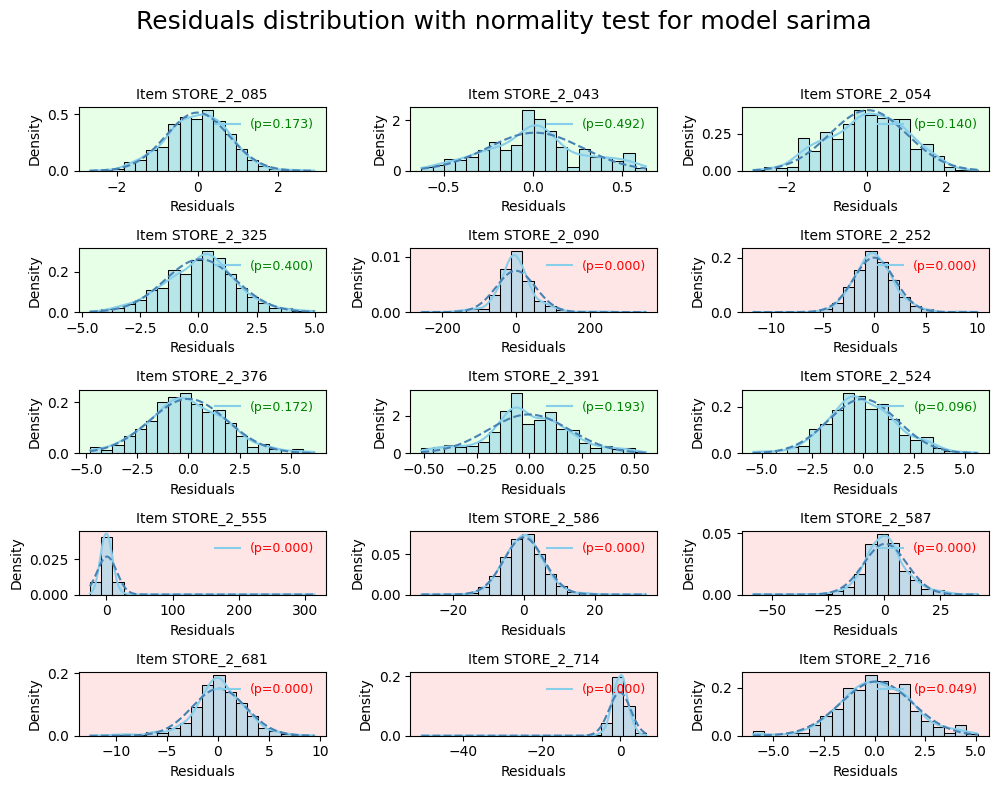

In [718]:
plot_residuals_hist_with_normality(unique_item_ids, MAIN_RESULTS, 'sarima', bins=20, figsize=FIGSIZE)

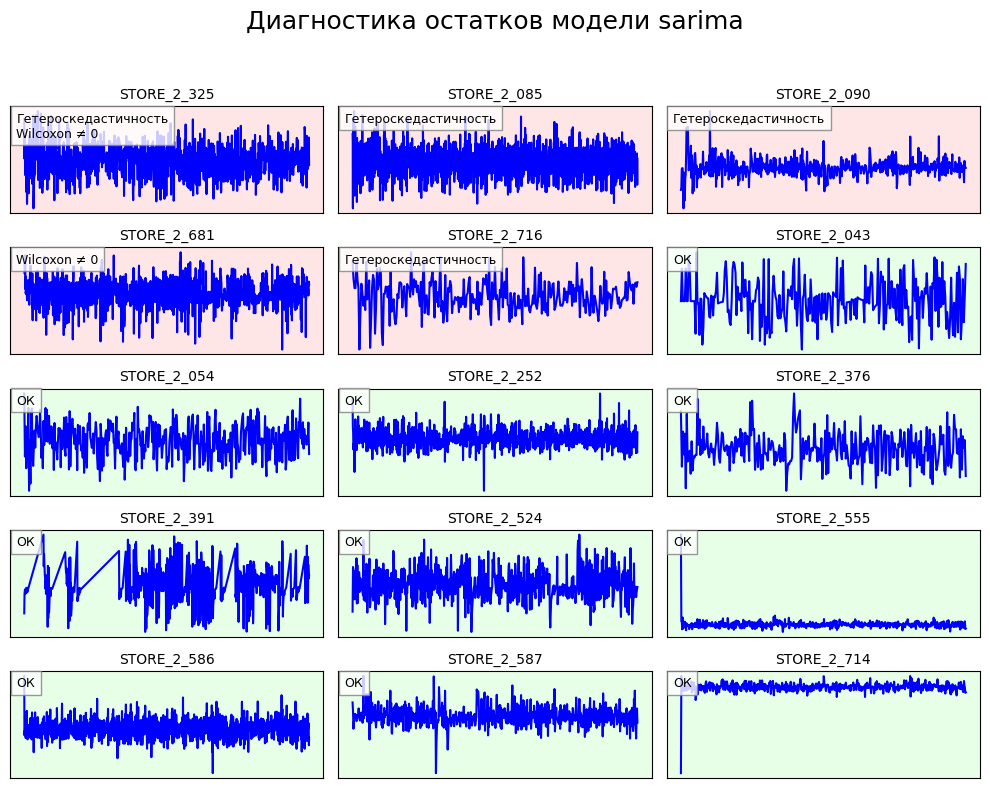

In [ ]:
plot_residuals_diagnostics(unique_item_ids, MAIN_RESULTS, 'sarima', FIGSIZE)

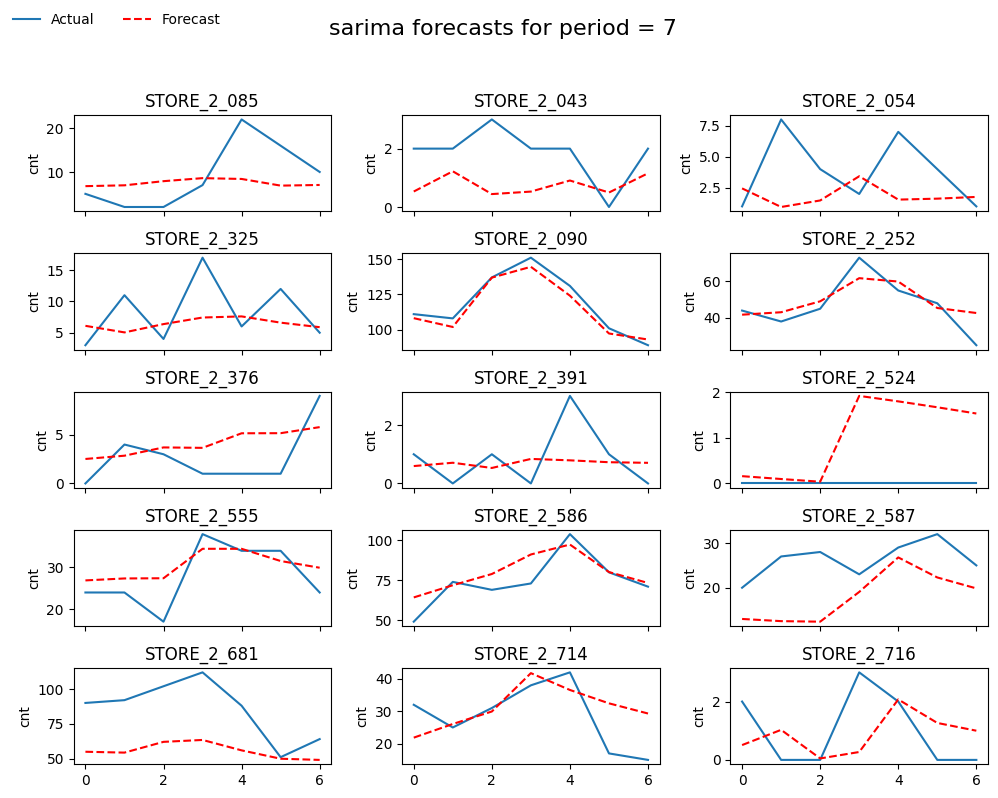

In [687]:
plot_forecasts(unique_item_ids, test, MAIN_RESULTS, model_name='sarima', period=7, figsize=FIGSIZE)

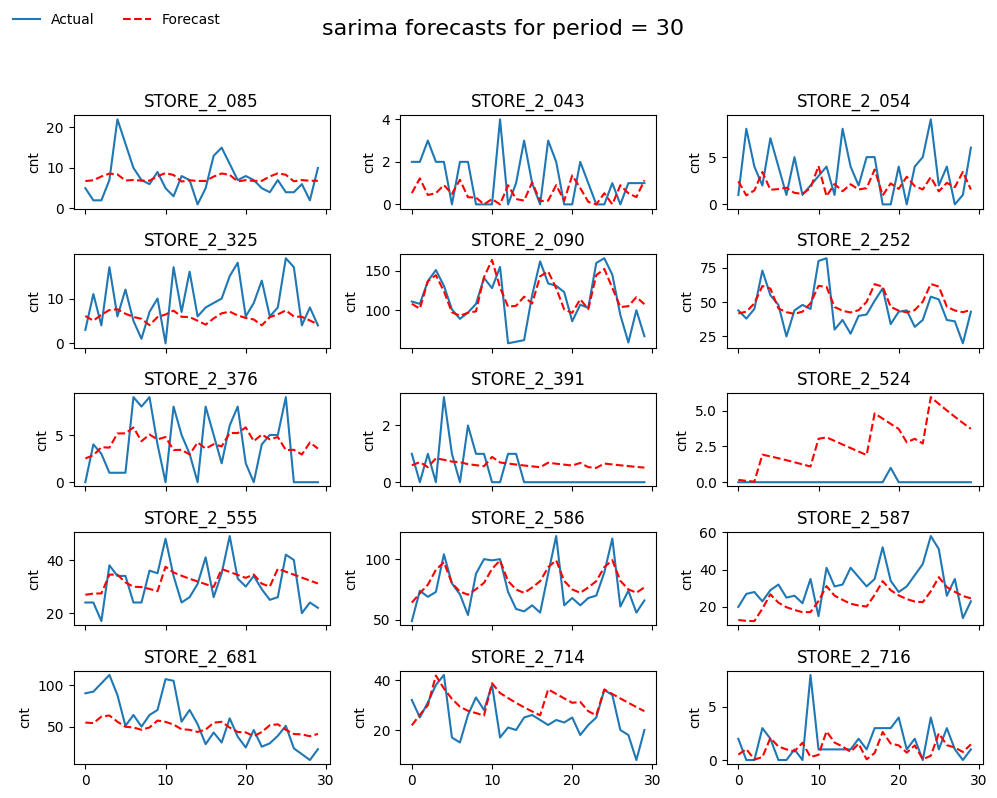

In [688]:
plot_forecasts(unique_item_ids, test, MAIN_RESULTS, model_name='sarima', period=30, figsize=FIGSIZE)

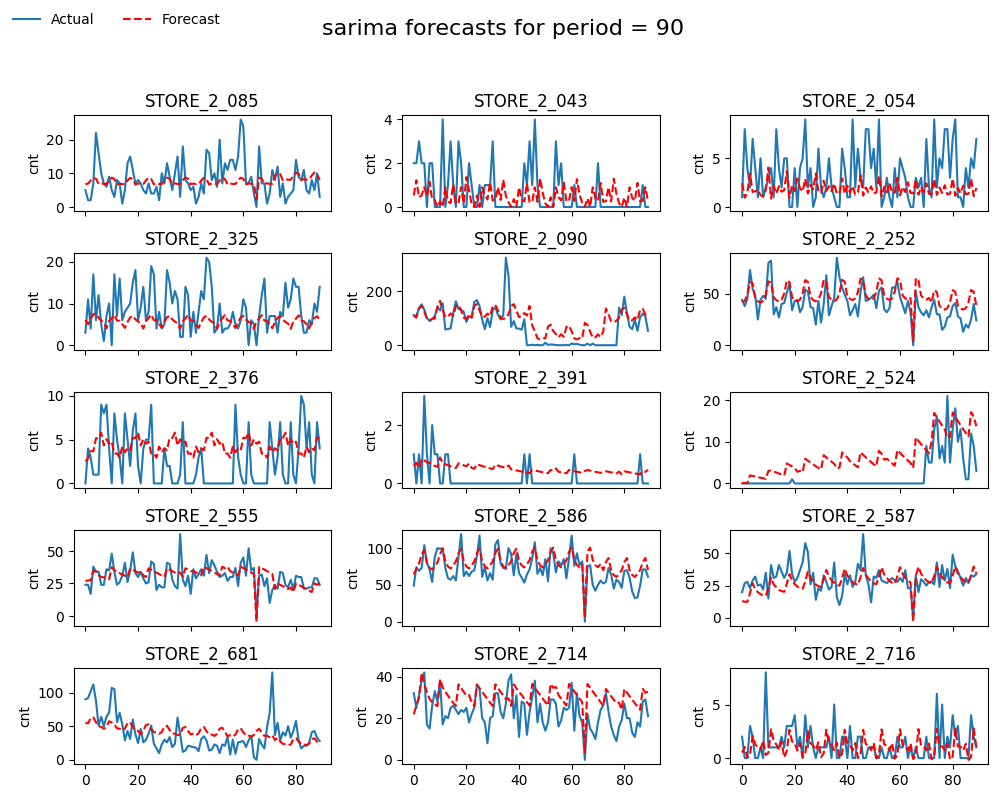

In [689]:
plot_forecasts(unique_item_ids, test, MAIN_RESULTS, model_name='sarima', period=90, figsize=FIGSIZE)

# Prophet Results

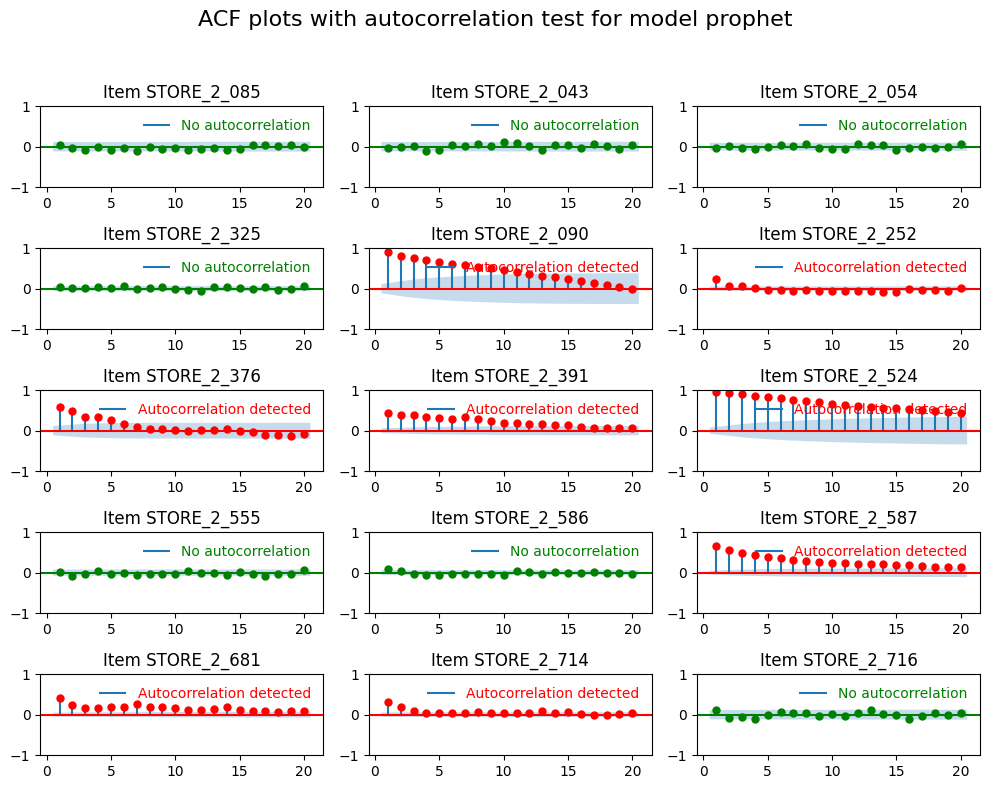

In [721]:
plot_acf_with_pvals(unique_item_ids, MAIN_RESULTS, 'prophet', lags=20, figsize=FIGSIZE)

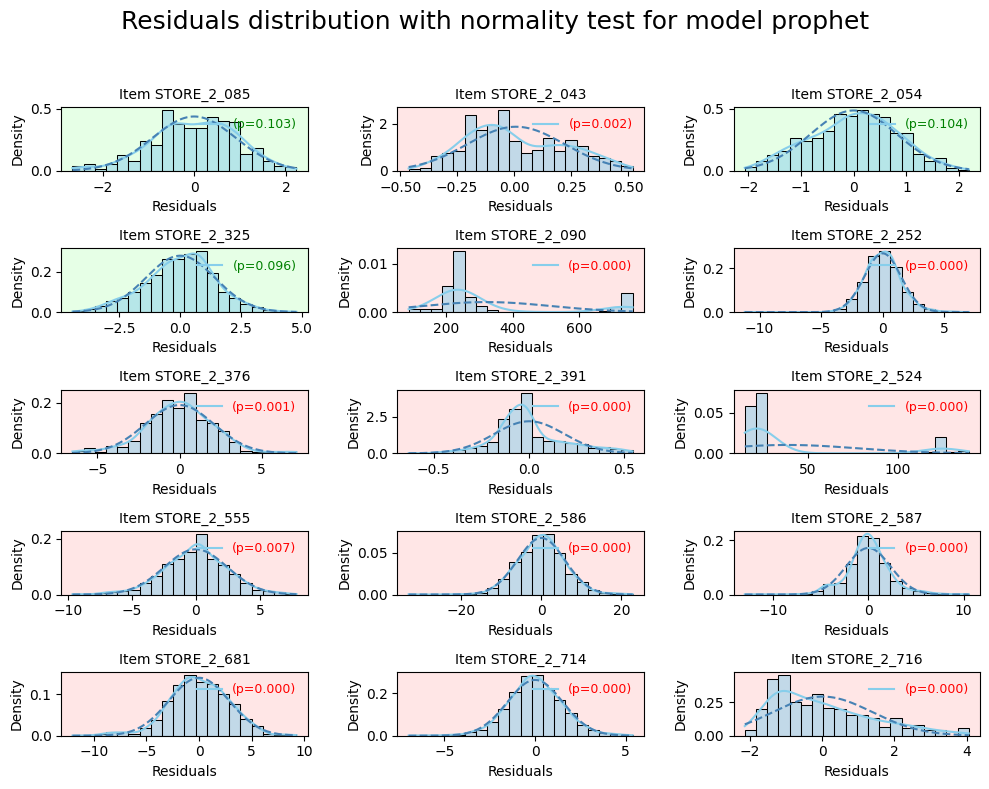

In [722]:
plot_residuals_hist_with_normality(unique_item_ids, MAIN_RESULTS, 'prophet', bins=20, figsize=FIGSIZE)

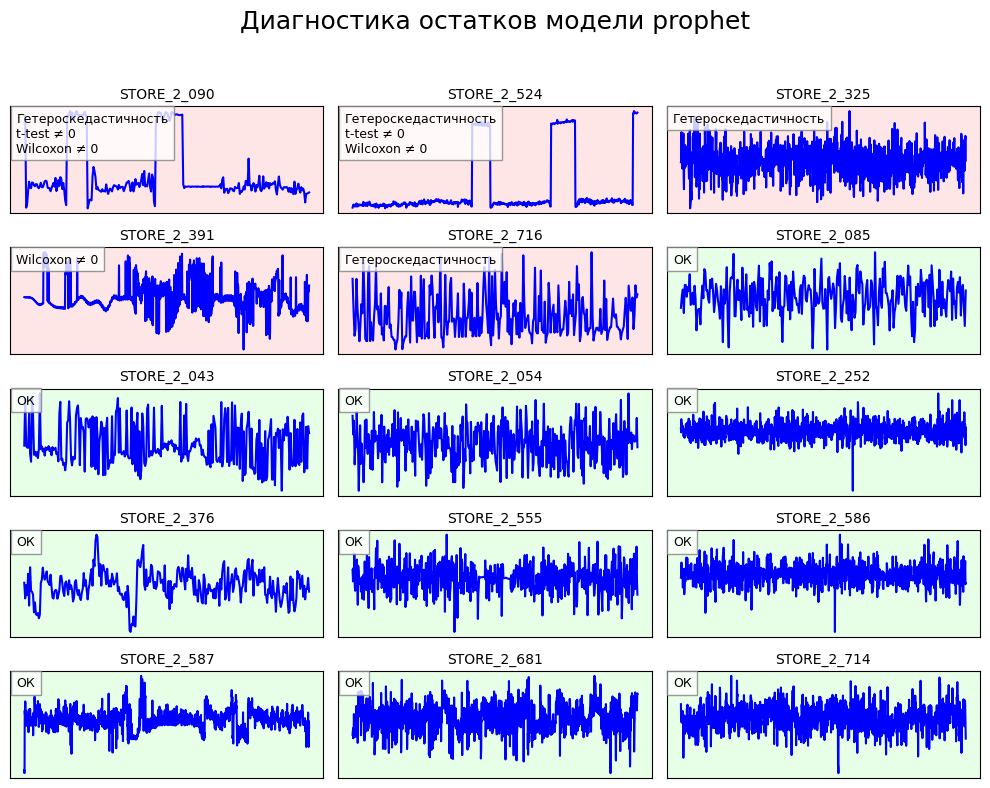

In [723]:
plot_residuals_diagnostics(unique_item_ids, MAIN_RESULTS, 'prophet', FIGSIZE)

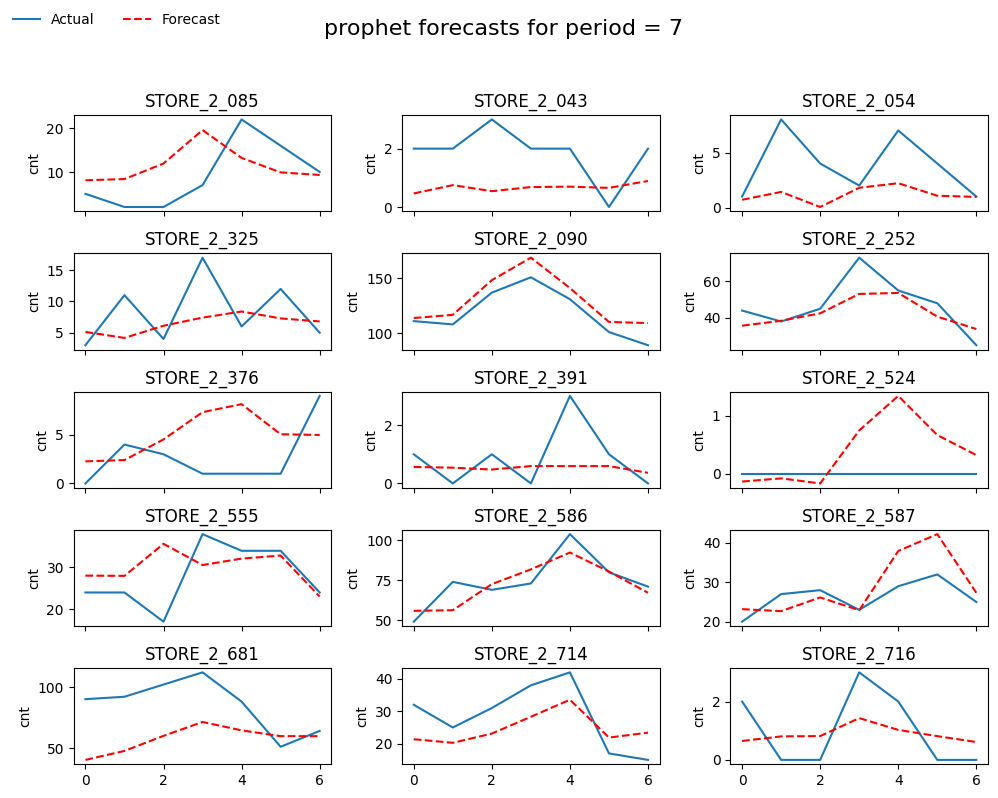

In [690]:
plot_forecasts(unique_item_ids, test, MAIN_RESULTS, model_name='prophet', period=7, figsize=FIGSIZE)

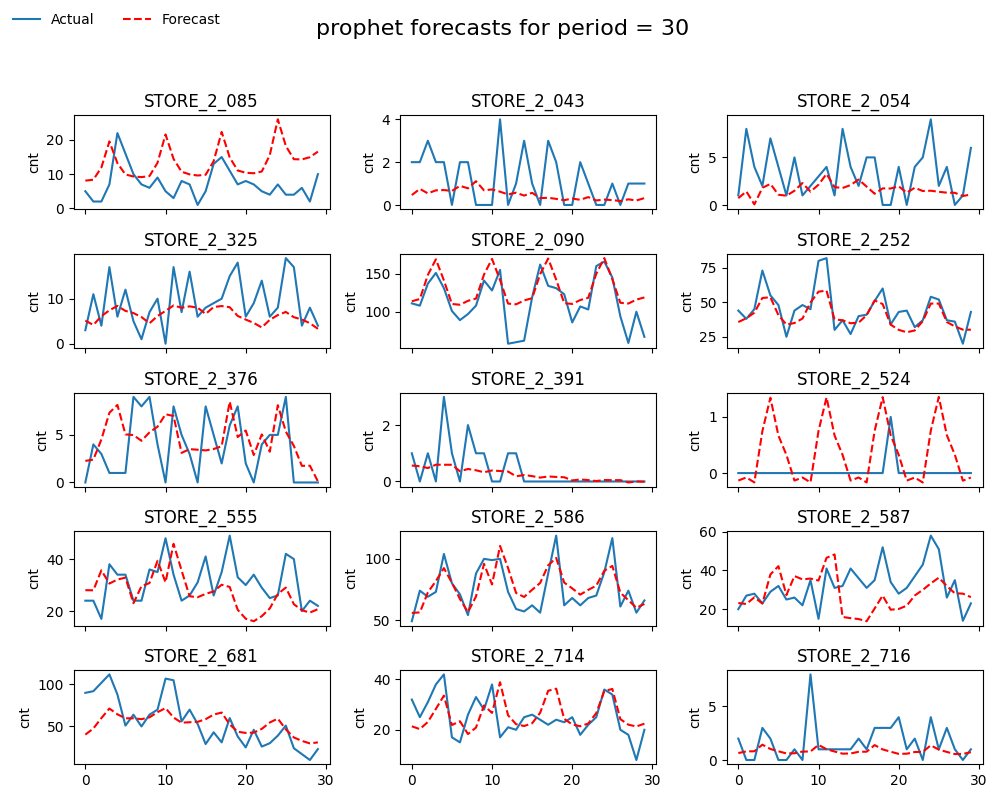

In [691]:
plot_forecasts(unique_item_ids, test, MAIN_RESULTS, model_name='prophet', period=30, figsize=FIGSIZE)


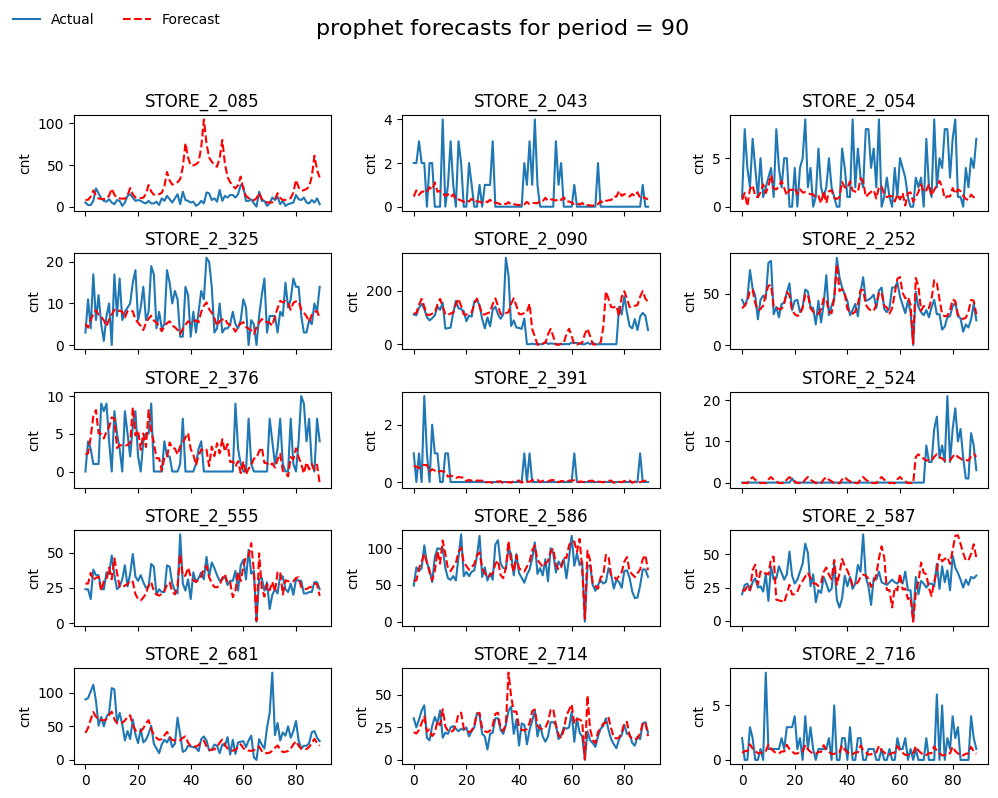

In [692]:
plot_forecasts(unique_item_ids, test, MAIN_RESULTS, model_name='prophet', period=90, figsize=FIGSIZE)


# BOOSTING RESULTS

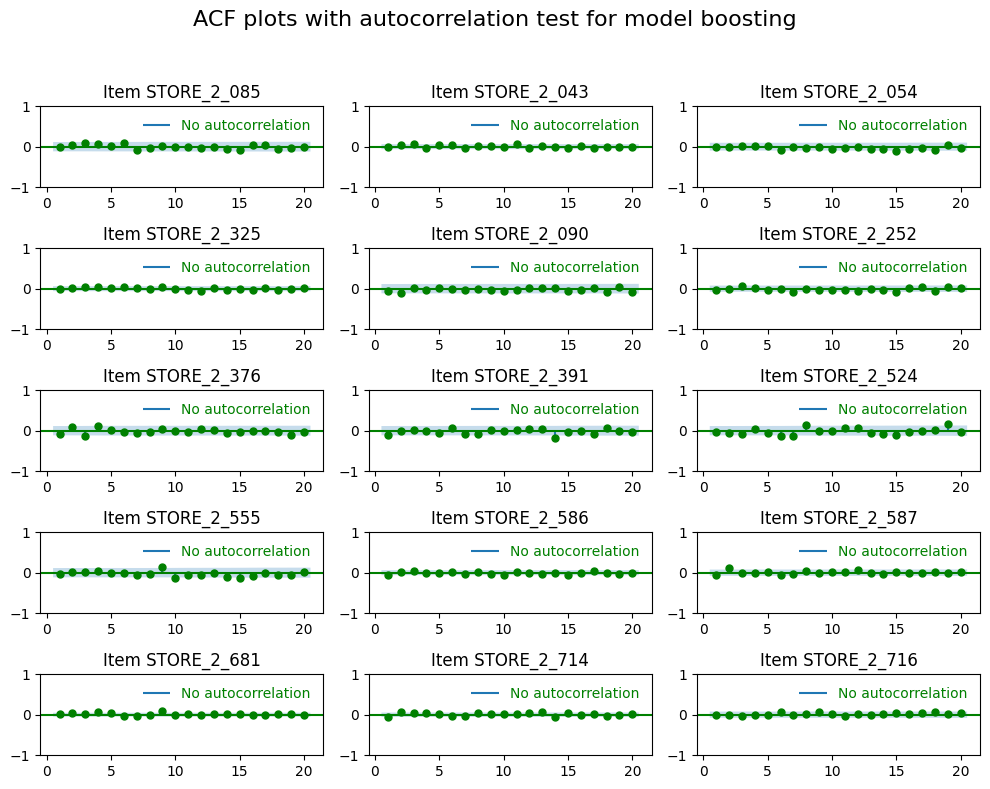

In [724]:
plot_acf_with_pvals(unique_item_ids, MAIN_RESULTS, 'boosting', lags=20, figsize=FIGSIZE)

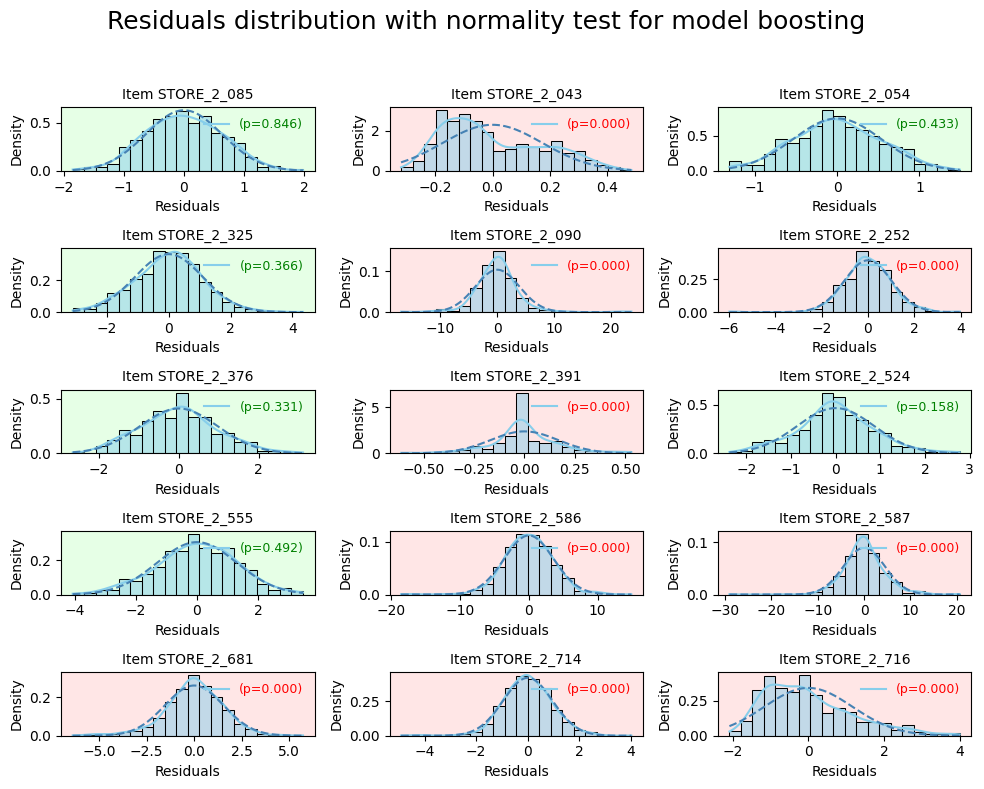

In [725]:
plot_residuals_hist_with_normality(unique_item_ids, MAIN_RESULTS, 'boosting', bins=20, figsize=FIGSIZE)

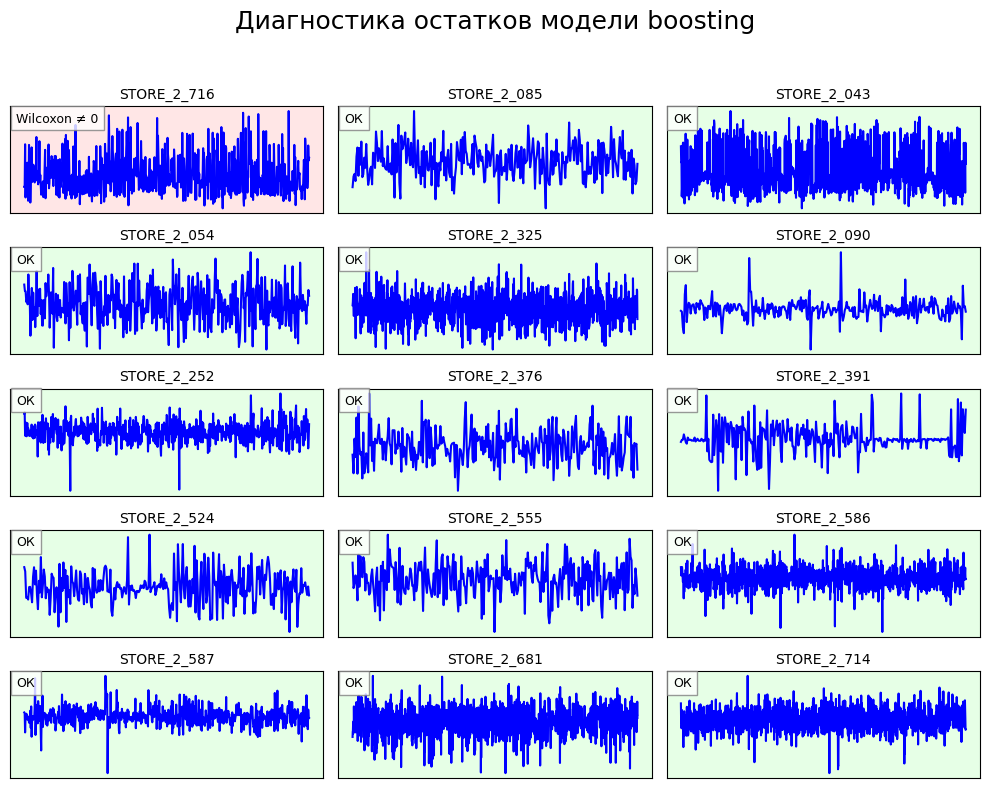

In [726]:
plot_residuals_diagnostics(unique_item_ids, MAIN_RESULTS, 'boosting', FIGSIZE)

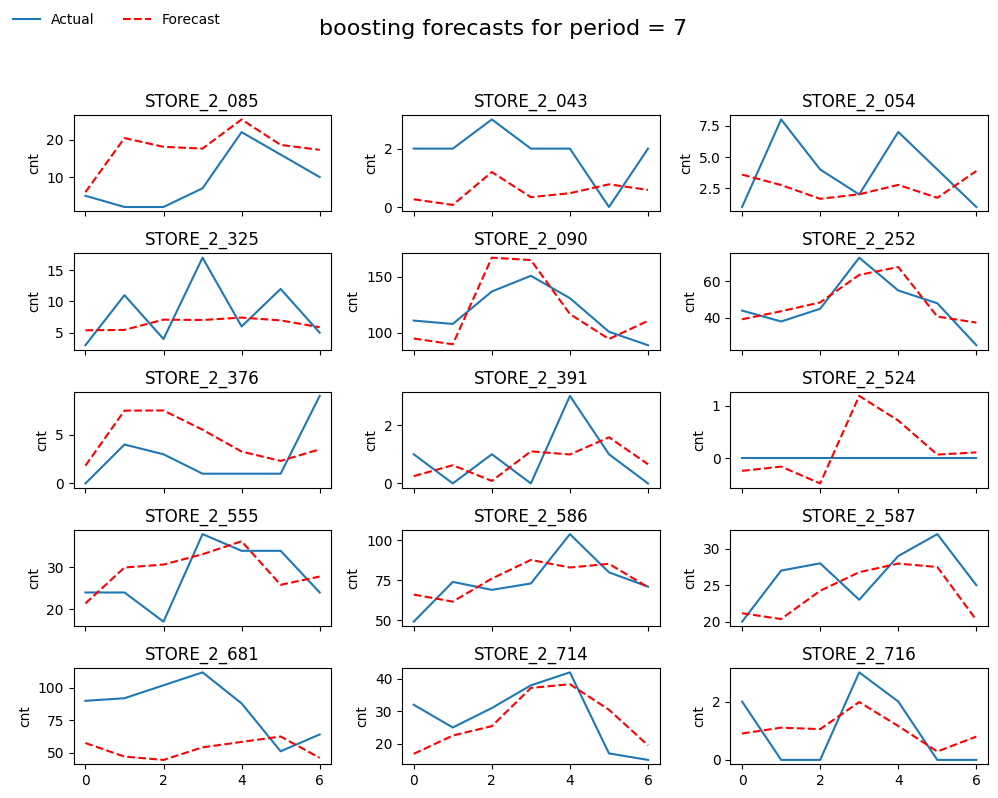

In [693]:
plot_forecasts(unique_item_ids, test, MAIN_RESULTS, model_name='boosting', period=7, figsize=FIGSIZE)

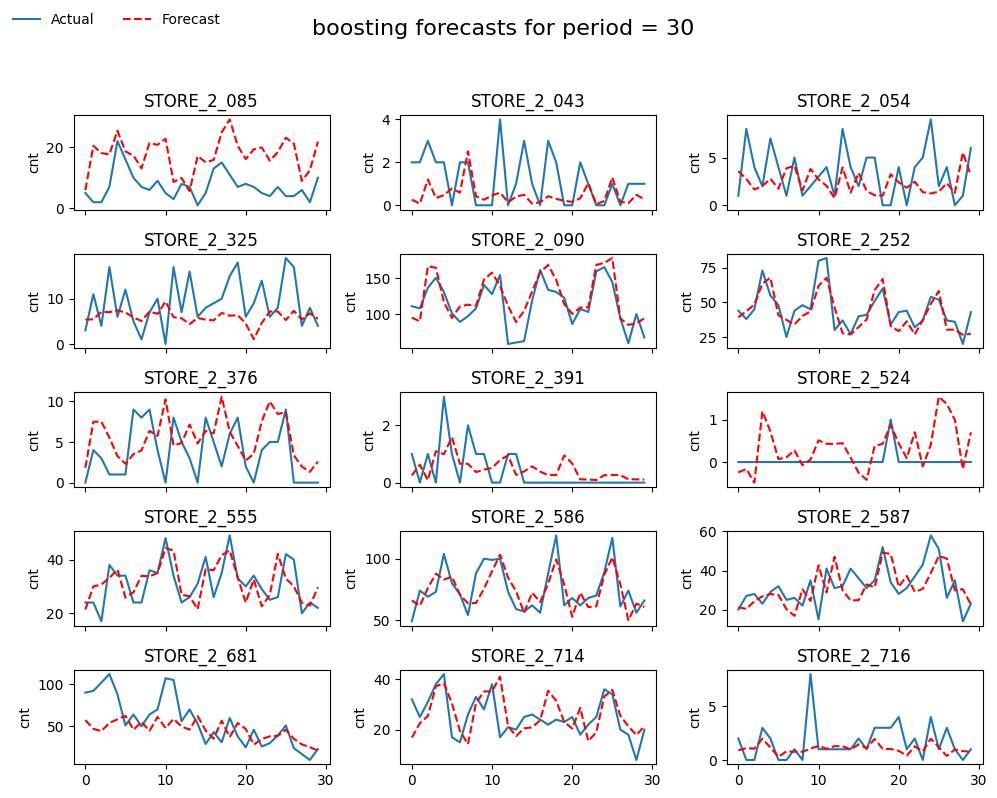

In [694]:
plot_forecasts(unique_item_ids, test, MAIN_RESULTS, model_name='boosting', period=30, figsize=FIGSIZE)

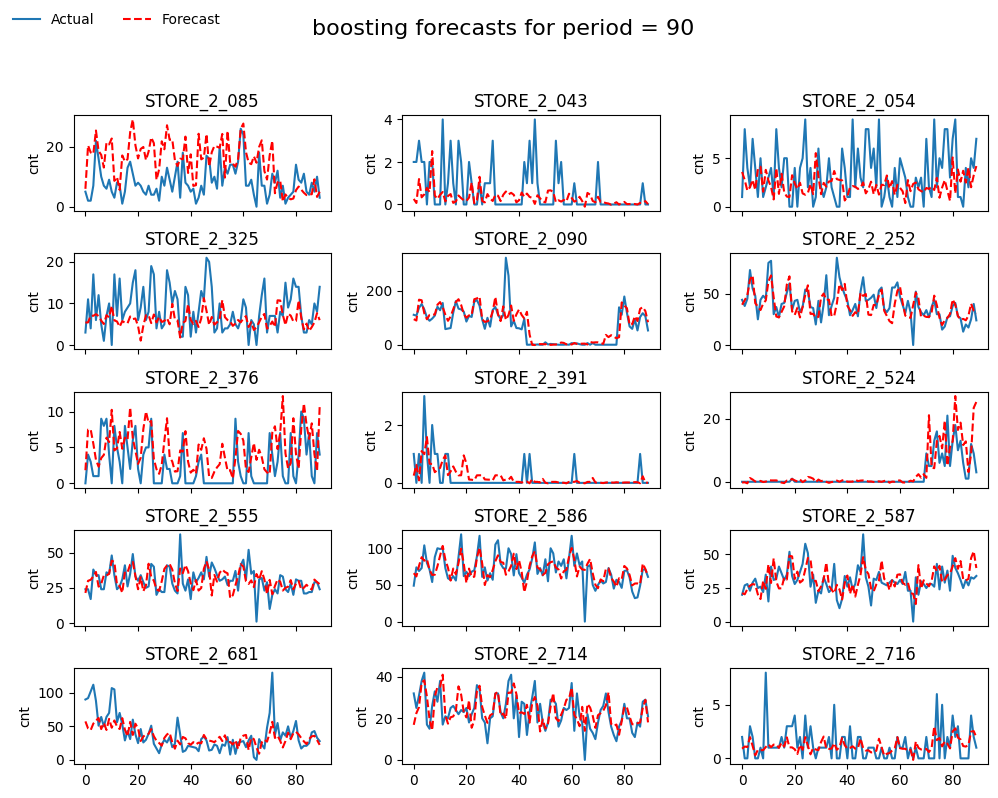

In [695]:
plot_forecasts(unique_item_ids, test, MAIN_RESULTS, model_name='boosting', period=90, figsize=FIGSIZE)